In [1]:
# Passage extremes

In [2]:
import sys; sys.path.append('../..')

In [3]:
from abslithist import *

In [4]:

def get_current_dfall(corpus_name='CanonFiction'):
    cdf=pd.DataFrame(readgen_jsonl(PATH_PSGS))
    cdf=cdf[cdf.num_total == cdf.num_total.max()]
    cdf['abs-conc']=cdf['num_abs']-cdf['num_conc']
    cdf['abs/conc']=cdf['num_abs']/cdf['num_conc']

    import lltk
    C=lltk.load(corpus_name)
    cdf['abs/conc']=cdf['num_abs']/cdf['num_conc']
    cdf['abs-conc']=cdf['num_abs']-cdf['num_conc']
    cdf['abs-conc_z']=zscore(cdf['abs-conc'])
    dfall=cdf.merge(C.metadata,on='id').sort_values('abs-conc')
    dfall=dfall[
        ['id','year','title','author','passage','abs-conc','abs-conc_z',
        'num_abs','num_conc','num_neither','num_types','num_total','num_tokens']
    ]
    return dfall

In [5]:
dfall=get_current_dfall()
dfall

Reading data.absconc.CanonFiction.psgs.v9-zcut05.jsonl: 100%|██████████| 548268/548268 [00:32<00:00, 16624.73it/s]


,id,year,title,author,passage,abs-conc,abs-conc_z,num_abs,num_conc,num_neither,num_types,num_total,num_tokens
313913,chadwyck.Scott.Kenilworth_in_the_Waverle.1316,1831,"Kenilworth [in, the Waverley Novels]","Scott, Walter, Sir, 1771-1832",***richly*** embrothered with my Lo. ***arms**...,-90,-3.138305,1,91,8,61,100,100
38732,Rabelais.Gargantua and Pantagruel,1534,Gargantua and Pantagruel,Rabelais,"***Fawns***, ***deer***.\\ ***Lumber*** ***pie...",-88,-3.075373,1,89,10,83,100,100
38845,Rabelais.Gargantua and Pantagruel,1534,Gargantua and Pantagruel,Rabelais,***Eggs***.\\\\ ***Pan***. How do they Like'em...,-87,-3.043907,1,88,11,56,100,100
485021,markmark.Le Guin.Always_Coming_Home.1551,1985,Always Coming Home,"Le Guin, Ursula K.","***tomatoes*** are not in ***season***, ***dou...",-87,-3.043907,1,88,11,72,100,100
461364,markmark.Hemingway.In_Our_Time.1497,1925,In Our Time,"Hemingway, Ernest Miller",. He ***shook*** the ***skillet*** ***sideways...,-86,-3.012441,1,87,12,73,100,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...
519750,markmark.Stein.The_Making_of_Americans.1630,1925,The Making of Americans,"Stein, Gertrude",to be doing to be one going on being ```living...,95,2.682942,96,1,3,16,100,100
519746,markmark.Stein.The_Making_of_Americans.1630,1925,The Making of Americans,"Stein, Gertrude",. Some are almost really certain sometime that...,98,2.777341,98,0,2,8,100,100
519824,markmark.Stein.The_Making_of_Americans.1630,1925,The Making of Americans,"Stein, Gertrude",. Any one in any family ```living``` can be on...,99,2.808807,99,0,1,6,100,100
519693,markmark.Stein.The_Making_of_Americans.1630,1925,The Making of Americans,"Stein, Gertrude",```wanting``` not ```angry``` ```feeling``` be...,99,2.808807,99,0,1,10,100,100


In [6]:


def show_extremes(dfall, name='concrete',corpus_name='CanonFiction'):
    C=lltk.load(corpus_name)
    topn=25
    most_conc = dfall.head(topn)
    most_abs = dfall[dfall.title!='The Making of Americans'].sort_values('abs-conc',ascending=False).head(topn)
    most = most_conc if name.startswith('c') else most_abs
    
    for i,(index,row) in enumerate(tqdm(list(most.iterrows()))):
        idx=row.id
        t=C.textd[idx]
        title=f'''#{i+1} most {name} passage: {row.author.split(',')[0]}, _{row.title[:50]}_ ({row.year})'''
        showpsg(
            row.passage,
            title,
            t.txt,
            periods={year2period(t.year)}
        )
    #     break


  0%|          | 0/25 [00:00<?, ?it/s]

#### #1 most concrete passage: Scott, _Kenilworth [in, the Waverley Novels]_ (1831)

<p><neither><conc721>richly</conc721></neither> embrothered with my Lo. <neither><conc637>arms</conc637></neither> in a <neither><conc724>garland</conc724></neither> of <conc><conc960>hops</conc960></conc>, <conc><conc958>roses</conc958></conc>, and pomegranetts, and <conc><conc940>lined</conc940></conc> with buckerom. Fyve <conc><conc974>curtains</conc974></conc> of <conc><conc948>crimson</conc948></conc> <conc><conc993>satin</conc993></conc> to the same <conc><conc992>bedstead</conc992></conc>, <conc><conc991>striped</conc991></conc> down with a <conc><conc861>bone</conc861></conc> <conc><conc980>lace</conc980></conc> of <neither><conc615>gold</conc615></neither> and <neither><conc664>silver</conc664></neither>, <conc><conc911>garnished</conc911></conc> with <conc><conc879>buttons</conc879></conc> and <conc><conc982>loops</conc982></conc> of <conc><conc948>crimson</conc948></conc> <conc><conc988>silk</conc988></conc> and <neither><conc615>gold</conc615></neither>, containing xiiii <conc><conc968>breadths</conc968></conc> of <conc><conc993>satin</conc993></conc>, and one <conc><conc983>yard</conc983></conc> iij <neither><conc594>quarters</conc594></neither> <neither><conc586>deep</conc586></neither>. The celor, vallance, and <conc><conc974>curtains</conc974></conc> <conc><conc940>lined</conc940></conc> with <conc><conc948>crimson</conc948></conc> taffeta sarsenet. A <conc><conc948>crimson</conc948></conc> <conc><conc993>satin</conc993></conc> counterpointe, <conc><conc996>quilted</conc996></conc> and embr. with a <neither><conc615>gold</conc615></neither> <conc><conc786>twist</conc786></conc>, and <conc><conc940>lined</conc940></conc> with <conc><conc954>red</conc954></conc> sarsenet, being in <neither><conc532>length</conc532></neither> iij <conc><conc910>yards</conc910></conc> good, and in <neither><conc485>breadth</conc485></neither> iij <neither><conc700>scant</conc700></neither>. A <conc><conc921>chaise</conc921></conc> of <conc><conc948>crimson</conc948></conc> <conc><conc993>satin</conc993></conc>, <neither><conc485>suitable</conc485></neither>. A <neither><conc381>fair</conc381></neither> <conc><conc999>quilt</conc999></conc> of <conc><conc948>crimson</conc948></conc> <conc><conc993>satin</conc993></conc>, vj <conc><conc968>breadths</conc968></conc>, iij yards3 <neither><conc594>quarters</conc594></neither> <conc><conc921>nail</conc921></conc> <neither><conc586>deep</conc586></neither>, all lozenged over with <neither><conc664>silver</conc664></neither> <conc><conc786>twist</conc786></conc>, in the amid a cinquefoil within a <neither><conc724>garland</conc724></neither> of <conc><conc861>ragged</conc861></conc> <conc><conc926>staves</conc926></conc>, <conc><conc977>fringed</conc977></conc> <conc><conc952>round</conc952></conc> about with a <conc><conc817>small</conc817></conc> <conc><conc992>fringe</conc992></conc> of <conc><conc948>crimson</conc948></conc> <conc><conc988>silk</conc988></conc>, <conc><conc940>lined</conc940></conc> through with <conc><conc937>white</conc937></conc> <conc><conc823>fustian</conc823></conc>. Fyve <conc><conc861>plumes</conc861></conc> of coolered <conc><conc968>feathers</conc968></conc>, <conc><conc911>garnished</conc911></conc> with <conc><conc861>bone</conc861></conc> <conc><conc980>lace</conc980></conc> and spangells of <neither><conc615>gold</conc615></neither> and <neither><conc664>silver</conc664></neither>, <neither><conc608>standing</conc608></neither> in cupsProbably on the <conc><conc782>centre</conc782></conc> and four <conc><conc885>corners</conc885></conc> of the <conc><conc992>bedstead</conc992></conc>. Four <neither><conc486>bears</conc486></neither> and <conc><conc861>ragged</conc861></conc> <conc><conc926>staves</conc926></conc> <neither><conc504>occupied</conc504></neither> a similar <neither><conc268>position</conc268></neither> on another of these <conc><conc747>sumptuous</conc747></conc> <conc><conc849>pieces</conc849></conc> of <conc><conc879>furniture</conc879></conc>. <conc><conc766>knit</conc766></conc> all over with <neither><conc615>gold</conc615></neither>, <neither><conc664>silver</conc664></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

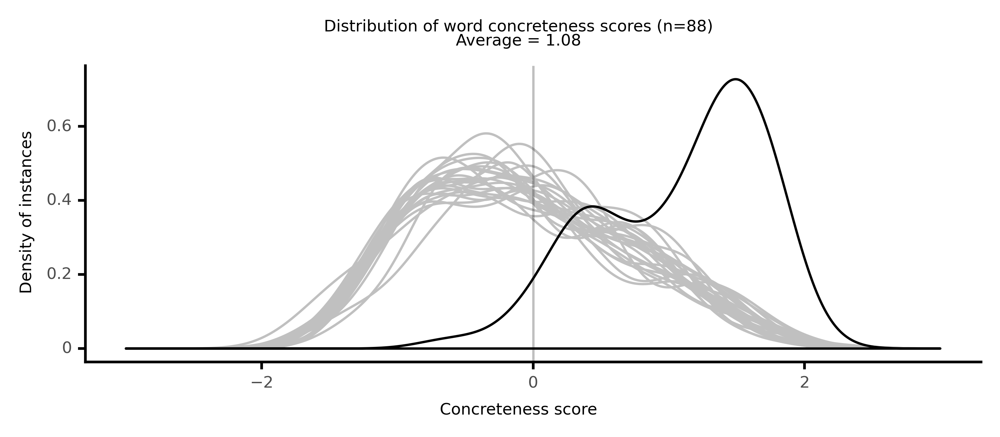

<ggplot: (8786768190065)>

  4%|▍         | 1/25 [00:18<07:28, 18.67s/it]

#### #2 most concrete passage: Rabelais, _Gargantua and Pantagruel_ (1534)

<p><conc><conc925>Fawns</conc925></conc>, <neither><conc510>deer</conc510></neither>. Lumber <conc><conc985>pies</conc985></conc>, with with their own <conc><conc964>Hares</conc964></conc>, leverets. <conc><conc897>hight</conc897></conc> <conc><conc882>sauce</conc882></conc>. <conc><conc988>dripping</conc988></conc>. Plovers. <conc><conc983>Partridges</conc983></conc> and <conc><conc860>young</conc860></conc> Flamingoes. Herons, and <conc><conc860>young</conc860></conc> <conc><conc983>partridges</conc983></conc>. Cygnets. herons. Dwarf-herons. A reinforcement of <conc><conc957>Olives</conc957></conc>. Teals. <conc><conc949>vinegar</conc949></conc> <conc><conc872>intermixed</conc872></conc>. <conc><conc993>Thrushes</conc993></conc>. Duckers. <conc><conc967>Venison</conc967></conc> <conc><conc972>pasties</conc972></conc>. <conc><conc860>Young</conc860></conc> sea-ravens. Bitterns. <conc><conc949>Lark</conc949></conc> <conc><conc985>pies</conc985></conc>. <conc><conc955>Geese</conc955></conc>, <conc><conc983>goslings</conc983></conc>. Shovellers. Dormice <conc><conc985>pies</conc985></conc>. Queests. Curlews. Cabretto <conc><conc972>pasties</conc972></conc>. Widgeons. Wood-hens. <conc><conc994>Roebuck</conc994></conc> <conc><conc972>pasties</conc972></conc>. Mavises. Coots, with <conc><conc970>leeks</conc970></conc>. <conc><conc995>Pigeon</conc995></conc> <conc><conc985>pies</conc985></conc>. Grouses. <conc><conc902>Fat</conc902></conc> <conc><conc990>kids</conc990></conc>. <conc><conc986>Kid</conc986></conc> <conc><conc972>pasties</conc972></conc>. <conc><conc969>Turtles</conc969></conc>. <conc><conc916>Shoulders</conc916></conc> of <conc><conc963>mutton</conc963></conc>, <conc><conc967>Capon</conc967></conc> <conc><conc985>pies</conc985></conc>. Doe-coneys. with <conc><conc981>capers</conc981></conc>. <conc><conc950>Bacon</conc950></conc> <conc><conc985>pies</conc985></conc>. Hedgehogs. Sirloins of <conc><conc972>beef</conc972></conc>. <conc><conc904>Soused</conc904></conc> <conc><conc983>hog</conc983></conc>'s <conc><conc936>feet</conc936></conc>. Snites. <conc><conc950>Breasts</conc950></conc> of veal. <conc><conc941>Fried</conc941></conc> pasty-crust. Then <neither><conc661>large</conc661></neither> <conc><conc850>puffs</conc850></conc>. Pheasants and phea- <neither><conc443>Forced</conc443></neither> <conc><conc973>capons</conc973></conc>. Thistle-finches. <conc><conc893>sant</conc893></conc> poots. Parmesan <conc><conc919>cheese</conc919></conc>. <conc><conc888>Whore</conc888></conc>'s farts. <conc><conc962>Peacocks</conc962></conc>. <conc><conc931>Red</conc931></conc> and <conc><conc909>pale</conc909></conc> hip- <conc><conc989>Fritters</conc989></conc>. <conc><conc978>Storks</conc978></conc>. pocras. <conc><conc966>Cakes</conc966></conc>, sixteen <neither><conc412>sorts</conc412></neither>. <conc><conc936>Woodcocks</conc936></conc>. Gold-peaches. <conc><conc994>Crisp</conc994></conc> <conc><conc989>wafers</conc989></conc>. Snipes. Artichokes. <conc><conc985>Quince</conc985></conc> <conc><conc942>tarts</conc942></conc>. Ortolans. <conc><conc923>Dry</conc923></conc> and <conc><conc982>wet</conc982></conc> <neither><conc724>sweet-</conc724></neither> <conc><conc976>Curds</conc976></conc> and <conc><conc979>cream</conc979></conc>. <conc><conc938>Turkey</conc938></conc> <conc><conc982>cocks</conc982></conc>, <conc><conc946>hen</conc946></conc> <neither><conc633>meats</conc633></neither>, seventy- <conc><conc837>Whipped</conc837></conc> <conc><conc979>cream</conc979></conc>. turkeys, and <conc><conc938>turkey</conc938></conc> eight <neither><conc412>sorts</conc412></neither>. <neither><conc369>Preserved</conc369></neither> mirabo- poots. <conc><conc931>Boiled</conc931></conc> <conc><conc943>hens</conc943></conc>, and <conc><conc902>fat</conc902></conc> lans. Stock-doves, and <conc><conc973>capons</conc973></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

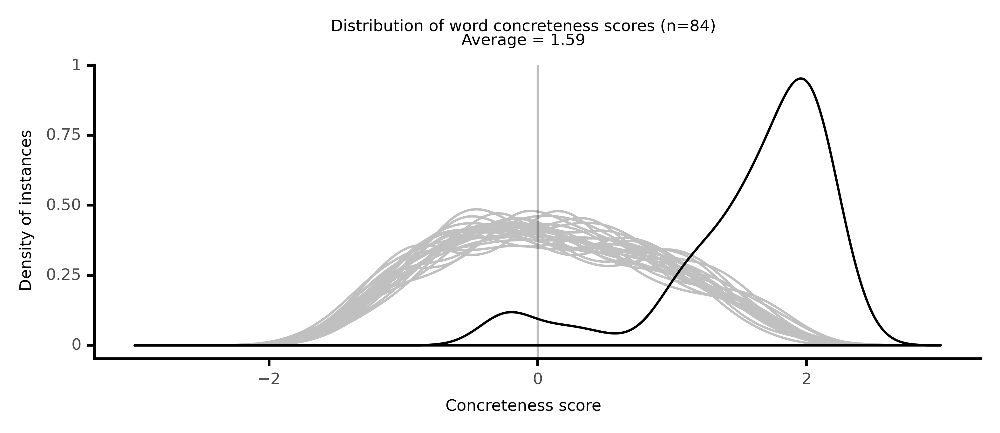

<ggplot: (8786695794473)>

  8%|▊         | 2/25 [00:35<06:58, 18.21s/it]

#### #3 most concrete passage: Rabelais, _Gargantua and Pantagruel_ (1534)

<p><conc><conc982>Eggs</conc982></conc>. <conc><conc952>Pan</conc952></conc>. How do they Like'em? Fri. <conc><conc931>Boiled</conc931></conc>. <conc><conc952>Pan</conc952></conc>. How must they be done? Fri. <neither><conc768>Hard</conc768></neither>. <conc><conc952>Pan</conc952></conc>. Is this all they have? Fri. No. <conc><conc952>Pan</conc952></conc>. What have they beside, then? Fri. <conc><conc972>Beef</conc972></conc>. <conc><conc952>Pan</conc952></conc>. And what else? Fri. <conc><conc924>Pork</conc924></conc>. <conc><conc952>Pan</conc952></conc>. And what more? Fri. <conc><conc955>Geese</conc955></conc>. <conc><conc952>Pan</conc952></conc>. What then? Fri. <conc><conc997>Ducks</conc997></conc>. <conc><conc952>Pan</conc952></conc>. And what beside? Fri. <conc><conc982>Cocks</conc982></conc>. <conc><conc952>Pan</conc952></conc>. What do they <neither><conc697>season</conc697></neither> their <conc><conc800>meat</conc800></conc> with? Fri. <conc><conc958>Salt</conc958></conc>. <conc><conc952>Pan</conc952></conc>. What <conc><conc882>sauce</conc882></conc> are they most <conc><conc904>dainty</conc904></conc> for? Fri. Must. <conc><conc952>Pan</conc952></conc>. What's their last course? Fri. <conc><conc960>Rice</conc960></conc>. <conc><conc952>Pan</conc952></conc>. And what else? Fri. <conc><conc978>Milk</conc978></conc>. <conc><conc952>Pan</conc952></conc>. What beside? Fri. <neither><conc720>Peas</conc720></neither>. <conc><conc952>Pan</conc952></conc>. What sort? Fri. <conc><conc991>Green</conc991></conc>. <conc><conc952>Pan</conc952></conc>. What do they <conc><conc930>boil</conc930></conc> with'em? Fri. <conc><conc924>Pork</conc924></conc>. <conc><conc952>Pan</conc952></conc>. What <neither><conc684>fruit</conc684></neither> do they <conc><conc787>eat</conc787></conc>? Fri. Good. <conc><conc952>Pan</conc952></conc>. How? Fri. <conc><conc878>Raw</conc878></conc>. <conc><conc952>Pan</conc952></conc>. What do they end with? Fri. <conc><conc986>Nuts</conc986></conc>. <conc><conc952>Pan</conc952></conc>. How do they <conc><conc825>drink</conc825></conc>? Fri. <conc><conc949>Neat</conc949></conc>. <conc><conc952>Pan</conc952></conc>. What <conc><conc925>liquour</conc925></conc>? Fri. <conc><conc851>Wine</conc851></conc>. <conc><conc952>Pan</conc952></conc>. What sort? Fri. <conc><conc996>White</conc996></conc>. <conc><conc952>Pan</conc952></conc>. In <conc><conc901>winter</conc901></conc>? Fri. <neither><conc747>Strong</conc747></neither>. <conc><conc952>Pan</conc952></conc>. In the <neither><conc704>spring</conc704></neither>. Fri. Brisk. <conc><conc952>Pan</conc952></conc>. In <conc><conc895>summer</conc895></conc>? Fri. <conc><conc874>Cool</conc874></conc>. <conc><conc952>Pan</conc952></conc>. In <conc><conc790>autumn</conc790></conc>? Fri. New. <conc><conc996>Buttock</conc996></conc> of a <neither><conc652>monk</conc652></neither>! cried <neither><conc710>Friar</conc710></neither> John; how <conc><conc977>plump</conc977></conc> these <conc><conc805>plaguy</conc805></conc> <conc><conc974>trulls</conc974></conc>, these <conc><conc858>arch</conc858></conc> Semiquavering <conc><conc806>strumpets</conc806></conc>, must be! That <abs><conc200>damned</conc200></abs> <conc><conc869>cattle</conc869></conc> are so <neither><conc366>high</conc366></neither> <conc><conc822>fed</conc822></conc> that they must needs be high-mettled, and <neither><conc501>ready</conc501></neither> to wince and give two ups for one godown when anyone <abs><conc197>offers</conc197></abs> to <conc><conc899>ride</conc899></conc> them below the crupper. <neither><conc764>Prithee</conc764></neither>, <neither><conc710>Friar</conc710></neither> John, quoth Panurge</p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

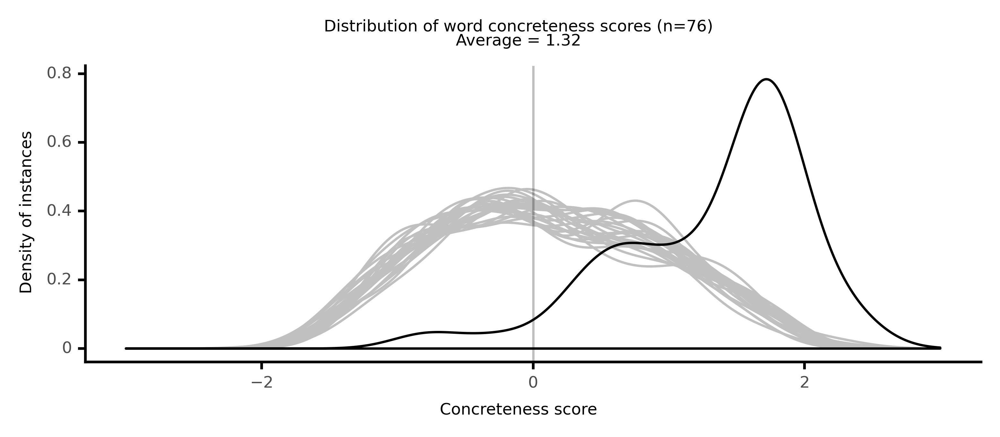

<ggplot: (8786694376017)>

 12%|█▏        | 3/25 [00:50<06:16, 17.10s/it]

#### #4 most concrete passage: Le Guin, _Always Coming Home_ (1985)

<p><conc><conc956>tomatoes</conc956></conc> are not in <neither><conc624>season</conc624></neither>, <neither><conc671>double</conc671></neither> or <neither><conc626>triple</conc626></neither> the <neither><conc456>quantity</conc456></neither> of <conc><conc929>tomato</conc929></conc> past) All this simmers for about an <neither><conc567>hour</conc567></neither>. <neither><conc293>Serve</conc293></neither> with <conc><conc955>chopped</conc955></conc> <neither><conc566>raw</conc566></neither> <conc><conc969>onion</conc969></conc> to <conc><conc983>garnish</conc983></conc>, and a <neither><conc649>sour</conc649></neither> <conc><conc873>sauce</conc873></conc> or chutney made of <conc><conc948>green</conc948></conc> <conc><conc956>tomatoes</conc956></conc> or tomatillos, <conc><conc785>flavored</conc785></conc> with <neither><conc696>fresh</conc696></neither> or <conc><conc784>dry</conc784></conc> <conc><conc954>coriander</conc954></conc> <conc><conc936>leaf</conc936></conc>. This <conc><conc950>dish</conc950></conc>, too <neither><conc571>heavy</conc571></neither> for <conc><conc821>rice</conc821></conc>,'' was <neither><conc416>accompanied</conc416></neither> by cornbreads, either of the hoe-cake or the <conc><conc996>tortilla</conc996></conc> <neither><conc369>type</conc369></neither>. HOTUKO, OLD <conc><conc885>HEN</conc885></conc>,'' A <conc><conc821>RICE</conc821></conc> AND <conc><conc964>CHICKEN</conc964></conc> <conc><conc758>DINNER</conc758></conc> <conc><conc858>Simmer</conc858></conc> a <neither><conc560>big</conc560></neither>, old, <neither><conc455>tough</conc455></neither> <conc><conc964>chicken</conc964></conc> with <conc><conc894>bay</conc894></conc> <conc><conc936>leaf</conc936></conc>, <conc><conc952>rosemary</conc952></conc>, and some <conc><conc760>wine</conc760></conc> until done.( Since most of us can not get <neither><conc560>big</conc560></neither>, old, <neither><conc455>tough</conc455></neither> <conc><conc918>chickens</conc918></conc>, <conc><conc858>simmer</conc858></conc> a little, <neither><conc421>young</conc421></neither>, <neither><conc455>tough</conc455></neither> one.) <neither><conc721>Cool</conc721></neither>, and take the <conc><conc734>meat</conc734></conc> off the <conc><conc759>bones</conc759></conc>. <abs><conc254>Save</conc254></abs> enough of the <neither><conc430>stock</conc430></neither> to <conc><conc828>cook</conc828></conc> the <conc><conc821>rice</conc821></conc> in; <conc><conc828>cook</conc828></conc> the <neither><conc322>rest</conc322></neither> down if it is thin, and then <conc><conc858>simmer</conc858></conc> in it, for five to fifteen <conc><conc766>minutes</conc766></conc>, until just <neither><conc669>barely</conc669></neither> done, some or any of the following: a <neither><conc667>handful</conc667></neither> of <conc><conc926>blanched</conc926></conc> whole <conc><conc967>almonds</conc967></conc> <conc><conc967>sliced</conc967></conc> <conc><conc991>celery</conc991></conc>, <conc><conc951>carrots</conc951></conc>, <conc><conc995>radishes</conc995></conc>, <conc><conc983>yellow</conc983></conc> or <conc><conc948>green</conc948></conc> <conc><conc959>squash</conc959></conc>, <conc><conc949>onions</conc949></conc>, etc. a few <conc><conc812>leaves</conc812></conc> of <conc><conc941>spinach</conc941></conc>, Chinese <conc><conc948>cabbage</conc948></conc>, or other <conc><conc954>greens</conc954></conc> whole <conc><conc924>mushrooms</conc924></conc>, <neither><conc696>fresh</conc696></neither> or <conc><conc939>dried</conc939></conc> <neither><conc477>Add</conc477></neither> the <conc><conc964>chicken</conc964></conc> <conc><conc734>meat</conc734></conc> <neither><conc689>cut</conc689></neither> up, some <conc><conc955>chopped</conc955></conc> <conc><conc980>parsley</conc980></conc>, <conc><conc955>chopped</conc955></conc> <neither><conc696>fresh</conc696></neither> <conc><conc954>coriander</conc954></conc> or <conc><conc784>dry</conc784></conc> <conc><conc954>coriander</conc954></conc> <conc><conc936>leaf</conc936></conc>, and <conc><conc955>chopped</conc955></conc> <conc><conc948>green</conc948></conc> <conc><conc949>onions</conc949></conc>; <neither><conc624>season</conc624></neither> with <conc><conc976>cumin</conc976></conc> <neither><conc685>seed</conc685></neither>, <conc><conc954>coriander</conc954></conc> <neither><conc685>seed</conc685></neither>, a little <neither><conc572>ground</conc572></neither> <neither><conc290>read</conc290></neither> <conc><conc867>pepper</conc867></conc>, and <conc><conc782>salt</conc782></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

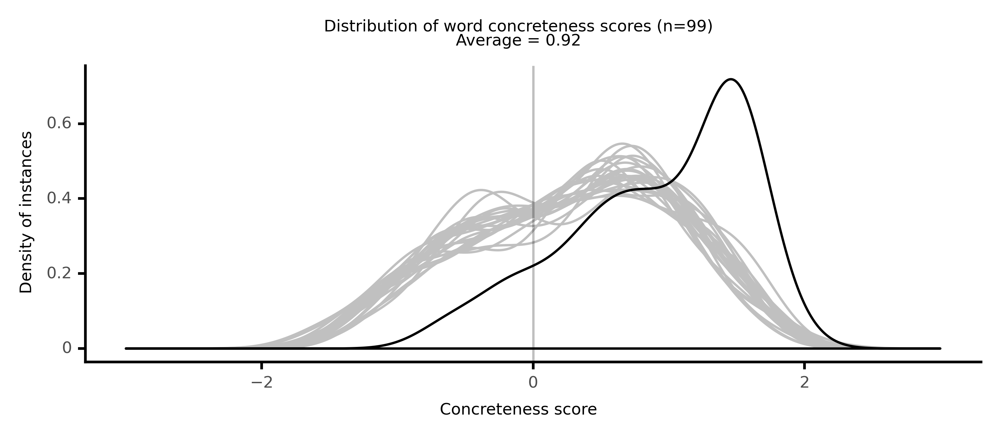

<ggplot: (8786694307525)>

 16%|█▌        | 4/25 [01:05<05:46, 16.49s/it]

#### #5 most concrete passage: Hemingway, _In Our Time_ (1925)

<p>. He <neither><conc677>shook</conc677></neither> the <conc><conc996>skillet</conc996></conc> <conc><conc897>sideways</conc897></conc> and the <conc><conc967>cake</conc967></conc> was <abs><conc224>lose</conc224></abs> on the <neither><conc663>surface</conc663></neither>. I wo n't try and <conc><conc775>flop</conc775></conc> it, he thought. He <conc><conc948>slid</conc948></conc> the <conc><conc852>chip</conc852></conc> of <conc><conc731>clean</conc731></conc> <conc><conc819>wood</conc819></conc> all the way under the <conc><conc967>cake</conc967></conc>, and <conc><conc954>flopped</conc954></conc> it over onto its <neither><conc392>face</conc392></neither>. It <conc><conc797>sputtered</conc797></conc> in the <conc><conc928>pan</conc928></conc>. When it was <conc><conc872>cooked</conc872></conc> <conc><conc761>Nick</conc761></conc> regreased the <conc><conc996>skillet</conc996></conc>. He used all the <conc><conc853>batter</conc853></conc>. It made another <neither><conc560>big</conc560></neither> flapjack and one <neither><conc602>smaller</conc602></neither> one. <conc><conc761>Nick</conc761></conc> <conc><conc739>ate</conc739></conc> a <neither><conc560>big</conc560></neither> flapjack and a <neither><conc602>smaller</conc602></neither> one, <conc><conc814>covered</conc814></conc> with <conc><conc904>apple</conc904></conc> <conc><conc892>butter</conc892></conc>. He put <conc><conc904>apple</conc904></conc> <conc><conc892>butter</conc892></conc> on the third <conc><conc967>cake</conc967></conc>, <conc><conc935>folded</conc935></conc> it over twice, <conc><conc935>wrapped</conc935></conc> it in <conc><conc970>oiled</conc970></conc> <neither><conc700>paper</conc700></neither> and put it in his <conc><conc922>shirt</conc922></conc> <conc><conc807>pocket</conc807></conc>. He put the <conc><conc904>apple</conc904></conc> <conc><conc892>butter</conc892></conc> <conc><conc957>jar</conc957></conc> back in the <conc><conc882>pack</conc882></conc> and <neither><conc689>cut</conc689></neither> <neither><conc326>bred</conc326></neither> for two <conc><conc953>sandwiches</conc953></conc>. In the <conc><conc882>pack</conc882></conc> he found a <neither><conc560>big</conc560></neither> <conc><conc969>onion</conc969></conc>. He <conc><conc967>sliced</conc967></conc> it in two and <conc><conc992>peeled</conc992></conc> the <conc><conc935>silky</conc935></conc> <neither><conc688>outer</conc688></neither> <conc><conc823>skin</conc823></conc>. Then he <neither><conc689>cut</conc689></neither> one half into <conc><conc971>slices</conc971></conc> and made <conc><conc969>onion</conc969></conc> <conc><conc953>sandwiches</conc953></conc>. He <conc><conc935>wrapped</conc935></conc> them in <conc><conc970>oiled</conc970></conc> <neither><conc700>paper</conc700></neither> and <conc><conc914>buttoned</conc914></conc> them in the other <conc><conc807>pocket</conc807></conc> of his <conc><conc834>khaki</conc834></conc> <conc><conc922>shirt</conc922></conc>. He <neither><conc494>turned</conc494></neither> the <conc><conc996>skillet</conc996></conc> <conc><conc843>upside</conc843></conc> down on the <conc><conc993>grill</conc993></conc>, <conc><conc733>drank</conc733></conc> the <conc><conc916>coffee</conc916></conc>, <conc><conc790>sweetened</conc790></conc> and <conc><conc983>yellow</conc983></conc> <conc><conc820>brown</conc820></conc> with the <neither><conc583>condensed</conc583></neither> <conc><conc836>milk</conc836></conc> in it, and <conc><conc937>tidied</conc937></conc> up the <neither><conc580>camp</conc580></neither>. It was a good <neither><conc580>camp</conc580></neither>. <conc><conc761>Nick</conc761></conc> took his <conc><conc756>fly</conc756></conc> <conc><conc881>rod</conc881></conc> out of the <conc><conc944>leather</conc944></conc> rod-case, <conc><conc900>jointed</conc900></conc> it, and <conc><conc858>shoved</conc858></conc> the rod-case back into the <conc><conc910>tent</conc910></conc>. He put on the <conc><conc884>reel</conc884></conc> and <conc><conc956>threaded</conc956></conc> the line through the <neither><conc467>guides</conc467></neither>. He had to <neither><conc294>hold</conc294></neither> it from <neither><conc444>hand</conc444></neither> to <neither><conc444>hand</conc444></neither>, as he <conc><conc956>threaded</conc956></conc> it, or it would <conc><conc851>slip</conc851></conc> back through its own <neither><conc470>weight</conc470></neither>. It was a <neither><conc571>heavy</conc571></neither>, <neither><conc671>double</conc671></neither> <conc><conc923>tapered</conc923></conc> <conc><conc756>fly</conc756></conc> line. <conc><conc761>Nick</conc761></conc> had <neither><conc328>paid</conc328></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

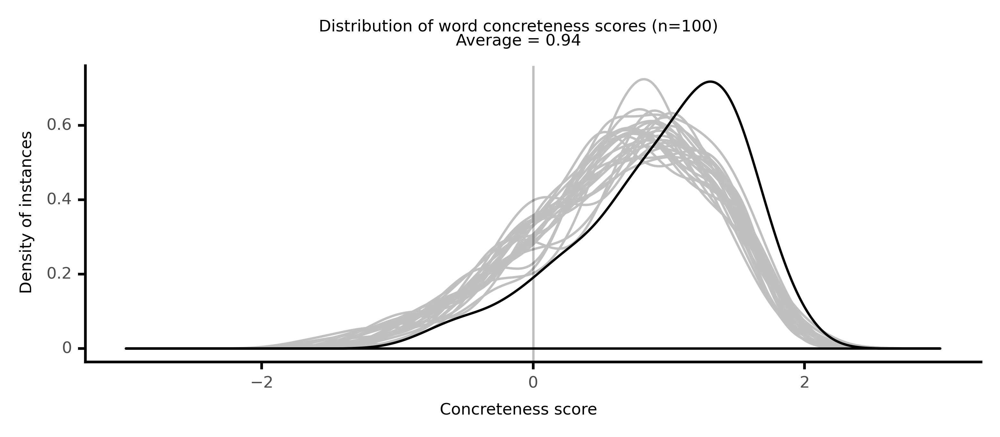

<ggplot: (8786690597769)>

 20%|██        | 5/25 [01:18<05:11, 15.57s/it]

#### #6 most concrete passage: Woolf, _The Waves_ (1931)

<p>among the <conc><conc985>pots</conc985></conc> of <conc><conc921>jam</conc921></conc>, the <conc><conc933>loaves</conc933></conc> and the <conc><conc892>butter</conc892></conc>. We are <neither><conc448>silent</conc448></neither>. I go then to the <conc><conc993>cupboard</conc993></conc>, and take the <conc><conc924>damp</conc924></conc> <conc><conc989>bags</conc989></conc> of <neither><conc453>rich</conc453></neither> sultanas; I <neither><conc675>lift</conc675></neither> the <neither><conc571>heavy</conc571></neither> <conc><conc863>flour</conc863></conc> on to the <conc><conc731>clean</conc731></conc> <conc><conc965>scrubbed</conc965></conc> <conc><conc986>kitchen</conc986></conc> <conc><conc832>table</conc832></conc>. I <conc><conc941>knead</conc941></conc>; I <conc><conc762>stretch</conc762></conc>; I <conc><conc749>pull</conc749></conc>, <neither><conc657>plunging</conc657></neither> my <neither><conc498>hands</conc498></neither> in the <conc><conc775>warm</conc775></conc> inward of the <conc><conc900>dough</conc900></conc>. I let the <neither><conc577>cold</conc577></neither> <conc><conc773>water</conc773></conc> <conc><conc735>stream</conc735></conc> fanwise through my <conc><conc873>fingers</conc873></conc>. The fire <neither><conc727>roars</conc727></neither>; the <conc><conc906>flies</conc906></conc> <conc><conc727>buzz</conc727></conc> in a <neither><conc697>circle</conc697></neither>. All my <conc><conc934>currants</conc934></conc> and rices, the <conc><conc856>silver</conc856></conc> <conc><conc989>bags</conc989></conc> and the <conc><conc922>blue</conc922></conc> <conc><conc989>bags</conc989></conc>, are <neither><conc706>locked</conc706></neither> again in the <conc><conc993>cupboard</conc993></conc>. The <conc><conc734>meat</conc734></conc> is <neither><conc673>stood</conc673></neither> in the <conc><conc962>oven</conc962></conc>; the <neither><conc326>bred</conc326></neither> <neither><conc683>rises</conc683></neither> in a <conc><conc860>soft</conc860></conc> <conc><conc751>dome</conc751></conc> under the <conc><conc731>clean</conc731></conc> <conc><conc996>towel</conc996></conc>. I <conc><conc764>walk</conc764></conc> in the afternoon down to the <conc><conc767>river</conc767></conc>. All the world is <neither><conc424>breeding</conc424></neither>. The <conc><conc906>flies</conc906></conc> are going from <conc><conc937>grass</conc937></conc> to <conc><conc937>grass</conc937></conc>. The <conc><conc944>flowers</conc944></conc> are <conc><conc911>thick</conc911></conc> with <conc><conc868>pollen</conc868></conc>. The <conc><conc931>swans</conc931></conc> <neither><conc720>ride</conc720></neither> the <conc><conc735>stream</conc735></conc> in <abs><conc113>order</conc113></abs>. The <conc><conc740>clouds</conc740></conc>, <conc><conc775>warm</conc775></conc> now, sun-spotted, <neither><conc613>sweep</conc613></neither> over the <conc><conc795>hills</conc795></conc>, <neither><conc578>leaving</conc578></neither> <neither><conc636>gold</conc636></neither> in the <conc><conc773>water</conc773></conc>, and The <neither><conc725>Waves</conc725></neither> <neither><conc636>gold</conc636></neither> on the <conc><conc824>necks</conc824></conc> of the <conc><conc931>swans</conc931></conc>. <neither><conc701>Pushing</conc701></neither> one <conc><conc887>foot</conc887></conc> before the other, the <conc><conc805>cows</conc805></conc> <conc><conc940>munch</conc940></conc> their way across the <neither><conc336>field</conc336></neither>. I feel through the <conc><conc937>grass</conc937></conc> for the white-domed <conc><conc848>mushroom</conc848></conc>; and <neither><conc387>break</conc387></neither> its <conc><conc936>stalk</conc936></conc> and <conc><conc772>pick</conc772></conc> the <conc><conc956>purple</conc956></conc> <conc><conc977>orchid</conc977></conc> that <neither><conc511>grows</conc511></neither> beside it and lay the <conc><conc977>orchid</conc977></conc> by the <conc><conc848>mushroom</conc848></conc> with the <neither><conc476>earth</conc476></neither> at its <neither><conc423>root</conc423></neither>, and so home to make the <conc><conc941>kettle</conc941></conc> <conc><conc790>boil</conc790></conc> for my father among the just <neither><conc717>reddened</conc717></neither> <conc><conc977>roses</conc977></conc> on the <conc><conc939>tea-table</conc939></conc>. But evening comes and the <conc><conc859>lamps</conc859></conc> are <conc><conc830>lit</conc830></conc>. And when evening comes and the <conc><conc859>lamps</conc859></conc> are <conc><conc830>lit</conc830></conc> they make a <conc><conc983>yellow</conc983></conc> fire in the <conc><conc831>ivy</conc831></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

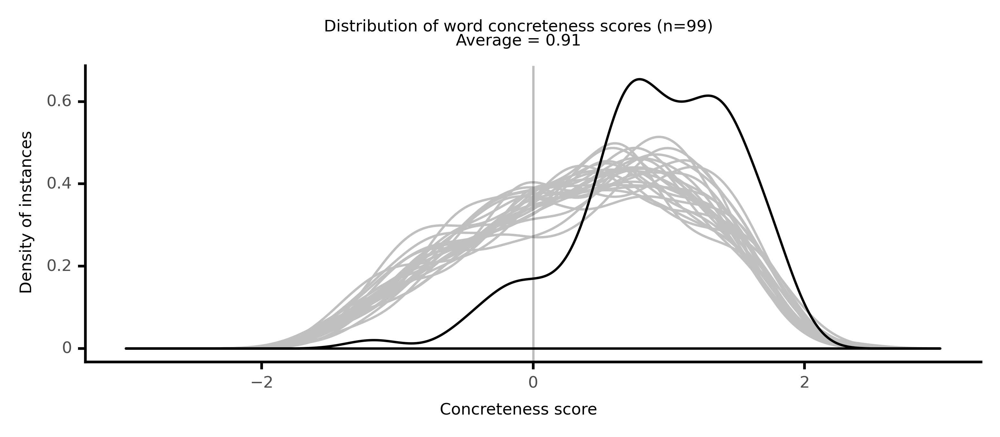

<ggplot: (8786696886301)>

 24%|██▍       | 6/25 [01:31<04:40, 14.76s/it]

#### #7 most concrete passage: Hemingway, _A Farewell to Arms_ (1929)

<p>and at <neither><conc615>night</conc615></neither> there was <conc><conc752>frost</conc752></conc> so that there was thin <conc><conc943>ice</conc943></conc> over the <conc><conc773>water</conc773></conc> in the two <conc><conc798>pitchers</conc798></conc> on the <conc><conc985>dresser</conc985></conc> in the morning. Mrs. Guttingen came into the room <neither><conc298>early</conc298></neither> in the morning to <neither><conc716>shut</conc716></neither> the <conc><conc908>windows</conc908></conc> and <neither><conc607>started</conc607></neither> a fire in the <conc><conc861>tall</conc861></conc> <conc><conc952>porcelain</conc952></conc> <conc><conc981>stove</conc981></conc>. The <conc><conc967>pine</conc967></conc> <conc><conc819>wood</conc819></conc> <conc><conc910>crackled</conc910></conc> and <neither><conc449>spark</conc449></neither> and then the fire <neither><conc670>roared</conc670></neither> in the <conc><conc981>stove</conc981></conc> and the second time Mrs. Guttingen came into the room she brought <neither><conc560>big</conc560></neither> <conc><conc930>chunks</conc930></conc> of <conc><conc819>wood</conc819></conc> for the fire and a <conc><conc839>pitcher</conc839></conc> of <neither><conc683>hight</conc683></neither> <conc><conc773>water</conc773></conc>. When the room was <conc><conc775>warm</conc775></conc> she brought in <conc><conc861>breakfast</conc861></conc>. <conc><conc857>Sitting</conc857></conc> up in <conc><conc948>bed</conc948></conc> <conc><conc751>eating</conc751></conc> <conc><conc861>breakfast</conc861></conc> we could see the <conc><conc830>lake</conc830></conc> and the <neither><conc700>mountains</conc700></neither> across the <conc><conc830>lake</conc830></conc> on the French side. There was <conc><conc867>snow</conc867></conc> on the <conc><conc972>tops</conc972></conc> of the <neither><conc700>mountains</conc700></neither> and the <conc><conc830>lake</conc830></conc> was a <conc><conc851>grey</conc851></conc> <conc><conc877>steel-blue</conc877></conc>. Outside, in front of the <conc><conc932>chalet</conc932></conc> a <neither><conc648>road</conc648></neither> went up the <conc><conc733>mountain</conc733></conc>. The <conc><conc882>wheel</conc882></conc> <conc><conc897>ruts</conc897></conc> and <conc><conc824>ridges</conc824></conc> were <neither><conc714>iron</conc714></neither> <neither><conc358>hard</conc358></neither> with the <conc><conc752>frost</conc752></conc>, and the <neither><conc648>road</conc648></neither> <conc><conc879>climbed</conc879></conc> <neither><conc417>steadily</conc417></neither> through the <neither><conc653>forest</conc653></neither> and up and around the <conc><conc733>mountain</conc733></conc> to where there were <conc><conc891>meadows</conc891></conc>, and <conc><conc877>barns</conc877></conc> and <conc><conc896>cabins</conc896></conc> in the <conc><conc891>meadows</conc891></conc> at the <conc><conc858>edge</conc858></conc> of the <conc><conc819>woods</conc819></conc> looking across the <neither><conc685>valley</conc685></neither>. The <neither><conc685>valley</conc685></neither> was <neither><conc454>deep</conc454></neither> and there was a <conc><conc735>stream</conc735></conc> at the bottom that <neither><conc664>flowed</conc664></neither> down into the <conc><conc830>lake</conc830></conc> and when the <conc><conc759>wind</conc759></conc> <conc><conc868>blew</conc868></conc> across the <neither><conc685>valley</conc685></neither> you could hear the <conc><conc735>stream</conc735></conc> in the <conc><conc832>rocks</conc832></conc>. Sometimes we went off the <neither><conc648>road</conc648></neither> and on a <neither><conc586>path</conc586></neither> through the <conc><conc967>pine</conc967></conc> <neither><conc653>forest</conc653></neither>. The <conc><conc858>floor</conc858></conc> of the <neither><conc653>forest</conc653></neither> was <conc><conc860>soft</conc860></conc> to <conc><conc764>walk</conc764></conc> on; the <conc><conc752>frost</conc752></conc> did not <neither><conc563>harden</conc563></neither> it as it did the <neither><conc648>road</conc648></neither>. But we did not mind the <neither><conc332>hardness</conc332></neither> of the <neither><conc648>road</conc648></neither> because we had <conc><conc965>nails</conc965></conc> in the <conc><conc918>soles</conc918></conc> and <conc><conc869>heels</conc869></conc> of our <conc><conc905>boots</conc905></conc> and the <conc><conc835>heel</conc835></conc> <conc><conc965>nails</conc965></conc> <neither><conc569>bit</conc569></neither> on the <conc><conc831>frozen</conc831></conc> <conc><conc897>ruts</conc897></conc> and with <conc><conc875>nailed</conc875></conc> <conc><conc905>boots</conc905></conc> it was good <conc><conc827>walking</conc827></conc> on the <neither><conc648>road</conc648></neither> and <neither><conc373>invigorating</conc373></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

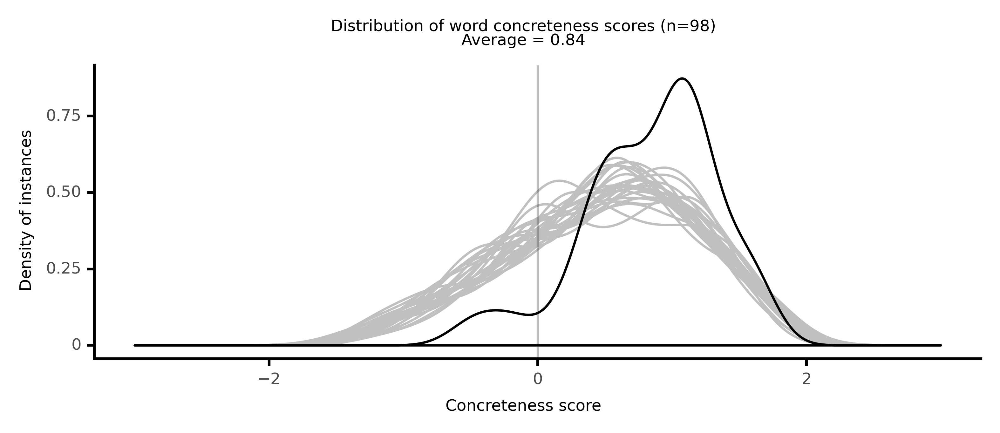

<ggplot: (8786696888685)>

 28%|██▊       | 7/25 [01:45<04:21, 14.55s/it]

#### #8 most concrete passage: Steinbeck, _Of Mice and Men_ (1937)

<p>OF <conc><conc789>MICE</conc789></conc> AND MEN John Steinbeck A FEW <neither><conc706>MILES</conc706></neither> <neither><conc500>south</conc500></neither> of Soledad, the <neither><conc454>Salinas</conc454></neither> <conc><conc767>River</conc767></conc> <conc><conc915>drops</conc915></conc> in <neither><conc371>close</conc371></neither> to the <conc><conc922>hillside</conc922></conc> <neither><conc435>bank</conc435></neither> and <neither><conc695>runs</conc695></neither> <neither><conc454>deep</conc454></neither> and <conc><conc948>green</conc948></conc>. The <conc><conc773>water</conc773></conc> is <conc><conc775>warm</conc775></conc> too, for it has <conc><conc875>slipped</conc875></conc> <conc><conc795>twinkling</conc795></conc> over the <conc><conc983>yellow</conc983></conc> <conc><conc850>sands</conc850></conc> in the <conc><conc865>sunlight</conc865></conc> before <neither><conc622>reaching</conc622></neither> the <neither><conc611>narrow</conc611></neither> <conc><conc887>pool</conc887></conc>. On one side of the <conc><conc767>river</conc767></conc> the <conc><conc841>golden</conc841></conc> <conc><conc819>foothill</conc819></conc> <conc><conc788>slopes</conc788></conc> <conc><conc770>curve</conc770></conc> up to the <abs><conc176>strong</conc176></abs> and <conc><conc763>rocky</conc763></conc> Gabilan <neither><conc700>mountains</conc700></neither>, but on the <neither><conc685>valley</conc685></neither> side the <conc><conc773>water</conc773></conc> is <conc><conc888>lined</conc888></conc> with <conc><conc866>trees</conc866></conc>-- <conc><conc946>willows</conc946></conc> <neither><conc696>fresh</conc696></neither> and <conc><conc948>green</conc948></conc> with every <neither><conc628>spring</conc628></neither>, <neither><conc660>carrying</conc660></neither> in their <neither><conc526>lower</conc526></neither> <conc><conc936>leaf</conc936></conc> junctures the <conc><conc846>debris</conc846></conc> of the <neither><conc663>winter</conc663></neither>'s <neither><conc644>flooding</conc644></neither>; and <conc><conc962>sycamores</conc962></conc> with <conc><conc914>mottled</conc914></conc>, <conc><conc732>white</conc732></conc>, <conc><conc866>recumbent</conc866></conc> <neither><conc724>limbs</conc724></neither> and <neither><conc701>branches</conc701></neither> that <conc><conc795>arch</conc795></conc> over the <conc><conc887>pool</conc887></conc>. On the <conc><conc922>sandy</conc922></conc> <neither><conc435>bank</conc435></neither> under the <conc><conc866>trees</conc866></conc> the <conc><conc812>leaves</conc812></conc> <neither><conc280>lie</conc280></neither> <neither><conc454>deep</conc454></neither> and so <conc><conc860>crisp</conc860></conc> that a <conc><conc962>lizard</conc962></conc> makes a great <conc><conc971>skittering</conc971></conc> if he <neither><conc695>runs</conc695></neither> among them. <conc><conc864>Rabbits</conc864></conc> come out of the <conc><conc933>brush</conc933></conc> to <neither><conc697>sit</conc697></neither> on the <conc><conc918>sand</conc918></conc> in the evening, and the <conc><conc924>damp</conc924></conc> <conc><conc943>flats</conc943></conc> are <conc><conc814>covered</conc814></conc> with the <neither><conc615>night</conc615></neither> <conc><conc829>tracks</conc829></conc> of'coons, and with the <neither><conc546>spread</conc546></neither> <conc><conc986>pads</conc986></conc> of <conc><conc760>dogs</conc760></conc> from the <neither><conc697>ranches</conc697></neither>, and with the split-wedge <conc><conc829>tracks</conc829></conc> of <conc><conc821>deer</conc821></conc> that come to <neither><conc673>drink</conc673></neither> in the <conc><conc801>dark</conc801></conc>. There is a <neither><conc586>path</conc586></neither> through the <conc><conc946>willows</conc946></conc> and among the <conc><conc962>sycamores</conc962></conc>, a <neither><conc586>path</conc586></neither> <neither><conc579>beaten</conc579></neither> <neither><conc358>hard</conc358></neither> by <neither><conc658>boys</conc658></neither> <neither><conc385>coming</conc385></neither> down from the <neither><conc697>ranches</conc697></neither> to <conc><conc808>swim</conc808></conc> in the <neither><conc454>deep</conc454></neither> <conc><conc887>pool</conc887></conc>, and <neither><conc579>beaten</conc579></neither> <neither><conc358>hard</conc358></neither> by <conc><conc743>tramps</conc743></conc> who come <conc><conc764>wearily</conc764></conc> down from the <neither><conc702>highway</conc702></neither> in the evening to jungle-up near <conc><conc773>water</conc773></conc>. In front of the <neither><conc488>low</conc488></neither> <neither><conc727>horizontal</conc727></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

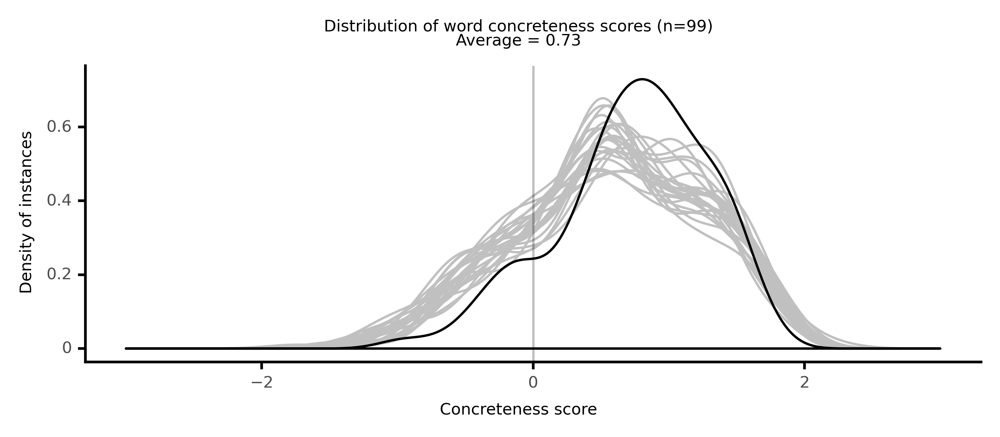

<ggplot: (8786692654957)>

 32%|███▏      | 8/25 [01:57<03:53, 13.73s/it]

#### #9 most concrete passage: Katz, _Creamy and Delicious_ (1970)

<p>to make <conc><conc954>Blossoms</conc954></conc>'' a <neither><conc366>title</conc366></neither> for his <neither><conc364>story</conc364></neither>. <conc><conc789>Tap</conc789></conc>. Where do <conc><conc954>blossoms</conc954></conc> ever <neither><conc389>enter</conc389></neither>? If so, are they <conc><conc954>blossoms</conc954></conc>? <conc><conc789>Tap</conc789></conc> <conc><conc789>Tap</conc789></conc> <conc><conc789>Tap</conc789></conc> <conc><conc789>Tap</conc789></conc> <conc><conc789>Tap</conc789></conc>. Here's a likely place, and if I'm <abs><conc208>wrong</conc208></abs> may you <neither><conc696>eat</conc696></neither> my words. <conc><conc789>Tap</conc789></conc> <conc><conc789>Tap</conc789></conc>. I will fill these pages with <conc><conc954>blossoms</conc954></conc>, and even before I begin I needs to put this <abs><conc147>confession</conc147></abs> up to you, that I'm not actually a <abs><conc060>human</conc060></abs> <neither><conc369>type</conc369></neither>. <conc><conc789>Tap</conc789></conc> <conc><conc789>Tap</conc789></conc>. You probably did n't <abs><conc175>suspect</conc175></abs> it, but I'm a <neither><conc685>pet</conc685></neither> <conc><conc834>dog</conc834></conc>. Camomile <conc><conc954>blossoms</conc954></conc>, <conc><conc999>petunia</conc999></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc996>lavender</conc996></conc> <conc><conc954>blossoms</conc954></conc>, <neither><conc726>rose</conc726></neither> <conc><conc954>blossoms</conc954></conc>, <conc><conc987>tulip</conc987></conc> <conc><conc954>blossoms</conc954></conc>, adder's-tongue <conc><conc954>blossoms</conc954></conc>, <conc><conc916>hyacinth</conc916></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc905>jonquil</conc905></conc> <conc><conc954>blossoms</conc954></conc>, sweetbriar <conc><conc954>blossoms</conc954></conc>, bloodroot <conc><conc954>blossoms</conc954></conc>, <conc><conc995>lilac</conc995></conc> <conc><conc954>blossoms</conc954></conc>, Dutchman's-breeches <conc><conc954>blossoms</conc954></conc>, <conc><conc965>lemon</conc965></conc> <conc><conc954>blossoms</conc954></conc>, jack-in-the-pulpit <conc><conc954>blossoms</conc954></conc>, forsythia <conc><conc954>blossoms</conc954></conc>, cornflower <conc><conc954>blossoms</conc954></conc>, <conc><conc970>azalea</conc970></conc> <conc><conc954>blossoms</conc954></conc>, no <conc><conc837>fig</conc837></conc> <conc><conc954>blossoms</conc954></conc>, prickly-pear <conc><conc954>blossoms</conc954></conc>, <conc><conc986>daffodil</conc986></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc992>dogwood</conc992></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc959>squash</conc959></conc> <conc><conc954>blossoms</conc954></conc>, sweat-pea <conc><conc954>blossoms</conc954></conc>, <conc><conc979>Eucalyptus</conc979></conc> <conc><conc954>blossoms</conc954></conc>, something seriously <neither><conc659>ai</conc659></neither> n't <neither><conc385>coming</conc385></neither> across here, lady's-slipper <conc><conc954>blossoms</conc954></conc>, morning-glory <conc><conc954>blossoms</conc954></conc>, trillium <conc><conc954>blossoms</conc954></conc>, bachelor's-button <conc><conc954>blossoms</conc954></conc>, ragweed <conc><conc954>blossoms</conc954></conc>, <conc><conc935>heather</conc935></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc991>carnation</conc991></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc877>iris</conc877></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc937>chaparral</conc937></conc> <conc><conc954>blossoms</conc954></conc> or snowbrush <conc><conc954>blossoms</conc954></conc>, <conc><conc964>yucca</conc964></conc> <conc><conc954>blossoms</conc954></conc>, rock-lily <conc><conc954>blossoms</conc954></conc>, Joshua <conc><conc954>blossoms</conc954></conc>, <conc><conc974>fennel</conc974></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc969>wisteria</conc969></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc979>Eucalyptus</conc979></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc972>bougainvillea</conc972></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc851>poppy</conc851></conc> <conc><conc954>blossoms</conc954></conc>, <conc><conc909>mint</conc909></conc> <conc><conc954>blossoms</conc954></conc>, choho <conc><conc954>blossoms</conc954></conc>, perny <conc><conc954>blossoms</conc954></conc>, sharja <conc><conc954>blossoms</conc954></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

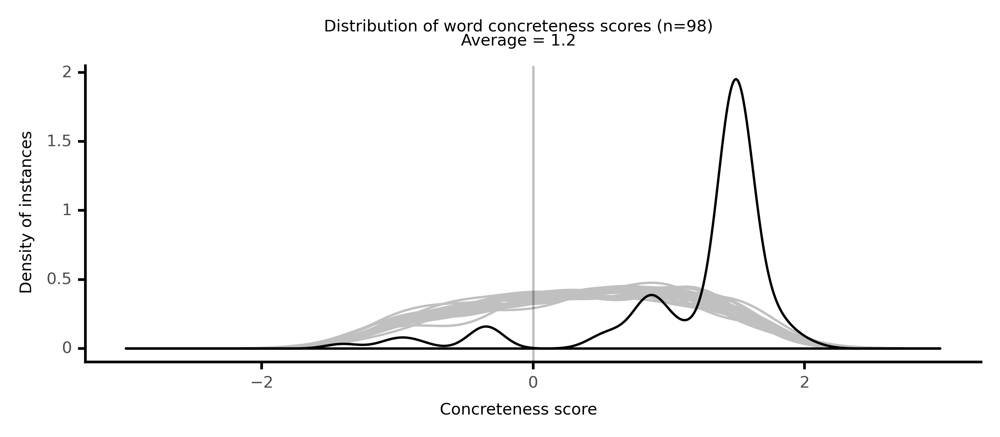

<ggplot: (8786693137513)>

 36%|███▌      | 9/25 [02:07<03:20, 12.54s/it]

#### #10 most concrete passage: Gass, _In the Heart of the Country_ (1968)

<p>and the <neither><conc488>low</conc488></neither> <neither><conc572>ground</conc572></neither> was <conc><conc862>cracked</conc862></conc>, and I <conc><conc758>flushed</conc758></conc> <conc><conc886>grasshoppers</conc886></conc> from the <conc><conc978>goldenrod</conc978></conc> in <conc><conc924>whirring</conc924></conc> <conc><conc740>clouds</conc740></conc> Like <conc><conc903>quail</conc903></conc> and <conc><conc740>shot</conc740></conc> them down. I <conc><conc886>smelled</conc886></conc> <neither><conc657>wheat</conc657></neither> in the <conc><conc775>warm</conc775></conc> <conc><conc759>wind</conc759></conc> and every <conc><conc742>weed</conc742></conc>. I <neither><conc613>tasted</conc613></neither> <conc><conc805>dust</conc805></conc> in my <conc><conc832>mouth</conc832></conc>, and the <neither><conc567>house</conc567></neither> and <conc><conc946>barn</conc946></conc> and all the <conc><conc996>pails</conc996></conc> <conc><conc750>burned</conc750></conc> my <neither><conc577>eyes</conc577></neither> to look at. I <neither><conc648>road</conc648></neither> the <conc><conc997>broom</conc997></conc> over the <conc><conc820>brown</conc820></conc> <conc><conc832>rocks</conc832></conc>. I <neither><conc643>hunted</conc643></neither> <neither><conc676>Horse</conc676></neither> Simon in the <conc><conc889>shade</conc889></conc> of a <conc><conc880>tree</conc880></conc>. I <neither><conc648>road</conc648></neither> the <conc><conc997>broom</conc997></conc> over the <conc><conc820>brown</conc820></conc> <conc><conc923>meadow</conc923></conc> <conc><conc937>grass</conc937></conc> and with a <conc><conc738>fist</conc738></conc> Like <conc><conc809>pistol</conc809></conc> <conc><conc823>butt</conc823></conc> and <neither><conc622>trigger</conc622></neither> <conc><conc740>shot</conc740></conc> the Indian on <neither><conc676>Horse</conc676></neither> Simon down. I <neither><conc648>road</conc648></neither> across the <conc><conc784>dry</conc784></conc> <neither><conc497>plain</conc497></neither>. I <neither><conc648>road</conc648></neither> into the <conc><conc784>dry</conc784></conc> <conc><conc911>creek</conc911></conc>. <conc><conc805>Dust</conc805></conc> <neither><conc726>rose</conc726></neither> up behind me. I went <neither><conc516>fast</conc516></neither> and <neither><conc621>shouted</conc621></neither>. The <conc><conc870>tractor</conc870></conc> was <conc><conc763>bright</conc763></conc> <conc><conc987>orange</conc987></conc>. It <conc><conc912>shimmered</conc912></conc>. <conc><conc805>Dust</conc805></conc> <conc><conc931>rolled</conc931></conc> behind it. I hid in the <conc><conc911>creek</conc911></conc> and followed as it came. I <neither><conc720>waited</conc720></neither> as its <neither><conc586>path</conc586></neither> <conc><conc897>curved</conc897></conc> towards me. I <conc><conc730>watched</conc730></conc> and <neither><conc720>waited</conc720></neither>. My <neither><conc577>eyes</conc577></neither> were <conc><conc963>tiny</conc963></conc>. I <neither><conc668>sprang</conc668></neither> out with a whoop and <neither><conc648>road</conc648></neither> across the <conc><conc784>dry</conc784></conc> <neither><conc497>plain</conc497></neither>. My <neither><conc676>horse</conc676></neither> had a <conc><conc841>golden</conc841></conc> <conc><conc880>tail</conc880></conc>. <conc><conc805>Dust</conc805></conc> <conc><conc931>rolled</conc931></conc> up behind me. <neither><conc704>Pa</conc704></neither> was on the <conc><conc870>tractor</conc870></conc> in a <conc><conc936>broad-brimmed</conc936></conc> <conc><conc828>hat</conc828></conc>. With a <conc><conc738>fist</conc738></conc> Like a <conc><conc809>pistol</conc809></conc> <conc><conc823>butt</conc823></conc> and <neither><conc622>trigger</conc622></neither>, going <neither><conc516>fast</conc516></neither>, I <conc><conc740>shot</conc740></conc> him down. <neither><conc704>Pa</conc704></neither> would stop the <conc><conc870>tractor</conc870></conc> and get off and <conc><conc742>weed</conc742></conc> <conc><conc764>walk</conc764></conc> across the <conc><conc911>creek</conc911></conc> to the little <conc><conc880>tree</conc880></conc> Simon <neither><conc673>stood</conc673></neither> his <neither><conc619>bowed</conc619></neither> <neither><conc651>head</conc651></neither> under. We'd <neither><conc697>sit</conc697></neither> by the <conc><conc880>tree</conc880></conc> and <neither><conc704>pa</conc704></neither> would <conc><conc749>pull</conc749></conc> a <conc><conc773>water</conc773></conc> <conc><conc955>bottle</conc955></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

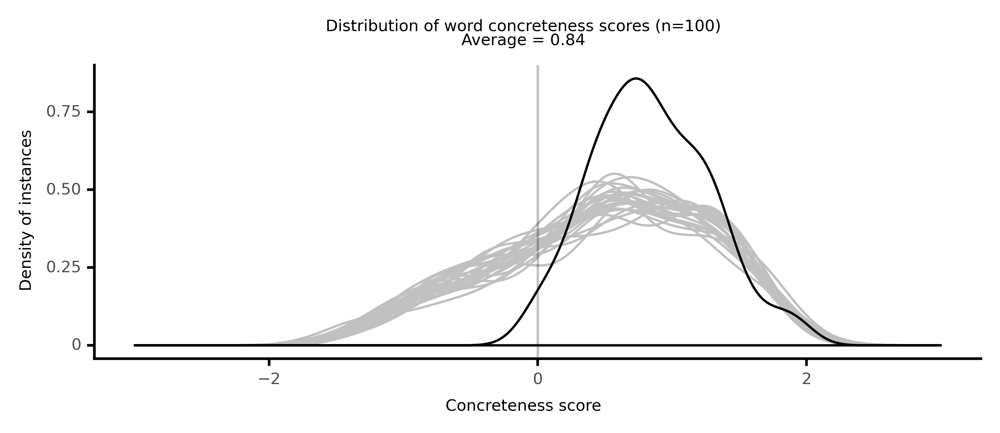

<ggplot: (8786692205833)>

 40%|████      | 10/25 [02:18<03:02, 12.16s/it]

#### #11 most concrete passage: Le Guin, _Always Coming Home_ (1985)

<p>, <neither><conc477>add</conc477></neither> <conc><conc872>cooked</conc872></conc> <conc><conc811>barley</conc811></conc> while <conc><conc739>heating</conc739></conc> <conc><conc895>gently</conc895></conc>, and use <conc><conc980>parsley</conc980></conc> or chervil instead of <conc><conc909>mint</conc909></conc>.) <neither><conc405>DUR</conc405></neither> M DREVl, <conc><conc858>RED</conc858></conc> AND <conc><conc948>GREEN</conc948></conc>,'' A <conc><conc797>VEGETABLE</conc797></conc> <conc><conc758>DINNER</conc758></conc> <conc><conc923>Peel</conc923></conc> one <neither><conc545>large</conc545></neither> or several <neither><conc649>small</conc649></neither> eggplants and <conc><conc887>slice</conc887></conc> about as <conc><conc911>thick</conc911></conc> as my <conc><conc855>finger</conc855></conc> is.'' <conc><conc967>Sprinkle</conc967></conc> the <conc><conc971>slices</conc971></conc> with <conc><conc965>lemon</conc965></conc> <conc><conc915>juice</conc915></conc> and <conc><conc756>coarse</conc756></conc> <conc><conc782>salt</conc782></conc>, and let them <neither><conc697>sit</conc697></neither> while you <neither><conc417>prepare</conc417></neither> the <neither><conc322>rest</conc322></neither> for <conc><conc855>cooking</conc855></conc>: <conc><conc887>slice</conc887></conc> a <conc><conc755>couple</conc755></conc> of <conc><conc979>fair-sized</conc979></conc> <conc><conc977>zucchini</conc977></conc> <conc><conc959>squash</conc959></conc>( unpeeled) the same way, and also <conc><conc967>sprinkle</conc967></conc> with <conc><conc965>lemon</conc965></conc> <conc><conc915>juice</conc915></conc> a <neither><conc667>handful</conc667></neither> of <conc><conc980>parsley</conc980></conc>, the <neither><conc663>stems</conc663></neither> <neither><conc689>cut</conc689></neither> off a <conc><conc755>couple</conc755></conc> of <conc><conc942>garlic</conc942></conc> <conc><conc973>cloves</conc973></conc>, <conc><conc955>chopped</conc955></conc> <neither><conc542>fine</conc542></neither> a <neither><conc671>double</conc671></neither> <neither><conc667>handful</conc667></neither> of <conc><conc924>mushrooms</conc924></conc>-- any <neither><conc620>delicate</conc620></neither> <abs><conc149>kind</conc149></abs>-- <neither><conc696>fresh</conc696></neither> Make a <conc><conc873>sauce</conc873></conc> of two <conc><conc973>cloves</conc973></conc> of <conc><conc942>garlic</conc942></conc> thoroughly <conc><conc982>mashed</conc982></conc> in a <conc><conc841>mortar</conc841></conc> or <neither><conc324>press</conc324></neither>, about two <conc><conc965>tablespoons</conc965></conc> of good <conc><conc931>olive</conc931></conc> <neither><conc586>oil</conc586></neither>, and a <conc><conc754>dash</conc754></conc> of <neither><conc572>ground</conc572></neither> <neither><conc290>read</conc290></neither> <conc><conc867>pepper</conc867></conc>, all <neither><conc458>stirred</conc458></neither> into two <conc><conc975>cups</conc975></conc> of <conc><conc948>yogurt</conc948></conc> until <conc><conc831>smooth</conc831></conc> and <conc><conc988>creamy</conc988></conc>. <conc><conc823>Fry</conc823></conc> the <conc><conc977>zucchini</conc977></conc> <neither><conc516>fast</conc516></neither> and <neither><conc683>hight</conc683></neither> in <neither><conc527>light</conc527></neither> <neither><conc586>oil</conc586></neither> in an <neither><conc714>iron</conc714></neither> <conc><conc928>pan</conc928></conc> until the <conc><conc916>edges</conc916></conc> <conc><conc820>brown</conc820></conc>; <conc><conc927>pile</conc927></conc> it on one end of a <conc><conc973>platter</conc973></conc>. Using less <neither><conc586>oil</conc586></neither>, <conc><conc823>fry</conc823></conc> the <conc><conc981>eggplant</conc981></conc> very <neither><conc516>fast</conc516></neither> and <neither><conc683>hight</conc683></neither> till it <neither><conc620>turns</conc620></neither> <neither><conc429>vivid</conc429></neither> <conc><conc907>red-brown</conc907></conc>. <conc><conc927>Pile</conc927></conc> it on the other end of the <conc><conc973>platter</conc973></conc>. Stir-fry the <conc><conc924>mushrooms</conc924></conc>, <conc><conc942>garlic</conc942></conc>, and <conc><conc980>parsley</conc980></conc> <conc><conc895>gently</conc895></conc> and quickly just till the <conc><conc980>parsley</conc980></conc> wilts, and <conc><conc927>pile</conc927></conc> it in the <neither><conc660>centre</conc660></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

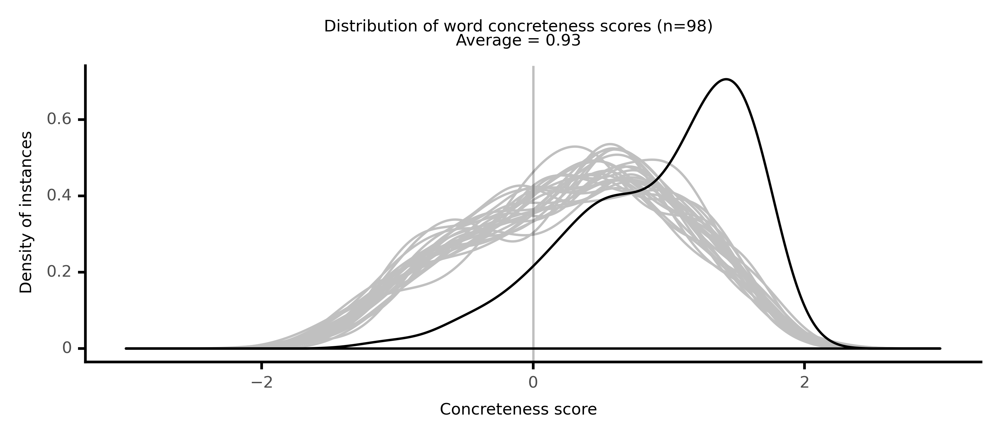

<ggplot: (8786691377097)>

 44%|████▍     | 11/25 [02:32<02:57, 12.70s/it]

#### #12 most concrete passage: Delany, _Hogg_ (1995)

<p>? <conc><conc739>Motherfucker</conc739></conc>!'' I thought he was going to do something or say something else. But he just <neither><conc677>shook</conc677></neither> his <neither><conc651>head</conc651></neither>, <conc><conc831>scratched</conc831></conc>, and <conc><conc736>wandered</conc736></conc> away. On the first really <neither><conc683>hight</conc683></neither> day-- it had <neither><conc350>reigned</conc350></neither> that morning-- Pedro brought some <neither><conc628>niggers</conc628></neither> over who usually <conc><conc910>hung</conc910></conc> out around Crawhole. They came in, <neither><conc560>big</conc560></neither>, <neither><conc607>loud</conc607></neither>, and <conc><conc978>barefoot</conc978></conc>. And they had some <conc><conc760>wine</conc760></conc>. You only got one <conc><conc952>pussy</conc952></conc> down here, boy?'' But do n't it look Like a <conc><conc791>sweet</conc791></conc> one!'' Here's my <neither><conc574>quarter</conc574></neither>. <neither><conc665>Lem</conc665></neither> me <conc><conc829>rip</conc829></conc> into a <conc><conc728>piece</conc728></conc> of that!'' Look out, little girl! Look out, look out!'' Maria was <conc><conc928>giggling</conc928></conc>. This old <conc><conc960>blacksnake</conc960></conc> of mine got a <conc><conc770>bite</conc770></conc>, <conc><conc935>honey</conc935></conc>!'' Finally, one <neither><conc669>pushed</conc669></neither> himself away from the <neither><conc697>circle</conc697></neither> of <conc><conc787>backs</conc787></conc>. His <conc><conc939>sleeves</conc939></conc> were <conc><conc931>rolled</conc931></conc> up <conc><conc820>tied</conc820></conc>. He was bullet-headed, his <neither><conc481>arms</conc481></neither> <conc><conc928>glistened</conc928></conc> in the <neither><conc628>heat</conc628></neither>, and he was so <neither><conc692>black</conc692></neither> there was n't no <conc><conc820>brown</conc820></conc> on him, He <conc><conc817>picked</conc817></conc> up one of the <conc><conc834>gallon</conc834></conc> winejugs off the bottom <neither><conc304>step</conc304></neither>, <conc><conc935>wrapped</conc935></conc> his <neither><conc560>big</conc560></neither> <conc><conc832>mouth</conc832></conc> over the <conc><conc917>neck</conc917></conc>, <conc><conc834>swung</conc834></conc> it <neither><conc388>high</conc388></neither>, and <conc><conc755>sucked</conc755></conc>, while the plum-colored <neither><conc662>stuff</conc662></neither> <conc><conc840>bubbled</conc840></conc> in the <conc><conc919>greenish</conc919></conc> <conc><conc900>glass</conc900></conc>. He let the <conc><conc982>jug</conc982></conc> <neither><conc632>drop</conc632></neither>, and while it was <conc><conc892>swinging</conc892></conc> from his <conc><conc830>thumb</conc830></conc>, he saw me. He <neither><conc639>grinned</conc639></neither>, put down the <conc><conc982>jug</conc982></conc>, and came over. What you <conc><conc878>starin</conc878></conc>' at, <conc><conc732>white</conc732></conc> boy?'' He ran his <conc><conc941>callused</conc941></conc> <neither><conc444>hand</conc444></neither> through my <conc><conc899>hair</conc899></conc>. You a <conc><conc824>cute</conc824></conc> little yellow-headed <neither><conc612>bastard</conc612></neither>. You see the way that little <neither><conc682>bitch</conc682></neither> over there goes after <neither><conc692>black</conc692></neither> <conc><conc734>meat</conc734></conc>? I could sure <neither><conc320>enjoy</conc320></neither> somebody <neither><conc709>goin</conc709></neither>' after mine Like that.'' He <conc><conc828>squeezed</conc828></conc> the back of my <conc><conc917>neck</conc917></conc> and <neither><conc639>grinned</conc639></neither> even <abs><conc150>broader</conc150></abs>. There was a <conc><conc773>scar</conc773></conc> at the <conc><conc928>corner</conc928></conc> of his <conc><conc832>mouth</conc832></conc> that went a <conc><conc896>quarter-inch</conc896></conc> up and half an <conc><conc809>inch</conc809></conc> down. It gave the left side of his <abs><conc090>expression</conc090></abs> a <neither><conc583>crazy</conc583></neither> look. He <neither><conc677>shook</conc677></neither> me a little, so that I had to <conc><conc790>grab</conc790></conc> his <conc><conc857>hip</conc857></conc> with one <neither><conc444>hand</conc444></neither>. He had on a <conc><conc923>pair</conc923></conc> of <neither><conc520>workman</conc520></neither>'s <conc><conc802>blues</conc802></conc>, <conc><conc736>torn</conc736></conc> at one <conc><conc882>knee</conc882></conc>. The <conc><conc938>cuffs</conc938></conc> and the <conc><conc916>edges</conc916></conc> of the <neither><conc715>pockets</conc715></neither> were <conc><conc903>frayed</conc903></conc>. I say they been <conc><conc922>blue</conc922></conc> once; but there was n't much <neither><conc699>colour</conc699></neither> at all in them now. <neither><conc685>Gon</conc685></neither> na feel real good working it down in your <neither><conc392>face</conc392></neither>, <neither><conc690>cocksucker</conc690></neither>. Go on, take it out.'' Over the <conc><conc858>edge</conc858></conc> of the <neither><conc538>steps</conc538></neither> a <conc><conc728>piece</conc728></conc> of <conc><conc865>sunlight</conc865></conc> <neither><conc710>dropped</conc710></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

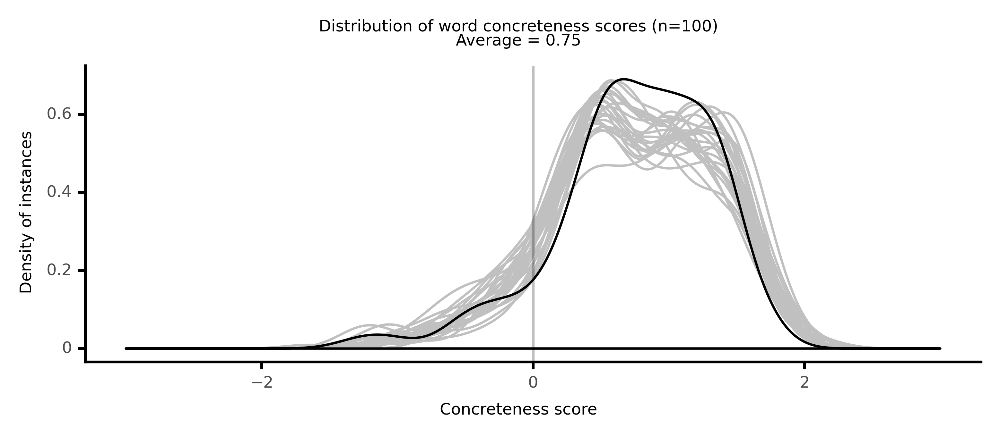

<ggplot: (8786696759941)>

 48%|████▊     | 12/25 [02:43<02:39, 12.26s/it]

#### #13 most concrete passage: Rabelais, _Gargantua and Pantagruel_ (1534)

<p>? Fri. <conc><conc886>Sky</conc886></conc>. <conc><conc952>Pan</conc952></conc>. What <neither><conc478>kind</conc478></neither> of <conc><conc980>cloth</conc980></conc> is it? Fri. <conc><conc916>Fine</conc916></conc>. <conc><conc952>Pan</conc952></conc>. What <conc><conc927>caps</conc927></conc> do they <conc><conc870>wear</conc870></conc>? Fri. <conc><conc984>Blue</conc984></conc>. <conc><conc952>Pan</conc952></conc>. What's the <conc><conc802>colour</conc802></conc> of their <conc><conc994>stockings</conc994></conc>? Fri. <conc><conc931>Red</conc931></conc>. <conc><conc952>Pan</conc952></conc>. What <conc><conc870>wear</conc870></conc> they on their <conc><conc936>feet</conc936></conc>? Fri. <conc><conc985>Pumps</conc985></conc>. <conc><conc952>Pan</conc952></conc>. How do they use to be? Fri. <conc><conc807>Foul</conc807></conc>. <conc><conc952>Pan</conc952></conc>. How do they use to <neither><conc465>walk</conc465></neither>? Fri. <conc><conc885>Fast</conc885></conc>. <conc><conc952>Pan</conc952></conc>. Now let us talk of the <conc><conc895>kitchen</conc895></conc>, I mean that of the <neither><conc728>harlots</conc728></neither>, and without going <neither><conc710>hand</conc710></neither> over <conc><conc924>head</conc924></conc> let's a little <abs><conc043>examine</conc043></abs> things by <abs><conc064>particulars</conc064></abs>. What is in their <neither><conc670>kitchens</conc670></neither>? Fri. Fire. <conc><conc952>Pan</conc952></conc>. What <conc><conc811>fuel</conc811></conc> <neither><conc752>feeds</conc752></neither> it? Fri. <conc><conc987>Wood</conc987></conc>. <conc><conc952>Pan</conc952></conc>. What sort of <conc><conc987>wood</conc987></conc> <neither><conc751>is't</conc751></neither>? Fri. <conc><conc923>Dry</conc923></conc>. <conc><conc952>Pan</conc952></conc>. And of what <neither><conc478>kind</conc478></neither> of <conc><conc929>trees</conc929></conc>? Fri. Yews. <conc><conc952>Pan</conc952></conc>. What are the <conc><conc923>faggots</conc923></conc> and brushes of? Fri. <conc><conc967>Holm</conc967></conc>. <conc><conc952>Pan</conc952></conc>. What <conc><conc987>wood</conc987></conc> d'ye <conc><conc864>burn</conc864></conc> in your <conc><conc861>chambers</conc861></conc>? Fri. <conc><conc896>Pine</conc896></conc>. <conc><conc952>Pan</conc952></conc>. And of what other <conc><conc929>trees</conc929></conc>? Fri. <conc><conc984>Lime</conc984></conc>. <conc><conc952>Pan</conc952></conc>. Hearkee me; as for the <conc><conc989>buttocks</conc989></conc>, I'll go your <neither><conc512>halves</conc512></neither>. <neither><conc311>Pray</conc311></neither>, how do you feed'em? Fri. Well. <conc><conc952>Pan</conc952></conc>. First, what do they <conc><conc787>eat</conc787></conc>? Fri. <neither><conc663>Bread</conc663></neither>. <conc><conc952>Pan</conc952></conc>. Of what <neither><conc666>complexion</conc666></neither>? Fri. <conc><conc996>White</conc996></conc>. <conc><conc952>Pan</conc952></conc>. And what else? Fri. <conc><conc800>Meat</conc800></conc>. <conc><conc952>Pan</conc952></conc>. How do they love it <conc><conc978>dressed</conc978></conc>? Fri. <conc><conc949>Roast</conc949></conc>. <conc><conc952>Pan</conc952></conc>. What sort of <conc><conc968>porridge</conc968></conc>? Fri. None. <conc><conc952>Pan</conc952></conc>. Are they for <conc><conc985>pies</conc985></conc> and <conc><conc942>tarts</conc942></conc>? Fri. Much. <conc><conc952>Pan</conc952></conc>. Then I'm their man. Will <conc><conc930>fish</conc930></conc> go down with them? Fri. Well. <conc><conc952>Pan</conc952></conc>. And what else? Fri.</p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

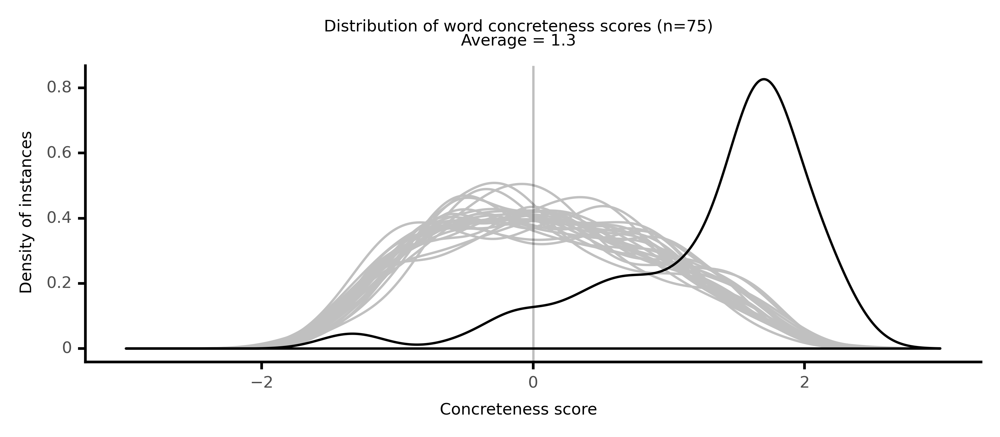

<ggplot: (8786700251413)>

 52%|█████▏    | 13/25 [03:00<02:41, 13.46s/it]

#### #14 most concrete passage: Steinbeck, _The Grapes of Wrath_ (1939)

<p>. We <neither><conc659>ai</conc659></neither> n't got nothing' <conc><conc946>layin</conc946></conc>' around. They never <conc><conc823>stole</conc823></conc> nothing' from us.'' <neither><conc560>Big</conc560></neither> Bill, <conc><conc995>munching</conc995></conc> his <conc><conc880>pie</conc880></conc>, <neither><conc610>looked</conc610></neither> up the <neither><conc648>road</conc648></neither> through the <conc><conc809>screened</conc809></conc> <conc><conc968>window</conc968></conc>. Better <conc><conc774>tie</conc774></conc> your <neither><conc662>stuff</conc662></neither> down. I think you got some of'em <neither><conc385>coming</conc385></neither>' now.'' A1926 <neither><conc717>Nash</conc717></neither> <conc><conc921>sedan</conc921></conc> <conc><conc925>pulled</conc925></conc> <conc><conc764>wearily</conc764></conc> off the <neither><conc702>highway</conc702></neither>. The back <conc><conc778>seat</conc778></conc> was <conc><conc885>piled</conc885></conc> nearly to the <conc><conc815>ceiling</conc815></conc> with <conc><conc989>sacks</conc989></conc>, with <conc><conc985>pots</conc985></conc> and <conc><conc925>pans</conc925></conc>, and on the very top, right up against the <conc><conc815>ceiling</conc815></conc>, two <neither><conc658>boys</conc658></neither> <neither><conc648>road</conc648></neither>. On the top of the <conc><conc811>car</conc811></conc>, a <conc><conc990>mattress</conc990></conc> and a <conc><conc935>folded</conc935></conc> <conc><conc910>tent</conc910></conc>; <conc><conc910>tent</conc910></conc> <neither><conc642>poles</conc642></neither> <conc><conc820>tied</conc820></conc> along the <neither><conc552>running</conc552></neither> <neither><conc411>board</conc411></neither>. The <conc><conc811>car</conc811></conc> <conc><conc925>pulled</conc925></conc> up to the <neither><conc627>gas</conc627></neither> <conc><conc937>pumps</conc937></conc>. A <conc><conc871>dark-haired</conc871></conc>, hatchet-faced man got <neither><conc664>slowly</conc664></neither> out. And the two <neither><conc658>boys</conc658></neither> <conc><conc948>slid</conc948></conc> down from the <conc><conc730>load</conc730></conc> and <neither><conc614>hit</conc614></neither> the <neither><conc572>ground</conc572></neither>. <conc><conc865>Mae</conc865></conc> <conc><conc848>walked</conc848></conc> around the <conc><conc873>counter</conc873></conc> and <neither><conc673>stood</conc673></neither> in the <conc><conc842>door</conc842></conc>. The man was <conc><conc891>dressed</conc891></conc> in <conc><conc851>grey</conc851></conc> <conc><conc890>wool</conc890></conc> <conc><conc879>trousers</conc879></conc> and a <conc><conc922>blue</conc922></conc> <conc><conc922>shirt</conc922></conc>, <conc><conc801>dark</conc801></conc> <conc><conc922>blue</conc922></conc> with <conc><conc771>sweat</conc771></conc> on the back and under the <neither><conc481>arms</conc481></neither>. The <neither><conc658>boys</conc658></neither> in <conc><conc955>overalls</conc955></conc> and nothing else, <conc><conc883>ragged</conc883></conc> <conc><conc920>patched</conc920></conc> <conc><conc955>overalls</conc955></conc>. Their <conc><conc899>hair</conc899></conc> was <neither><conc527>light</conc527></neither>, and it <neither><conc673>stood</conc673></neither> up <neither><conc693>evenly</conc693></neither> all over their <neither><conc597>heads</conc597></neither>, for it had been roached. Their <neither><conc529>faces</conc529></neither> were <conc><conc928>streaked</conc928></conc> with <conc><conc805>dust</conc805></conc>. They went <neither><conc285>directly</conc285></neither> to the <conc><conc893>mud</conc893></conc> <conc><conc991>puddle</conc991></conc> under the <conc><conc984>hose</conc984></conc> and <conc><conc808>dug</conc808></conc> their <conc><conc895>toes</conc895></conc> into the <conc><conc893>mud</conc893></conc>. The man <neither><conc337>asked</conc337></neither>, Can we <conc><conc757>git</conc757></conc> some <conc><conc773>water</conc773></conc>, <neither><conc701>ma'am</conc701></neither>?'' A look of <neither><conc354>annoyance</conc354></neither> <conc><conc788>crossed</conc788></conc> <conc><conc865>Mae</conc865></conc>'s <neither><conc392>face</conc392></neither>. Sure, go <neither><conc398>ahead</conc398></neither>.'' She said <conc><conc847>softly</conc847></conc> over her <conc><conc887>shoulder</conc887></conc>, I'll keep my <neither><conc529>eye</conc529></neither> on the <conc><conc984>hose</conc984></conc>.'' She <conc><conc730>watched</conc730></conc> while the man <neither><conc664>slowly</conc664></neither> <conc><conc988>unscrewed</conc988></conc> the <conc><conc975>radiator</conc975></conc> <conc><conc937>cap</conc937></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

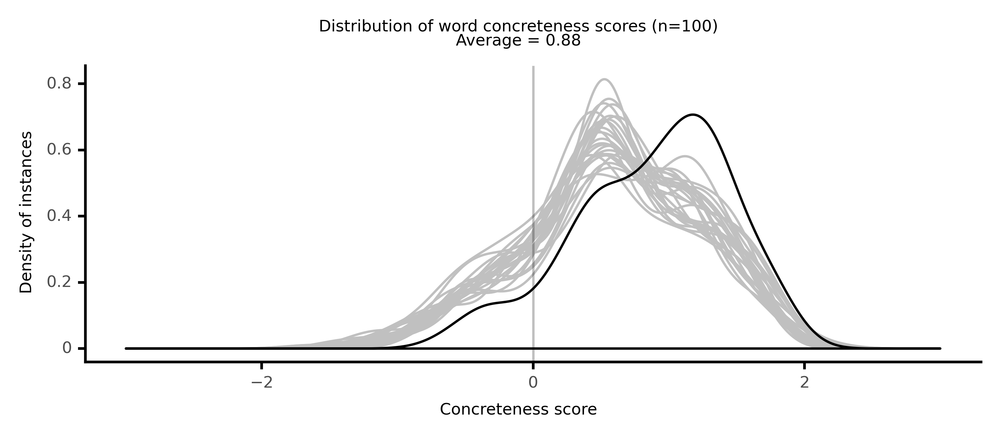

<ggplot: (8786700103905)>

 56%|█████▌    | 14/25 [03:15<02:35, 14.18s/it]

#### #15 most concrete passage: Vollmann, _The Rifles_ (1994)

<p>would give way for a <neither><conc447>space</conc447></neither> to <neither><conc655>sedimentary</conc655></neither> <conc><conc891>shelves</conc891></conc> and <conc><conc929>ledges</conc929></conc> <conc><conc892>studded</conc892></conc> with <neither><conc483>fossil</conc483></neither> <conc><conc800>snail</conc800></conc> <conc><conc914>shells</conc914></conc> and <conc><conc920>clam</conc920></conc> <conc><conc914>shells</conc914></conc> that were no different from the ones that lay <neither><conc690>scattered</conc690></neither> among the <conc><conc966>gravel</conc966></conc> all across the <conc><conc757>xxx</conc757></conc> <conc><conc814>square</conc814></conc> <neither><conc706>miles</conc706></neither> of the <neither><conc667>island</conc667></neither>, and here the <conc><conc767>river</conc767></conc> made more <conc><conc822>pools</conc822></conc> which might have been the ones that the Inuk girl had told you about, but you were never going to find that out, either. Sometimes there were <neither><conc701>cairns</conc701></neither> on the ridgetops, and the <neither><conc578>fallen</conc578></neither> <neither><conc584>ruins</conc584></neither> of <conc><conc752>stone</conc752></conc> <neither><conc620>houses</conc620></neither>. Sometimes great <conc><conc854>blocks</conc854></conc> of <conc><conc752>stone</conc752></conc> had <neither><conc568>shattered</conc568></neither> into <conc><conc904>bricks</conc904></conc> on the <conc><conc922>hillside</conc922></conc>; you <conc><conc817>picked</conc817></conc> your way down them as if down <neither><conc559>ruined</conc559></neither> <conc><conc919>stairs</conc919></conc>. A little before <neither><conc724>midnight</conc724></neither> on the third day, you <neither><conc404>reached</conc404></neither> a <neither><conc497>plain</conc497></neither> of <conc><conc832>rocks</conc832></conc> <conc><conc868>spewed</conc868></conc> up from the <conc><conc741>permafrost</conc741></conc>:- thin <conc><conc947>slabs</conc947></conc> on <conc><conc858>edge</conc858></conc> Like <conc><conc927>decks</conc927></conc> of <neither><conc692>cards</conc692></neither>, and <conc><conc832>rocks</conc832></conc> with <conc><conc871>holes</conc871></conc> in them, and <conc><conc832>rocks</conc832></conc> Like <neither><conc705>skulls</conc705></neither>. Here at last you found the <abs><conc175>source</conc175></abs> of your <conc><conc767>river</conc767></conc>, a <conc><conc887>pool</conc887></conc> of <conc><conc773>water</conc773></conc> that seemed <conc><conc763>eerily</conc763></conc> to <conc><conc813>float</conc813></conc> on the <conc><conc966>gravel</conc966></conc>, <conc><conc773>water</conc773></conc> from nowhere, of a <conc><conc738>transparent</conc738></conc> browiush <neither><conc699>colour</conc699></neither>. The <conc><conc887>pool</conc887></conc> was <conc><conc983>sheared</conc983></conc> almost in two by a <neither><conc439>long</conc439></neither> <conc><conc966>gravel</conc966></conc> <neither><conc435>bank</conc435></neither>, behind which <conc><conc835>glowed</conc835></conc> the <conc><conc999>pink</conc999></conc> <conc><conc740>clouds</conc740></conc> of <neither><conc724>midnight</conc724></neither>, <conc><conc812>reddening</conc812></conc> the <conc><conc773>water</conc773></conc> just a little, and <neither><conc476>west</conc476></neither> of the <conc><conc740>clouds</conc740></conc> the <conc><conc783>sky</conc783></conc> was sulphur-yellow behind another <conc><conc838>ridge</conc838></conc>. As you <conc><conc730>watched</conc730></conc>, the <conc><conc740>clouds</conc740></conc> <conc><conc868>blew</conc868></conc> away, and the <conc><conc887>pool</conc887></conc> became the <neither><conc699>colour</conc699></neither> of <conc><conc827>melted</conc827></conc> sulphur.- So you had <neither><conc404>reached</conc404></neither> it finally!- You <conc><conc879>climbed</conc879></conc> the <conc><conc966>gravel</conc966></conc> <neither><conc435>bank</conc435></neither>( and now you were <neither><conc388>high</conc388></neither> enough to see a second <conc><conc838>ridge</conc838></conc> to the <neither><conc476>west</conc476></neither>, beyond which a <conc><conc869>tube</conc869></conc> of <neither><conc723>beautiful</conc723></neither> <conc><conc987>orange</conc987></conc> <neither><conc527>light</conc527></neither> had been <conc><conc828>squeezed</conc828></conc> upon the <conc><conc829>blade</conc829></conc> of a third <conc><conc838>ridge</conc838></conc>, and the <neither><conc336>field</conc336></neither> of <conc><conc733>cloud</conc733></conc> above was <conc><conc983>yellow</conc983></conc> and <conc><conc768>glowing</conc768></conc>). You <neither><conc610>looked</conc610></neither> at the <conc><conc887>pool</conc887></conc>. It <conc><conc897>curved</conc897></conc> around <neither><conc500>east</conc500></neither> and <neither><conc525>north</conc525></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

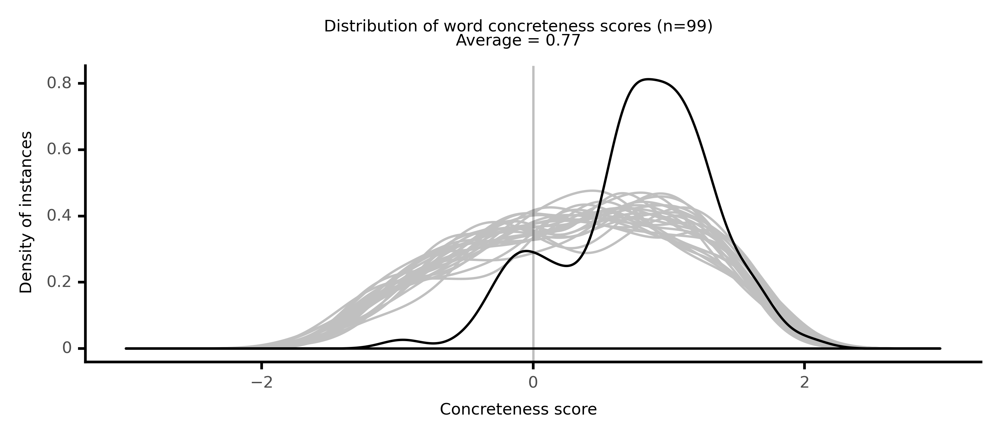

<ggplot: (8786695509541)>

 60%|██████    | 15/25 [03:28<02:17, 13.75s/it]

#### #16 most concrete passage: Delany, _Dhalgren_ (1975)

<p><conc><conc828>hat</conc828></conc> with a <neither><conc700>paper</conc700></neither> under his <conc><conc776>arm</conc776></conc>; one woman in <neither><conc290>read</conc290></neither> <conc><conc938>shoes</conc938></conc> with <neither><conc560>big</conc560></neither>, <conc><conc883>boxy</conc883></conc> <conc><conc869>heels</conc869></conc>. Across the <conc><conc732>street</conc732></conc> <neither><conc673>stood</conc673></neither> a longhaired <conc><conc808>kid</conc808></conc> in an <neither><conc340>army</conc340></neither> <conc><conc933>jacket</conc933></conc>, <conc><conc830>thumb</conc830></conc> out for the <neither><conc616>uphill</conc616></neither> <neither><conc532>traffic</conc532></neither>. He <neither><conc639>grinned</conc639></neither> at me, trying for my <abs><conc197>attention</conc197></abs>. I thought it was because I'ld left one <conc><conc821>boot</conc821></conc> off, but he wanted me to look at something in the <conc><conc783>sky</conc783></conc> without <neither><conc272>attracting</conc272></neither> the other people at the stop. I <neither><conc610>looked</conc610></neither> up between the <conc><conc891>trolley</conc891></conc> <conc><conc827>wires</conc827></conc>. <conc><conc732>White</conc732></conc> <conc><conc740>clouds</conc740></conc> <conc><conc910>hung</conc910></conc> behind the <conc><conc798>downtown</conc798></conc> <neither><conc581>buildings</conc581></neither>, <conc><conc908>windows</conc908></conc> Like a <neither><conc656>broken</conc656></neither> <conc><conc935>honey</conc935></conc> <conc><conc994>comb</conc994></conc> <neither><conc552>running</conc552></neither> with <conc><conc907>brass</conc907></conc> dawnlight. Perhaps twenty-five <neither><conc456>degrees</conc456></neither> of an <neither><conc436>arc</conc436></neither>, air-brushed on the <conc><conc783>sky</conc783></conc>, were the <conc><conc999>pink</conc999></conc>, the <conc><conc948>green</conc948></conc>, the <conc><conc956>purple</conc956></conc> of a <conc><conc891>rainbow</conc891></conc>. I <neither><conc610>looked</conc610></neither> back at the <conc><conc808>kid</conc808></conc> on the <conc><conc928>corner</conc928></conc>, but a seventy-five Buick came <conc><conc955>glistening</conc955></conc> to a stop for him and he was getting o God o Jesus, please o please I ca n't I please do n't let it <conc><conc780>Woke</conc780></conc> up this morning in the <conc><conc801>dark</conc801></conc> <conc><conc976>loft</conc976></conc>. <neither><conc449>Heard</conc449></neither> a <neither><conc667>handful</conc667></neither> of <neither><conc721>cars</conc721></neither> before I <conc><conc931>rolled</conc931></conc> to the <conc><conc968>window</conc968></conc> and <conc><conc925>pulled</conc925></conc> back the <conc><conc889>shade</conc889></conc>. <conc><conc865>Sunlight</conc865></conc> <neither><conc698>opened</conc698></neither> Like a <conc><conc928>fan</conc928></conc> across the <conc><conc951>blanket</conc951></conc>. I <conc><conc879>climbed</conc879></conc> down the <conc><conc858>ladder</conc858></conc>, <conc><conc854>pole</conc854></conc>, <conc><conc891>dressed</conc891></conc>, and went outside. The <neither><conc511>air</conc511></neither> was <conc><conc731>chill</conc731></conc> enough to see <neither><conc667>breath</conc667></neither>. The <conc><conc783>sky</conc783></conc>, <conc><conc830>lake</conc830></conc> <conc><conc922>blue</conc922></conc>, was <conc><conc988>fluffed</conc988></conc> with <conc><conc740>clouds</conc740></conc> to the <neither><conc500>south</conc500></neither>; the <neither><conc525>north</conc525></neither> was <abs><conc119>clear</conc119></abs> as <conc><conc773>water</conc773></conc>. I <conc><conc848>walked</conc848></conc> to the end of the <conc><conc763>block</conc763></conc>. The <conc><conc947>pavement</conc947></conc> was <conc><conc801>dark</conc801></conc> near the <conc><conc858>edge</conc858></conc> from <conc><conc960>pre-dawn</conc960></conc> <conc><conc803>rain</conc803></conc>. I <conc><conc814>stepped</conc814></conc> over a <conc><conc991>puddle</conc991></conc>. At the <conc><conc842>bus</conc842></conc> stop-- was it eight <conc><conc759>o'clock</conc759></conc> yet?-- <neither><conc673>stood</conc673></neither> a man in a <conc><conc999>quilted</conc999></conc> <conc><conc933>jacket</conc933></conc> <neither><conc660>carrying</conc660></neither> a <neither><conc692>black</conc692></neither> <conc><conc966>enamel</conc966></conc> <conc><conc851>lunch</conc851></conc> <conc><conc971>box</conc971></conc>; two women with <conc><conc885>fur</conc885></conc> <conc><conc932>collars</conc932></conc>; a man in a <conc><conc853>gray</conc853></conc> <conc><conc828>hat</conc828></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

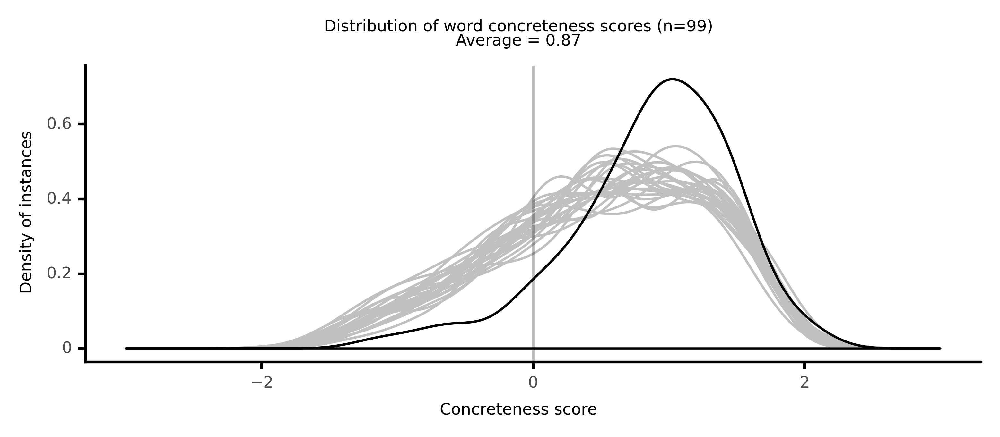

<ggplot: (8786695607565)>

 64%|██████▍   | 16/25 [03:48<02:18, 15.43s/it]

#### #17 most concrete passage: Delany, _Dhalgren_ (1975)

<p>scimitared with it, half <conc><conc776>moons</conc776></conc> <conc><conc731>shadowed</conc731></conc> under <conc><conc862>cracked</conc862></conc> <conc><conc823>skin</conc823></conc>) <conc><conc895>flat</conc895></conc> on the <conc><conc873>counter</conc873></conc>. His <conc><conc899>hair</conc899></conc> <conc><conc904>feathered</conc904></conc> the <conc><conc920>rim</conc920></conc> of his <neither><conc700>ear</conc700></neither>( in the <conc><conc825>twisted</conc825></conc> <conc><conc804>cartilage</conc804></conc>: <conc><conc732>white</conc732></conc> <conc><conc961>flakes</conc961></conc>. On the <neither><conc651>trumpet</conc651></neither>'s <conc><conc858>floor</conc858></conc>: <conc><conc784>dry</conc784></conc> <conc><conc961>amber</conc961></conc>) and went without <abs><conc124>change</conc124></abs> into <conc><conc873>sideburns</conc873></conc> that <neither><conc406>join</conc406></neither> around his <conc><conc863>chin</conc863></conc> in <conc><conc942>scrubby</conc942></conc> <neither><conc695>beard</conc695></neither>. His <conc><conc917>neck</conc917></conc> was <conc><conc853>gray</conc853></conc>-- with one <conc><conc731>clean</conc731></conc> <neither><conc710>smear</conc710></neither>( where he'd been <conc><conc874>rubbing</conc874></conc> himself?). His <conc><conc882>lids</conc882></conc> were <conc><conc873>thickened</conc873></conc>, <conc><conc977>coral</conc977></conc> <conc><conc951>rimmed</conc951></conc>, and lashless. The <neither><conc406>short</conc406></neither> <conc><conc911>sleeve</conc911></conc> of his <conc><conc922>shirt</conc922></conc>: <conc><conc736>torn</conc736></conc> on the <conc><conc941>seam</conc941></conc> over <conc><conc732>white</conc732></conc> <neither><conc621>flesh</conc621></neither>. Above the <conc><conc787>backs</conc787></conc> of his <conc><conc938>shoes</conc938></conc>, his <conc><conc955>socks</conc955></conc>, both <conc><conc869>heels</conc869></conc> <conc><conc736>torn</conc736></conc>, <conc><conc949>curled</conc949></conc> from <conc><conc899>ridged</conc899></conc>, <neither><conc692>black</conc692></neither> <abs><conc060>callous</conc060></abs>. The <conc><conc756>fly</conc756></conc> <conc><conc962>flap</conc962></conc> on his <conc><conc963>slacks</conc963></conc> was <neither><conc656>broken</conc656></neither>. The <conc><conc907>brass</conc907></conc> <conc><conc762>teeth</conc762></conc> roller-coastered over his <conc><conc977>lap</conc977></conc> and under his <conc><conc883>belt</conc883></conc>-- the <conc><conc848>buckle</conc848></conc> <neither><conc644>tongue</conc644></neither> had <conc><conc770>snapped</conc770></conc>: he'd <conc><conc820>tied</conc820></conc> the belt-ends together. You <conc><conc728>wan</conc728></conc> na <neither><conc592>buy</conc592></neither> me a <conc><conc780>beer</conc780></conc>?'' he <neither><conc337>asked</conc337></neither>. First <neither><conc615>night</conc615></neither> I got to <neither><conc645>town</conc645></neither>, I <conc><conc744>bought</conc744></conc> you and your <conc><conc800>girlfriend</conc800></conc> a <conc><conc780>beer</conc780></conc>.'' Just ask for what you want,'' I said. The <conc><conc830>bartender</conc830></conc> <conc><conc806>glanced</conc806></conc> over, <neither><conc669>pushed</conc669></neither> a <conc><conc931>rolled</conc931></conc> <conc><conc911>sleeve</conc911></conc> <neither><conc275>higher</conc275></neither>; from under his <conc><conc911>thick</conc911></conc> <conc><conc873>fingers</conc873></conc> the <conc><conc869>tattooed</conc869></conc> <conc><conc836>leopard</conc836></conc> <conc><conc791>stalked</conc791></conc> the <neither><conc703>jungle</conc703></neither> of his <conc><conc776>arm</conc776></conc>. I'ld <neither><conc592>buy</conc592></neither> it myself,'' <neither><conc673>Jack</conc673></neither> said. But, you know, I've been <neither><conc640>pretty</conc640></neither> down and out. You <neither><conc592>buy</conc592></neither> me a <conc><conc780>beer</conc780></conc>, man, and I'll do the same for you, soon as I get myself back on my <conc><conc836>feet</conc836></conc>.'' I said to the <conc><conc830>bartender</conc830></conc>: How come you wo n't <neither><conc293>serve</conc293></neither> him?'' The <conc><conc830>bartender</conc830></conc> put his <conc><conc881>knuckles</conc881></conc> on the <conc><conc873>counter</conc873></conc> and <neither><conc637>swayed</conc637></neither>. All he got ta do is ask for what he wants.'' He <neither><conc610>looked</conc610></neither> around at the other <neither><conc544>customers</conc544></neither>. Give us a <conc><conc755>couple</conc755></conc> of <conc><conc835>beers</conc835></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

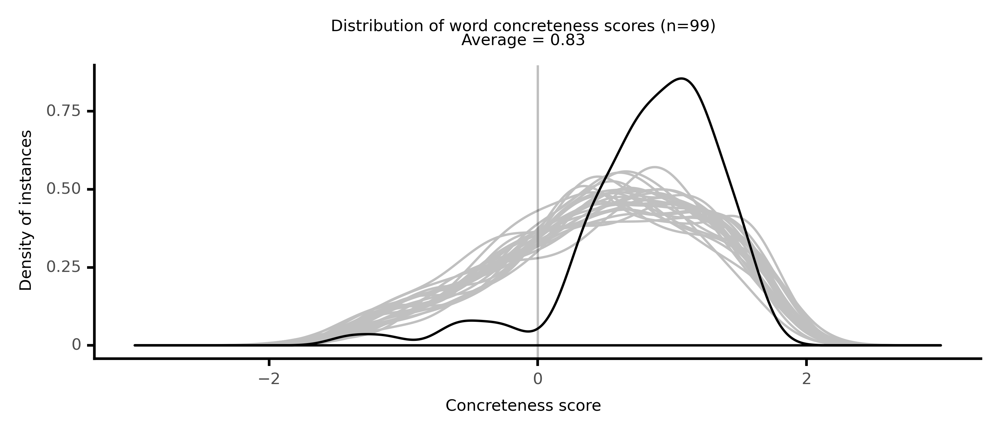

<ggplot: (8786692930533)>

 68%|██████▊   | 17/25 [04:06<02:10, 16.36s/it]

#### #18 most concrete passage: Delany, _Hogg_ (1995)

<p>. Denny <neither><conc404>reached</conc404></neither> between my <conc><conc894>legs</conc894></conc> to <neither><conc672>dig</conc672></neither> my <neither><conc646>dick</conc646></neither> out of her <conc><conc952>pussy</conc952></conc>. I <conc><conc992>peeled</conc992></conc> off her. She <conc><conc928>glistened</conc928></conc> with <conc><conc771>sweat</conc771></conc>, <conc><conc863>chin</conc863></conc>, <conc><conc917>neck</conc917></conc> and <conc><conc866>tits</conc866></conc>. Most of it was mine, I think. With his <neither><conc644>tongue</conc644></neither> out, Denny <neither><conc710>dropped</conc710></neither> his <neither><conc392>face</conc392></neither> in her <conc><conc971>box</conc971></conc>. I tried to <neither><conc551>push</conc551></neither> my <neither><conc651>head</conc651></neither> under his <conc><conc897>belly</conc897></conc> to <neither><conc696>eat</conc696></neither> my <neither><conc707>shit</conc707></neither> off his <neither><conc646>dick</conc646></neither>. I could <conc><conc778>smell</conc778></conc> it as I tried to <conc><conc766>wedge</conc766></conc> my <neither><conc651>head</conc651></neither> in there, and could feel his <conc><conc810>cock</conc810></conc> <neither><conc601>butting</conc601></neither> my <conc><conc857>forehead</conc857></conc>.( Her <conc><conc882>knee</conc882></conc> <neither><conc614>hit</conc614></neither> my <neither><conc700>ear</conc700></neither>.) He <neither><conc669>pushed</conc669></neither> up so I could <conc><conc790>grab</conc790></conc> it in my <conc><conc832>mouth</conc832></conc>. I got my <neither><conc651>head</conc651></neither> around; and, all <conc><conc813>slick</conc813></conc> with <conc><conc915>juice</conc915></conc> and <neither><conc707>shit</conc707></neither>, it went right in. In the other room the <neither><conc701>nigger</conc701></neither> was <conc><conc778>laughing</conc778></conc>. The girl was <neither><conc477>struggling</conc477></neither> again. Maybe I was <neither><conc413>hurting</conc413></neither> her <conc><conc882>knee</conc882></conc>. But Denny was <neither><conc568>holding</conc568></neither> her <conc><conc886>wrists</conc886></conc> and <conc><conc951>lapping</conc951></conc> out her <conc><conc971>box</conc971></conc> when-- Now what the <neither><conc688>fuck</conc688></neither>---- the <neither><conc383>voice</conc383></neither> came from the front door.-- do you little <neither><conc573>bastards</conc573></neither> think you're doing?'' I <conc><conc823>jerked</conc823></conc> my <neither><conc651>head</conc651></neither> from under Denny and <neither><conc610>looked</conc610></neither> up. Denny <conc><conc823>jerked</conc823></conc> around too. The man took his <neither><conc510>played</conc510></neither> <conc><conc887>shoulder</conc887></conc> off the <conc><conc842>door</conc842></conc> <conc><conc944>jamb</conc944></conc>, <neither><conc565>shifted</conc565></neither> his <neither><conc470>weight</conc470></neither> to his other <conc><conc857>hip</conc857></conc>; he was <conc><conc861>tall</conc861></conc>, <conc><conc821>bony</conc821></conc>, with <conc><conc951>spiky</conc951></conc> <conc><conc820>brown</conc820></conc> <conc><conc899>hair</conc899></conc>. He had very <conc><conc760>buck</conc760></conc> <conc><conc762>teeth</conc762></conc>, <conc><conc801>dark</conc801></conc> <neither><conc424>gaps</conc424></neither> between all of them, some of which was <neither><conc297>decay</conc297></neither>. <conc><conc863>Chin</conc863></conc> and <conc><conc885>cheek</conc885></conc> were all <conc><conc870>patchy</conc870></conc> <conc><conc891>stubble</conc891></conc>. Jesus Christ, <neither><conc659>ai</conc659></neither> n't you into some <neither><conc707>shit</conc707></neither> here.'' <conc><conc869>Tattooed</conc869></conc> <neither><conc535>panthers</conc535></neither> <conc><conc791>stalked</conc791></conc> in the <conc><conc899>hair</conc899></conc> down his <conc><conc939>forearms</conc939></conc>, <conc><conc881>tails</conc881></conc> still under his <conc><conc931>rolled</conc931></conc> <conc><conc939>sleeves</conc939></conc>. With a <conc><conc934>knobby</conc934></conc> <neither><conc444>hand</conc444></neither>, he <conc><conc916>plucked</conc916></conc> at the <conc><conc946>crotch</conc946></conc> of his <conc><conc922>jeans</conc922></conc>-- all those <neither><conc439>long</conc439></neither> <neither><conc573>muscles</conc573></neither> <conc><conc931>rolled</conc931></conc>: it seemed one <conc><conc769>panther</conc769></conc> took another <neither><conc304>step</conc304></neither>. <neither><conc659>Ai</conc659></neither> n't this some <neither><conc707>shit</conc707></neither>, though?'' He had <neither><conc560>big</conc560></neither> <neither><conc692>black</conc692></neither> workshoes on, <conc><conc928>laced</conc928></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

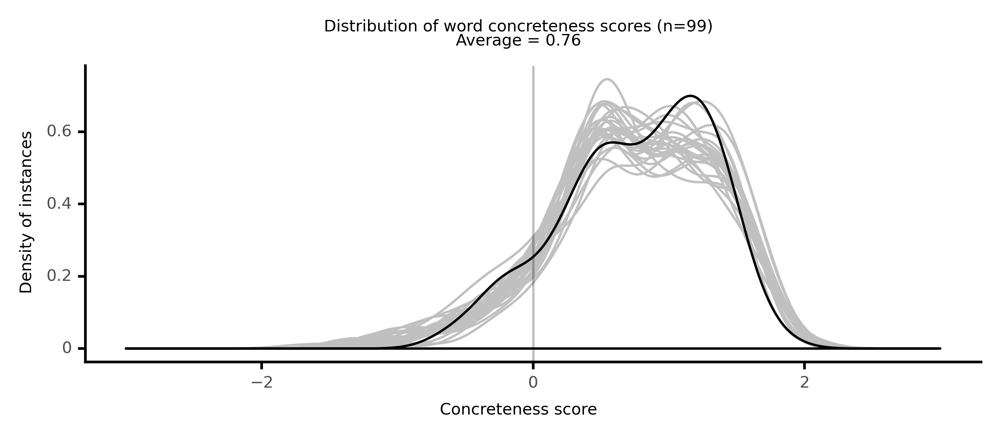

<ggplot: (8786699847189)>

 72%|███████▏  | 18/25 [04:20<01:48, 15.54s/it]

#### #19 most concrete passage: Delany, _Hogg_ (1995)

<p>came out, <neither><conc358>hard</conc358></neither> as a <conc><conc799>pipe</conc799></conc>, <conc><conc979>dangling</conc979></conc> its <conc><conc987>rag</conc987></conc> of <conc><conc823>skin</conc823></conc>. His <conc><conc863>knees</conc863></conc> <neither><conc614>hit</conc614></neither> the <conc><conc990>mattress</conc990></conc>, and I <neither><conc670>caught</conc670></neither> his <neither><conc669>stench</conc669></neither>. I tried to <neither><conc437>remember</conc437></neither> how many times his <conc><conc852>clothes</conc852></conc> had been <conc><conc946>soiled</conc946></conc> since I'ld <neither><conc368>met</conc368></neither> him. With his <conc><conc830>thumb</conc830></conc>, he <conc><conc842>jabbed</conc842></conc> at the <conc><conc828>fleshy</conc828></conc> <conc><conc970>petals</conc970></conc> of Honey-Pie's <conc><conc796>cunt</conc796></conc>. She <conc><conc823>jerked</conc823></conc> against me. I let go and <conc><conc890>scrambled</conc890></conc> around to get my <neither><conc392>face</conc392></neither> between them. I <conc><conc773>licked</conc773></conc> her <conc><conc952>pussy</conc952></conc> around where his <conc><conc830>thumb</conc830></conc> <conc><conc808>dug</conc808></conc>-- she did n't have much <conc><conc899>hair</conc899></conc>. Then I tried to get at his <conc><conc810>cock</conc810></conc>-- the <conc><conc920>rim</conc920></conc> of his <conc><conc738>fist</conc738></conc> <neither><conc629>beat</conc629></neither> at my <conc><conc832>mouth</conc832></conc>-- but he wanted to get it in her. <neither><conc436>Hogg</conc436></neither> <conc><conc858>shoved</conc858></conc> <neither><conc448>forward</conc448></neither> and my <neither><conc651>head</conc651></neither> got <neither><conc670>caught</conc670></neither> between his <conc><conc828>fleshy</conc828></conc> <neither><conc597>gut</conc597></neither>, his <conc><conc863>wrinkled</conc863></conc> <conc><conc922>jeans</conc922></conc>, her bunched-up <conc><conc941>dress</conc941></conc> and <conc><conc831>smooth</conc831></conc> <conc><conc820>brown</conc820></conc> <conc><conc897>belly</conc897></conc>. I <conc><conc925>pulled</conc925></conc> out. <neither><conc436>Hogg</conc436></neither> was already <conc><conc920>humping</conc920></conc> her, <neither><conc358>hard</conc358></neither>. His <conc><conc863>knees</conc863></conc> were on the <conc><conc858>floor</conc858></conc> and he was <conc><conc839>grunting</conc839></conc> Like a <neither><conc560>big</conc560></neither>. She was <conc><conc770>gasping</conc770></conc> Like one. I <conc><conc923>crawled</conc923></conc> down his <conc><conc894>legs</conc894></conc>, and for a while I <conc><conc808>gnawed</conc808></conc> on his <neither><conc542>bore</conc542></neither>, <neither><conc692>black</conc692></neither>, <conc><conc862>cracked</conc862></conc> <conc><conc835>heel</conc835></conc>. Then I got up, <conc><conc923>crawled</conc923></conc> onto the <conc><conc990>mattress</conc990></conc> again, and <conc><conc925>pulled</conc925></conc> at the back of his <conc><conc923>pants</conc923></conc>. They came down over his <conc><conc824>heaving</conc824></conc> <neither><conc672>ass</conc672></neither>; <neither><conc385>coming</conc385></neither> up, the <conc><conc881>buttocks</conc881></conc> <neither><conc698>opened</conc698></neither>, shit-stuck either side. They <neither><conc622>fell</conc622></neither>, <conc><conc839>clamping</conc839></conc>, then <neither><conc726>rose</conc726></neither>, the <conc><conc899>hair</conc899></conc> <conc><conc884>pulling</conc884></conc> apart the half-dried past. The <neither><conc652>sphincter</conc652></neither>, <conc><conc921>discolored</conc921></conc> and <conc><conc863>wrinkled</conc863></conc>, <neither><conc609>suddenly</conc609></neither> <conc><conc783>puckered</conc783></conc>, then <conc><conc840>bubbled</conc840></conc>. I <conc><conc836>stuck</conc836></conc> my <neither><conc644>tongue</conc644></neither> in it. His <conc><conc881>buttocks</conc881></conc> <neither><conc572>ground</conc572></neither> my <neither><conc392>face</conc392></neither>. Yeah,'' <neither><conc436>Hogg</conc436></neither> <neither><conc608>growled</conc608></neither>, you finally <conc><conc751>eating</conc751></conc>' <neither><conc707>shit</conc707></neither>, you little <neither><conc612>bastard</conc612></neither>.'' His <neither><conc444>hand</conc444></neither> came back and <neither><conc669>pushed</conc669></neither> my <neither><conc651>head</conc651></neither> further down. With a <conc><conc948>palm</conc948></conc> on one <conc><conc885>cheek</conc885></conc>, I <conc><conc739>ate</conc739></conc> out his <neither><conc673>asshole</conc673></neither>. I put my other <neither><conc444>hand</conc444></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

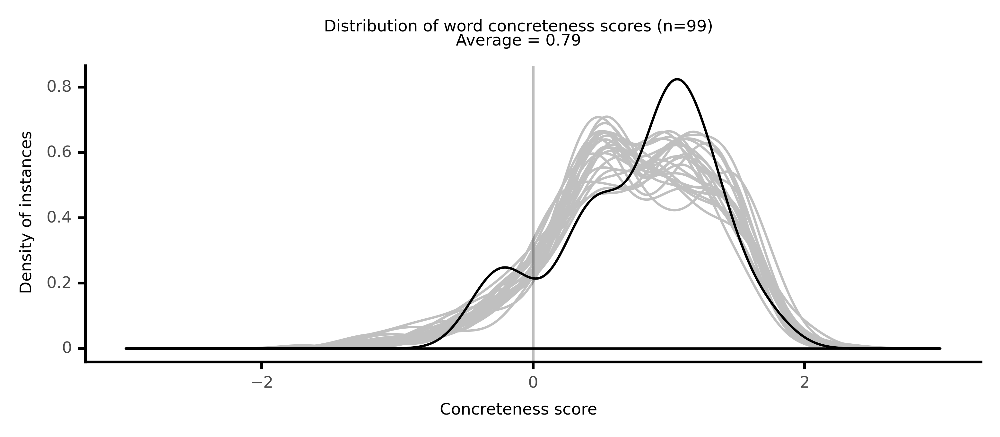

<ggplot: (8786695148481)>

 76%|███████▌  | 19/25 [04:32<01:26, 14.44s/it]

#### #20 most concrete passage: Kesey, _One Flew Over the Cuckoo's Nest_ (1962)

<p>out into the <neither><conc662>wake</conc662></neither>. I <conc><conc886>smelled</conc886></conc> the <neither><conc511>air</conc511></neither> and felt the four <conc><conc973>cans</conc973></conc> of <conc><conc780>beer</conc780></conc> I'ld <neither><conc615>drunk</conc615></neither> shorting out dozens of <abs><conc186>control</conc186></abs> <neither><conc372>leads</conc372></neither> down inside me: all around, the <conc><conc957>chrome</conc957></conc> <neither><conc537>sides</conc537></neither> of the <conc><conc774>swells</conc774></conc> <conc><conc790>flickered</conc790></conc> and <conc><conc737>flashed</conc737></conc> in the <neither><conc640>sun</conc640></neither>. George <neither><conc704>sang</conc704></neither> out for us to look up <neither><conc398>ahead</conc398></neither>, that here come just what we been looking for. I <conc><conc837>leaned</conc837></conc> around to look, but all I saw was a <neither><conc560>big</conc560></neither> <conc><conc759>drifting</conc759></conc> <conc><conc899>log</conc899></conc> and those <neither><conc692>black</conc692></neither> <conc><conc965>seagulls</conc965></conc> <conc><conc845>circling</conc845></conc> and <conc><conc862>diving</conc862></conc> around the <conc><conc899>log</conc899></conc>, Like <neither><conc692>black</conc692></neither> <conc><conc812>leaves</conc812></conc> <neither><conc670>caught</conc670></neither> up in a <conc><conc805>dust</conc805></conc> <neither><conc467>devil</conc467></neither>. George <conc><conc807>sped</conc807></conc> up some, <neither><conc661>heading</conc661></neither> into the place where the <conc><conc765>birds</conc765></conc> <conc><conc928>circled</conc928></conc>, and the <neither><conc439>speed</conc439></neither> of the <conc><conc873>boat</conc873></conc> <conc><conc745>dragged</conc745></conc> my line until I could n't see how you'd be able to tell if you did get a <conc><conc770>bite</conc770></conc>. Those <neither><conc655>fellas</conc655></neither>, those <conc><conc792>cormorants</conc792></conc>, they go after a <neither><conc398>school</conc398></neither> of <conc><conc910>candle</conc910></conc> <conc><conc836>fish</conc836></conc>,'' George told us as he <conc><conc742>drove</conc742></conc>. Little <conc><conc732>white</conc732></conc> <conc><conc836>fish</conc836></conc> the <neither><conc587>size</conc587></neither> of your <conc><conc855>finger</conc855></conc>. You <conc><conc784>dry</conc784></conc> them and they <neither><conc623>burn</conc623></neither> joost Like a <conc><conc910>candle</conc910></conc>. They are <neither><conc495>food</conc495></neither> <conc><conc836>fish</conc836></conc>, <neither><conc578>chum</conc578></neither> <conc><conc836>fish</conc836></conc>. And you <neither><conc642>bet</conc642></neither> where there's a <neither><conc560>big</conc560></neither> <neither><conc398>school</conc398></neither> of them <conc><conc910>candle</conc910></conc> <conc><conc836>fish</conc836></conc> you find the <conc><conc856>silver</conc856></conc> <conc><conc899>salmon</conc899></conc> <neither><conc716>feeding</conc716></neither>.'' He <conc><conc742>drove</conc742></conc> into the <conc><conc765>birds</conc765></conc>, <neither><conc648>missing</conc648></neither> the <conc><conc851>floating</conc851></conc> <conc><conc899>log</conc899></conc>, and <neither><conc609>suddenly</conc609></neither> all around me the <conc><conc831>smooth</conc831></conc> <conc><conc788>slopes</conc788></conc> of <conc><conc957>chrome</conc957></conc> were <neither><conc568>shattered</conc568></neither> by <conc><conc862>diving</conc862></conc> <conc><conc765>birds</conc765></conc> and <conc><conc854>churning</conc854></conc> <conc><conc940>minnows</conc940></conc>, and the <conc><conc921>sleek</conc921></conc> silver-blue <neither><conc656>torpedo</conc656></neither> <conc><conc787>backs</conc787></conc> of the <conc><conc899>salmon</conc899></conc> <conc><conc958>slicing</conc958></conc> through it all. I saw one of the <conc><conc787>backs</conc787></conc> <neither><conc520>check</conc520></neither> its <neither><conc316>direction</conc316></neither> and <neither><conc315>turn</conc315></neither> and <neither><conc418>set</conc418></neither> course for a <conc><conc746>spot</conc746></conc> thirty <conc><conc853>yards</conc853></conc> behind the end of my <conc><conc854>pole</conc854></conc>, where my <conc><conc763>herring</conc763></conc> would be. I <neither><conc698>braced</conc698></neither>, my <neither><conc342>heart</conc342></neither> <neither><conc644>ringing</conc644></neither>, and then felt a <neither><conc613>jolt</conc613></neither> up both <neither><conc481>arms</conc481></neither> as if somebody'd <neither><conc614>hit</conc614></neither> the <conc><conc854>pole</conc854></conc> with a <conc><conc806>ball</conc806></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

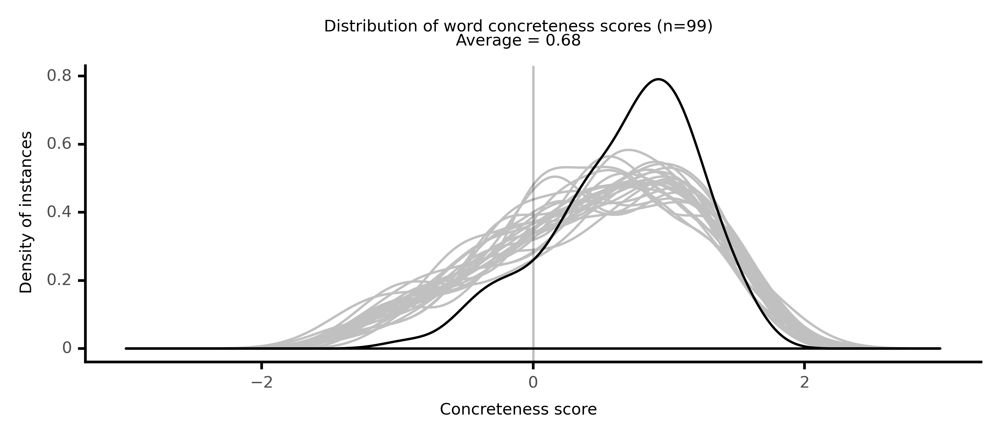

<ggplot: (8786690527573)>

 80%|████████  | 20/25 [04:43<01:07, 13.55s/it]

#### #21 most concrete passage: Delany, _Hogg_ (1995)

<p>and <conc><conc768>blinked</conc768></conc>. She did n't look too worked up to me. Hey-- <conc><conc801>Hawk</conc801></conc> <neither><conc610>looked</conc610></neither> back at Nigg-- I thought you said we could get fifty or sixty <neither><conc516>dollars</conc516></neither> for him...'' <neither><conc560>Big</conc560></neither> Sambo <neither><conc673>stood</conc673></neither> up, <neither><conc669>pushed</conc669></neither> the <conc><conc836>chair</conc836></conc> back, and <neither><conc404>reached</conc404></neither> in his <conc><conc807>pocket</conc807></conc>. <neither><conc665>Lem</conc665></neither> me see, here.'' <conc><conc762>Digging</conc762></conc> around in it made his <conc><conc810>cock</conc810></conc>, still <conc><conc942>hanging</conc942></conc> out his <conc><conc756>fly</conc756></conc>, <neither><conc689>wobble</conc689></neither>. Now what do I got here to give you...?'' He came out with two <conc><conc953>crumpled</conc953></conc> <neither><conc557>bills</conc557></neither>. I'll give you this here fifteen for him.'' Hey, man.'' Nigg <conc><conc811>kicked</conc811></conc> the <conc><conc832>table</conc832></conc> <conc><conc871>leg</conc871></conc> again. You just said twenty-five a <neither><conc705>minute</conc705></neither> <neither><conc437>ago</conc437></neither>.'' Well, I only got fifteen,'' <neither><conc560>Big</conc560></neither> Sambo said. Why am I <neither><conc685>gon</conc685></neither> na <neither><conc328>pay</conc328></neither> twenty <neither><conc516>dollars</conc516></neither> for some <neither><conc701>nigger</conc701></neither> <conc><conc808>kid</conc808></conc>?'' He <conc><conc837>rubbed</conc837></conc> the two <neither><conc557>bills</conc557></neither> together between <conc><conc911>thick</conc911></conc> <conc><conc830>thumb</conc830></conc> and <conc><conc745>stocky</conc745></conc> <conc><conc833>forefinger</conc833></conc>. See here, one of these is a five. I thought I had two tens-- but I ca n't very well give you what I do n't got, now, can I?'' <neither><conc707>Shit</conc707></neither>,'' <conc><conc801>Hawk</conc801></conc> said. I thought you said we could get fifty. Fifteen <conc><conc800>bucks</conc800></conc>? That <neither><conc659>ai</conc659></neither> n't worth the <neither><conc693>fuckin</conc693></neither>' <neither><conc591>trip</conc591></neither>!'' Come on,'' Nigg said. You take the ten. I'll take the five, okay?'' He took the <neither><conc278>money</conc278></neither> from <neither><conc560>Big</conc560></neither> Sambo, <neither><conc610>looked</conc610></neither> at it, then <neither><conc700>handed</conc700></neither> one of the <neither><conc557>bills</conc557></neither>, still <conc><conc953>crumpled</conc953></conc>, to <conc><conc801>Hawk</conc801></conc>. <neither><conc707>Shit</conc707></neither>!'' <conc><conc801>Hawk</conc801></conc> <conc><conc859>snatched</conc859></conc> the bill from Nigg's <neither><conc444>hand</conc444></neither> and <conc><conc831>jammed</conc831></conc> it into his <conc><conc857>hip</conc857></conc> <conc><conc807>pocket</conc807></conc>. I mean, <neither><conc671>goddamn</conc671></neither>!'' Okay,'' Nigg said. Now come on, let's get out of here.'' The bill Nigg had actually kept and was <conc><conc893>shoving</conc893></conc> at his <conc><conc807>pocket</conc807></conc>-- he <neither><conc560>missed</conc560></neither> twice as he went for the <conc><conc842>door</conc842></conc>-- was the ten. <conc><conc778>Shaking</conc778></conc> his <neither><conc651>head</conc651></neither>, <conc><conc801>Hawk</conc801></conc> followed him out and <conc><conc925>pulled</conc925></conc> the <neither><conc597>handle</conc597></neither> to. <neither><conc640>Pretty</conc640></neither> <neither><conc607>loud</conc607></neither>. <neither><conc560>Big</conc560></neither> Sambo <neither><conc673>stood</conc673></neither> up. Come here, girl.'' Honey-Pie got down from the <conc><conc873>counter</conc873></conc>. Her <conc><conc941>dress</conc941></conc> <neither><conc670>caught</conc670></neither> on a <neither><conc682>splinter</conc682></neither> under the <conc><conc850>metal</conc850></conc> <conc><conc793>lip</conc793></conc> of the <conc><conc873>counter</conc873></conc> front. She <neither><conc494>turned</conc494></neither> to <conc><conc969>unfasten</conc969></conc> it, her <conc><conc905>hem</conc905></conc> <conc><conc820>tied</conc820></conc> across the back of her <conc><conc894>legs</conc894></conc>. Her <conc><conc895>toes</conc895></conc> <conc><conc949>curled</conc949></conc> on the <conc><conc893>gritty</conc893></conc> <neither><conc694>boards</conc694></neither> with <neither><conc280>concentration</conc280></neither>. Then the <conc><conc905>hem</conc905></conc> <neither><conc622>fell</conc622></neither> back. With one <neither><conc444>hand</conc444></neither>, <neither><conc560>Big</conc560></neither> Sambo <conc><conc905>fingered</conc905></conc> his <conc><conc883>belt</conc883></conc> free of its <conc><conc848>buckle</conc848></conc> and, with the other, he <conc><conc912>grabbed</conc912></conc> up my <neither><conc444>hand</conc444></neither>. Look a' there!'' <neither><conc560>Big</conc560></neither> Sambo's <conc><conc873>fingers</conc873></conc> were <conc><conc911>thick</conc911></conc> and <neither><conc703>rough</conc703></neither>. See...? He got them half <conc><conc776>moons</conc776></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

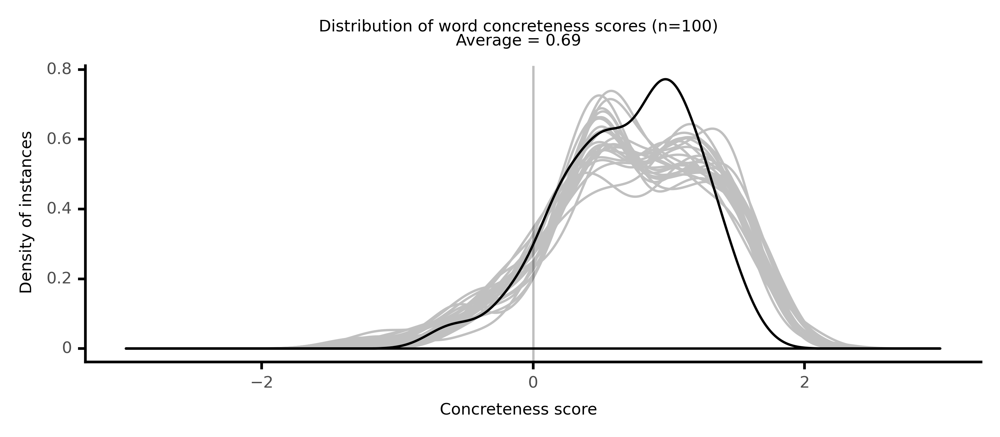

<ggplot: (8786695842837)>

 84%|████████▍ | 21/25 [04:55<00:52, 13.15s/it]

#### #22 most concrete passage: Delany, _Dhalgren_ (1975)

<p><conc><conc812>leaves</conc812></conc> <neither><conc568>shattered</conc568></neither> <conc><conc856>underfoot</conc856></conc>-- it would n't be so <neither><conc574>lonely</conc574></neither>. Here we are.'' <conc><conc972>Wooden</conc972></conc> <conc><conc906>chairs</conc906></conc> with <conc><conc820>coloured</conc820></conc> <conc><conc956>canvas</conc956></conc> <conc><conc966>webbing</conc966></conc> <conc><conc797>sat</conc797></conc> around the <conc><conc974>terrace</conc974></conc>. Beyond the <conc><conc994>balustrade</conc994></conc> the <conc><conc832>rocks</conc832></conc> were <conc><conc773>licked</conc773></conc> over with <conc><conc885>moss</conc885></conc> and <conc><conc923>topped</conc923></conc> by <conc><conc979>birches</conc979></conc>, <conc><conc968>maples</conc968></conc>, and, here and there, <conc><conc911>thick</conc911></conc> <conc><conc872>oaks</conc872></conc>. You <neither><conc697>sit</conc697></neither> down. I'll be right back.'' Kidd <conc><conc797>sat</conc797></conc>-- the <conc><conc836>chair</conc836></conc> was <neither><conc526>lower</conc526></neither> and <neither><conc327>deeper</conc327></neither> than he thought-- and <conc><conc925>pulled</conc925></conc> his <conc><conc802>notebook</conc802></conc> into his <conc><conc977>lap</conc977></conc>. The <conc><conc900>glass</conc900></conc> <conc><conc807>doors</conc807></conc> <conc><conc834>swung</conc834></conc> behind New-boy. Kidd <neither><conc494>turned</conc494></neither>. What are you looking at?'' The November <conc><conc880>garden</conc880></conc>.'' <neither><conc481>Arms</conc481></neither> <conc><conc788>crossed</conc788></conc>, Lanya <conc><conc837>leaned</conc837></conc> on the <conc><conc752>stone</conc752></conc> <conc><conc831>rail</conc831></conc>. You ca n't see the <conc><conc796>plaque</conc796></conc> from here. It's on top of that <conc><conc799>rock</conc799></conc>.'' What's in the... November <conc><conc880>garden</conc880></conc>?'' She <neither><conc535>shrugged</conc535></neither> a nothing.'' The first <neither><conc615>night</conc615></neither> I got here there was a <abs><conc217>party</conc217></abs> going on there: November, October, and December.'' How many <conc><conc794>gardens</conc794></conc> does he have?'' How many months are there?'' What about the <conc><conc880>garden</conc880></conc> we first came through?'' That one,'' she <conc><conc806>glanced</conc806></conc> back, does n't have a name.'' She <neither><conc610>looked</conc610></neither> again at the <conc><conc832>rocks</conc832></conc>. It was a <neither><conc511>marvelous</conc511></neither> <abs><conc217>party</conc217></abs>, with <conc><conc820>coloured</conc820></conc> <conc><conc848>lights</conc848></conc> <conc><conc913>strung</conc913></conc> up. And a <conc><conc759>band</conc759></conc>: <conc><conc840>violins</conc840></conc>, <conc><conc888>flutes</conc888></conc>, and somebody <neither><conc597>playing</conc597></neither> a <conc><conc756>harp</conc756></conc>.'' Where did he get <conc><conc840>violins</conc840></conc> here in Bellona?'' He did. And people with lots and lots of <conc><conc829>gorgeous</conc829></conc> <conc><conc852>clothes</conc852></conc>.'' Kidd was going to say something about Phil. Lanya <neither><conc494>turned</conc494></neither>. If my <conc><conc958>dresses</conc958></conc> are still here, I know exactly where they be.'' Mr. Newboy <neither><conc669>pushed</conc669></neither> through the <conc><conc900>glass</conc900></conc> <conc><conc807>doors</conc807></conc> with a teawagon. <conc><conc904>Urn</conc904></conc> and <conc><conc975>cups</conc975></conc> <conc><conc895>rattled</conc895></conc> twice as the <conc><conc843>tires</conc843></conc> <conc><conc788>crossed</conc788></conc> the <conc><conc979>sill</conc979></conc>. The <neither><conc526>lower</conc526></neither> <conc><conc991>tray</conc991></conc> <neither><conc328>held</conc328></neither> <conc><conc957>dishes</conc957></conc> of <conc><conc974>pastry</conc974></conc>. You <neither><conc670>caught</conc670></neither> Mrs. <neither><conc467>Alt</conc467></neither> right after a day of <conc><conc940>baking</conc940></conc>.'' Hey,'' Kidd said. Those look good.'' Help yourself.'' He <neither><conc715>poured</conc715></neither> <conc><conc975>steaming</conc975></conc> <conc><conc916>coffee</conc916></conc> into <conc><conc922>blue</conc922></conc> <conc><conc952>porcelain</conc952></conc>. <conc><conc800>Sugar</conc800></conc>, <conc><conc965>cream</conc965></conc>?'' Kidd <neither><conc677>shook</conc677></neither> his <neither><conc651>head</conc651></neither>; the <conc><conc905>cup</conc905></conc> <neither><conc615>warmed</conc615></neither> his <conc><conc882>knee</conc882></conc>. He <neither><conc569>bit</conc569></neither>. <conc><conc959>Cookie</conc959></conc> <conc><conc925>crumbs</conc925></conc> <neither><conc622>fell</conc622></neither> and <conc><conc931>rolled</conc931></conc></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

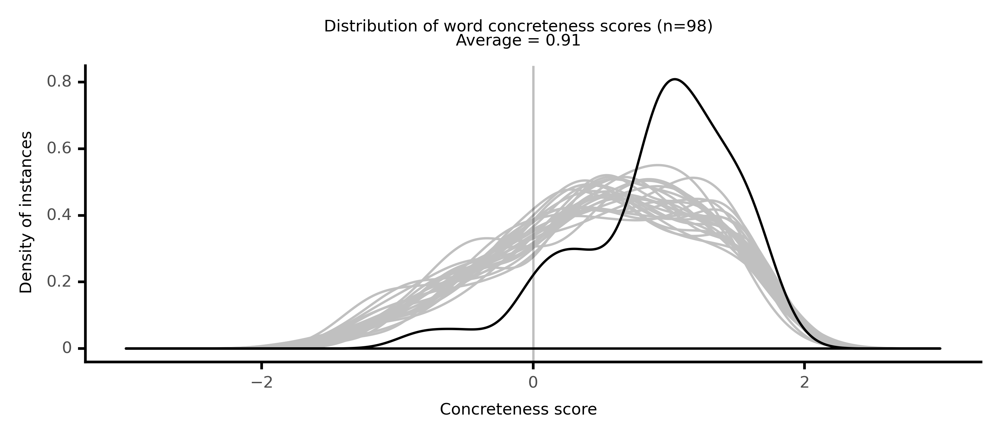

<ggplot: (8786694912229)>

 88%|████████▊ | 22/25 [05:14<00:44, 14.75s/it]

#### #23 most concrete passage: Hemingway, _In Our Time_ (1925)

<p>from him. The <conc><conc880>grasshopper</conc880></conc> <conc><conc955>bottle</conc955></conc> <conc><conc834>swung</conc834></conc> against his <conc><conc882>chest</conc882></conc>. In his <conc><conc922>shirt</conc922></conc> the <conc><conc825>breast</conc825></conc> <neither><conc715>pockets</conc715></neither> <conc><conc920>bulged</conc920></conc> against him with the <conc><conc851>lunch</conc851></conc> and his <conc><conc756>fly</conc756></conc> <neither><conc333>book</conc333></neither>. He <conc><conc814>stepped</conc814></conc> into the <conc><conc735>stream</conc735></conc>. It was a <neither><conc427>shock</conc427></neither>. His <conc><conc879>trousers</conc879></conc> <neither><conc687>clung</conc687></neither> <conc><conc820>tied</conc820></conc> to his <conc><conc894>legs</conc894></conc>. His <conc><conc938>shoes</conc938></conc> felt the <conc><conc966>gravel</conc966></conc>. The <conc><conc773>water</conc773></conc> was a <neither><conc444>rising</conc444></neither> <neither><conc577>cold</conc577></neither> <neither><conc427>shock</conc427></neither>. <neither><conc719>Rushing</conc719></neither>, the <abs><conc182>current</conc182></abs> <conc><conc755>sucked</conc755></conc> against his <conc><conc894>legs</conc894></conc>. Where he <conc><conc814>stepped</conc814></conc> in, the <conc><conc773>water</conc773></conc> was over his <conc><conc863>knees</conc863></conc>. He <conc><conc924>waded</conc924></conc> with the <abs><conc182>current</conc182></abs>. The <conc><conc966>gravel</conc966></conc> <conc><conc948>slid</conc948></conc> under his <conc><conc938>shoes</conc938></conc>. He <neither><conc610>looked</conc610></neither> down at the <conc><conc893>swirl</conc893></conc> of <conc><conc773>water</conc773></conc> below each <conc><conc871>leg</conc871></conc> and <conc><conc889>tipped</conc889></conc> up the <conc><conc955>bottle</conc955></conc> to get a <conc><conc880>grasshopper</conc880></conc>. The first <conc><conc880>grasshopper</conc880></conc> gave a <conc><conc746>jump</conc746></conc> in the <conc><conc917>neck</conc917></conc> of the <conc><conc955>bottle</conc955></conc> and went out into the <conc><conc773>water</conc773></conc>. He was <conc><conc755>sucked</conc755></conc> under in the <neither><conc691>whirl</conc691></neither> by <conc><conc761>Nick</conc761></conc>'s right <conc><conc871>leg</conc871></conc> and came to the <neither><conc663>surface</conc663></neither> a little way down <conc><conc735>stream</conc735></conc>. He <conc><conc825>floated</conc825></conc> <neither><conc435>rapidly</conc435></neither>, <conc><conc813>kicking</conc813></conc>. In a <neither><conc424>quick</conc424></neither> <neither><conc697>circle</conc697></neither>, <neither><conc498>breaking</conc498></neither> the <conc><conc831>smooth</conc831></conc> <neither><conc663>surface</conc663></neither> of the <conc><conc773>water</conc773></conc>, he <neither><conc719>disappeared</conc719></neither>. A <conc><conc879>trout</conc879></conc> had taken him. Another <conc><conc921>hopper</conc921></conc> <conc><conc933>poked</conc933></conc> his <neither><conc392>face</conc392></neither> out of the <conc><conc955>bottle</conc955></conc>. His <conc><conc748>antennae</conc748></conc> <neither><conc499>wavered</conc499></neither>. He was getting his front <conc><conc894>legs</conc894></conc> out of the <conc><conc955>bottle</conc955></conc> to <conc><conc746>jump</conc746></conc>. <conc><conc761>Nick</conc761></conc> took him by the <neither><conc651>head</conc651></neither> and <neither><conc328>held</conc328></neither> him while he <conc><conc956>threaded</conc956></conc> the <conc><conc853>slim</conc853></conc> <conc><conc807>hook</conc807></conc> under his <conc><conc863>chin</conc863></conc>, down through his <conc><conc809>thorax</conc809></conc> and into the last <neither><conc465>segments</conc465></neither> of his <conc><conc868>abdomen</conc868></conc>. The <conc><conc880>grasshopper</conc880></conc> took <neither><conc294>hold</conc294></neither> of the <conc><conc807>hook</conc807></conc> with his front <conc><conc836>feet</conc836></conc>, <conc><conc821>spitting</conc821></conc> <neither><conc665>tobacco</conc665></neither> <conc><conc915>juice</conc915></conc> on it. <conc><conc761>Nick</conc761></conc> <neither><conc710>dropped</conc710></neither> him into the <conc><conc773>water</conc773></conc>. <neither><conc568>Holding</conc568></neither> the <conc><conc881>rod</conc881></conc> in his right <neither><conc444>hand</conc444></neither> he let out line against the <conc><conc749>pull</conc749></conc> of the <conc><conc880>grasshopper</conc880></conc> in the <abs><conc182>current</conc182></abs></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

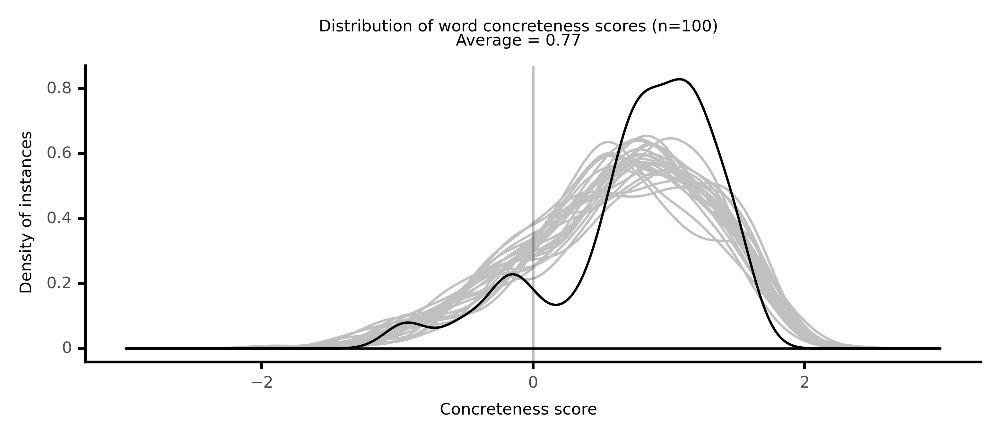

<ggplot: (8786690214653)>

 92%|█████████▏| 23/25 [05:25<00:27, 13.81s/it]

#### #24 most concrete passage: Delany, _Hogg_ (1995)

<p>came out of my <conc><conc832>mouth</conc832></conc>, but his <conc><conc903>hips</conc903></conc> were still going. The <conc><conc911>thick</conc911></conc> <neither><conc651>head</conc651></neither> kept <neither><conc601>butting</conc601></neither> my <conc><conc885>cheek</conc885></conc>, the <conc><conc863>wrinkled</conc863></conc> <conc><conc984>hose</conc984></conc> again <conc><conc942>hanging</conc942></conc> off the end. His work-hardened <conc><conc924>palms</conc924></conc> still <conc><conc775>clamped</conc775></conc> my <neither><conc696>ears</conc696></neither>. The <conc><conc899>hair</conc899></conc> of <conc><conc858>Red</conc858></conc>'s <conc><conc894>legs</conc894></conc> was very <neither><conc439>long</conc439></neither>. I felt around between, got to his <neither><conc672>ass</conc672></neither> where it was all <conc><conc929>pasted</conc929></conc> with <neither><conc707>shit</conc707></neither>, and <conc><conc962>scraped</conc962></conc> as much as I could from his <conc><conc934>matted</conc934></conc> <conc><conc881>buttocks</conc881></conc> and out from the <conc><conc778>seat</conc778></conc> of his <conc><conc923>pants</conc923></conc>. <conc><conc858>Red</conc858></conc> even <conc><conc958>squatted</conc958></conc> a little so I could get some more. <neither><conc701>Nigger</conc701></neither>, you can tell he been down there with <neither><conc560>Big</conc560></neither> Sambo. You know what he <neither><conc489>likes</conc489></neither>...'' Rufus <neither><conc578>chuckled</conc578></neither> now. With one <neither><conc444>hand</conc444></neither>, I <neither><conc328>held</conc328></neither> <conc><conc858>Red</conc858></conc>'s <conc><conc883>belt</conc883></conc>. The other <conc><conc823>loaded</conc823></conc> with <neither><conc635>crap</conc635></neither>, I came out of <conc><conc858>Red</conc858></conc>'s <conc><conc756>fly</conc756></conc> and <conc><conc912>grabbed</conc912></conc> his <conc><conc810>cock</conc810></conc>. <conc><conc858>Red</conc858></conc> <neither><conc646>drawled</conc646></neither>: Oh, yeah...!'' I <conc><conc837>rubbed</conc837></conc> and <conc><conc837>rubbed</conc837></conc> it, back into his <conc><conc899>hair</conc899></conc> and up over the <abs><conc224>lose</conc224></abs>, <neither><conc439>long</conc439></neither> <conc><conc977>nozzle</conc977></conc>, and back down on his <conc><conc927>balls</conc927></conc>, and up again. Then I got his <conc><conc883>belt</conc883></conc> in both <neither><conc498>hands</conc498></neither>; and <neither><conc607>started</conc607></neither> <conc><conc905>licking</conc905></conc> at his <neither><conc646>dick</conc646></neither> Like I was going after the <conc><conc995>drippings</conc995></conc> on a <conc><conc936>sausage</conc936></conc>. Oh, man,'' <conc><conc858>Red</conc858></conc> said. <neither><conc671>Goddamn</conc671></neither>, <neither><conc690>cocksucker</conc690></neither>, you're too <neither><conc693>fuckin</conc693></neither>' much!'' He got the <neither><conc651>head</conc651></neither> in. And went home. This time he <neither><conc706>locked</conc706></neither> his <neither><conc498>hands</conc498></neither> behind my <neither><conc651>head</conc651></neither> and <neither><conc328>held</conc328></neither> me <neither><conc371>close</conc371></neither> while he <conc><conc888>hump</conc888></conc>. <neither><conc701>Nigger</conc701></neither>, he got a <conc><conc832>mouth</conc832></conc> full of my <neither><conc707>shit</conc707></neither>! An' I'm <neither><conc693>fuckin</conc693></neither>' it, you <neither><conc692>black</conc692></neither> <neither><conc612>bastard</conc612></neither>! I'm <neither><conc693>fuckin</conc693></neither>' it!'' I <conc><conc948>slid</conc948></conc> my <neither><conc498>hands</conc498></neither> around to his <conc><conc913>wet</conc913></conc> <conc><conc940>backside</conc940></conc> again. My <conc><conc832>mouth</conc832></conc> <neither><conc629>filled</conc629></neither> up with <neither><conc635>crap</conc635></neither> every time he <neither><conc613>drew</conc613></neither> out. <conc><conc858>Red</conc858></conc> went in, and got it all <conc><conc982>mashed</conc982></conc> around. Rufus, you got to try this-- He <neither><conc560>Big</conc560></neither> Sambo's boy,'' Rufus said, an' you know he Like <neither><conc707>shit</conc707></neither>!'' He worked the <neither><conc649>small</conc649></neither> of my back with his <neither><conc391>broad</conc391></neither>, <neither><conc703>rough</conc703></neither> <conc><conc873>fingers</conc873></conc>. My <neither><conc672>ass</conc672></neither> <neither><conc494>turned</conc494></neither> up Like a <conc><conc946>cat</conc946></conc>'s <conc><conc952>pussy</conc952></conc>. One <conc><conc746>spot</conc746></conc> about five <conc><conc895>inches</conc895></conc> up my <neither><conc673>asshole</conc673></neither>, each time when his <neither><conc646>dick</conc646></neither> <conc><conc837>rubbed</conc837></conc> over it, all I could do was <neither><conc666>squirm</conc666></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

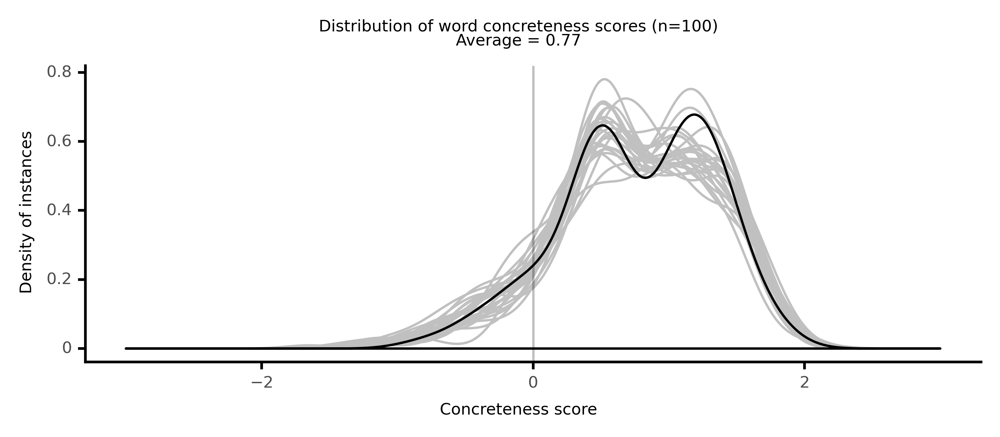

<ggplot: (8786769479833)>

 96%|█████████▌| 24/25 [05:37<00:13, 13.13s/it]

#### #25 most concrete passage: Delany, _Hogg_ (1995)

<p>his <neither><conc481>arms</conc481></neither> and almost <neither><conc622>fell</conc622></neither>. They thought that was <neither><conc640>pretty</conc640></neither> <neither><conc600>funny</conc600></neither> too. Behind the <conc><conc952>bushes</conc952></conc>, a <conc><conc906>pickup</conc906></conc> <conc><conc927>truck</conc927></conc> <conc><conc931>rolled</conc931></conc> in over <conc><conc966>gravel</conc966></conc>, <neither><conc691>stopped</conc691></neither>; its <conc><conc848>lights</conc848></conc> went <conc><conc801>dark</conc801></conc> in the <conc><conc887>foliage</conc887></conc>. The <conc><conc842>door</conc842></conc> <neither><conc698>opened</conc698></neither>, <conc><conc857>slammed</conc857></conc>, and I <neither><conc449>heard</conc449></neither> someone clomp a half a dozen <neither><conc538>steps</conc538></neither> into the <conc><conc933>brush</conc933></conc>: <neither><conc697>urine</conc697></neither> <conc><conc843>chattered</conc843></conc> against <conc><conc812>leaves</conc812></conc>. I <neither><conc673>stood</conc673></neither> still and tried to see into the <conc><conc952>bushes</conc952></conc>-- till a <conc><conc801>dark</conc801></conc> <conc><conc772>trickle</conc772></conc> <neither><conc554>leaked</conc554></neither> out across the <conc><conc895>dirt</conc895></conc>. More <conc><conc933>brush</conc933></conc> got clomped and this <neither><conc560>big</conc560></neither> <neither><conc701>nigger</conc701></neither> came out of the <conc><conc952>bushes</conc952></conc>, <neither><conc610>adjusting</conc610></neither> his <conc><conc954>greens</conc954></conc>. He <conc><conc812>wore</conc812></conc> one of those <neither><conc498>navy</conc498></neither>, <conc><conc936>woolen</conc936></conc> <conc><conc872>shirts</conc872></conc>, the <conc><conc939>sleeves</conc939></conc> <conc><conc931>rolled</conc931></conc> up around his <conc><conc939>forearms</conc939></conc>, and an old <conc><conc937>cap</conc937></conc>. He <conc><conc806>glanced</conc806></conc> at me, then <conc><conc848>walked</conc848></conc> across the <conc><conc849>docks</conc849></conc> to one of the <conc><conc853>boats</conc853></conc>. I <conc><conc958>squatted</conc958></conc> and put my <conc><conc948>palm</conc948></conc> <conc><conc895>flat</conc895></conc> in the <conc><conc772>trickle</conc772></conc>, <conc><conc818>lifted</conc818></conc> it, and <conc><conc773>licked</conc773></conc>. It was <conc><conc904>piss</conc904></conc>; and <conc><conc895>dirt</conc895></conc> too. Still <conc><conc943>squatting</conc943></conc>, I <neither><conc494>turned</conc494></neither> to look at the <conc><conc873>boat</conc873></conc>. The <neither><conc701>nigger</conc701></neither> had <neither><conc691>stopped</conc691></neither>, one <conc><conc821>boot</conc821></conc> on the <conc><conc957>dock</conc957></conc>, one on the <conc><conc940>deck</conc940></conc>. <conc><conc881>Swaying</conc881></conc> as the <conc><conc873>boat</conc873></conc> <neither><conc637>swayed</conc637></neither>, he <conc><conc730>watched</conc730></conc> me. After a few <neither><conc387>moments</conc387></neither>, he put his <neither><conc444>hand</conc444></neither> between his <conc><conc894>legs</conc894></conc>, <neither><conc572>closed</conc572></neither> his <conc><conc873>fingers</conc873></conc> on what was inside his <conc><conc923>pants</conc923></conc>, <conc><conc818>lifted</conc818></conc> it a little, <conc><conc837>rubbed</conc837></conc> some, <conc><conc818>lifted</conc818></conc> it again. I <neither><conc673>stood</conc673></neither> up and <conc><conc848>walked</conc848></conc> on. When I <neither><conc610>looked</conc610></neither> back, though, he was going down inside the <conc><conc938>cabin</conc938></conc>, <conc><conc778>shaking</conc778></conc> his <neither><conc651>head</conc651></neither>. In the <conc><conc849>lighted</conc849></conc> <conc><conc799>screen</conc799></conc> <conc><conc968>window</conc968></conc> of the next <conc><conc938>cabin</conc938></conc>, I saw some people <neither><conc533>moving</conc533></neither>. On the <conc><conc940>deck</conc940></conc> after that, someone was <neither><conc597>playing</conc597></neither> the <conc><conc901>harmonica</conc901></conc>. Across the <conc><conc773>water</conc773></conc>, <conc><conc740>clouds</conc740></conc> <conc><conc925>pulled</conc925></conc> from a <conc><conc983>yellow</conc983></conc> <neither><conc677>moon</conc677></neither> <neither><conc371>close</conc371></neither> to the <neither><conc636>horizon</conc636></neither> and <neither><conc560>big</conc560></neither> as an ashcan <neither><conc660>cover</conc660></neither>. The <conc><conc901>harmonica</conc901></conc> <neither><conc579>player</conc579></neither></p>

<style type="text/css">conc000 {display: inline-block; border: 4px solid dimgray;  }
conc001 {display: inline-block; border: 4px solid dimgray;  }
conc002 {display: inline-block; border: 4px solid dimgray;  }
conc003 {display: inline-block; border: 4px solid dimgray;  }
conc004 {display: inline-block; border: 4px solid dimgray;  }
conc005 {display: inline-block; border: 4px solid dimgray;  }
conc006 {display: inline-block; border: 4px solid dimgray;  }
conc007 {display: inline-block; border: 4px solid dimgray;  }
conc008 {display: inline-block; border: 4px solid dimgray;  }
conc009 {display: inline-block; border: 4px solid dimgray;  }
conc010 {display: inline-block; border: 4px solid dimgray;  }
conc011 {display: inline-block; border: 4px solid dimgray;  }
conc012 {display: inline-block; border: 4px solid dimgray;  }
conc013 {display: inline-block; border: 4px solid dimgray;  }
conc014 {display: inline-block; border: 4px solid dimgray;  }
conc015 {display: inline-block; border: 4px solid dimgray;  }
conc016 {display: inline-block; border: 4px solid dimgray;  }
conc017 {display: inline-block; border: 4px solid dimgray;  }
conc018 {display: inline-block; border: 4px solid dimgray;  }
conc019 {display: inline-block; border: 4px solid dimgray;  }
conc020 {display: inline-block; border: 4px solid dimgray;  }
conc021 {display: inline-block; border: 4px solid dimgray;  }
conc022 {display: inline-block; border: 4px solid dimgray;  }
conc023 {display: inline-block; border: 4px solid dimgray;  }
conc024 {display: inline-block; border: 4px solid dimgray;  }
conc025 {display: inline-block; border: 4px solid dimgray;  }
conc026 {display: inline-block; border: 4px solid dimgray;  }
conc027 {display: inline-block; border: 4px solid dimgray;  }
conc028 {display: inline-block; border: 4px solid dimgray;  }
conc029 {display: inline-block; border: 4px solid dimgray;  }
conc030 {display: inline-block; border: 4px solid dimgray;  }
conc031 {display: inline-block; border: 4px solid dimgray;  }
conc032 {display: inline-block; border: 4px solid dimgray;  }
conc033 {display: inline-block; border: 4px solid dimgray;  }
conc034 {display: inline-block; border: 4px solid dimgray;  }
conc035 {display: inline-block; border: 4px solid dimgray;  }
conc036 {display: inline-block; border: 4px solid dimgray;  }
conc037 {display: inline-block; border: 4px solid dimgray;  }
conc038 {display: inline-block; border: 4px solid dimgray;  }
conc039 {display: inline-block; border: 4px solid dimgray;  }
conc040 {display: inline-block; border: 4px solid dimgray;  }
conc041 {display: inline-block; border: 4px solid dimgray;  }
conc042 {display: inline-block; border: 4px solid dimgray;  }
conc043 {display: inline-block; border: 4px solid dimgray;  }
conc044 {display: inline-block; border: 4px solid dimgray;  }
conc045 {display: inline-block; border: 4px solid dimgray;  }
conc046 {display: inline-block; border: 4px solid dimgray;  }
conc047 {display: inline-block; border: 4px solid dimgray;  }
conc048 {display: inline-block; border: 4px solid dimgray;  }
conc049 {display: inline-block; border: 4px solid dimgray;  }
conc050 {display: inline-block; border: 4px solid dimgray;  }
conc051 {display: inline-block; border: 4px solid dimgray;  }
conc052 {display: inline-block; border: 4px solid dimgray;  }
conc053 {display: inline-block; border: 4px solid dimgray;  }
conc054 {display: inline-block; border: 4px solid dimgray;  }
conc055 {display: inline-block; border: 4px solid dimgray;  }
conc056 {display: inline-block; border: 4px solid dimgray;  }
conc057 {display: inline-block; border: 4px solid dimgray;  }
conc058 {display: inline-block; border: 4px solid dimgray;  }
conc059 {display: inline-block; border: 4px solid dimgray;  }
conc060 {display: inline-block; border: 4px solid dimgray;  }
conc061 {display: inline-block; border: 4px solid dimgray;  }
conc062 {display: inline-block; border: 4px solid dimgray;  }
conc063 {display: inline-block; border: 3px solid dimgray;  }
conc064 {display: inline-block; border: 3px solid dimgray;  }
conc065 {display: inline-block; border: 3px solid dimgray;  }
conc066 {display: inline-block; border: 3px solid dimgray;  }
conc067 {display: inline-block; border: 3px solid dimgray;  }
conc068 {display: inline-block; border: 3px solid dimgray;  }
conc069 {display: inline-block; border: 3px solid dimgray;  }
conc070 {display: inline-block; border: 3px solid dimgray;  }
conc071 {display: inline-block; border: 3px solid dimgray;  }
conc072 {display: inline-block; border: 3px solid dimgray;  }
conc073 {display: inline-block; border: 3px solid dimgray;  }
conc074 {display: inline-block; border: 3px solid dimgray;  }
conc075 {display: inline-block; border: 3px solid dimgray;  }
conc076 {display: inline-block; border: 3px solid dimgray;  }
conc077 {display: inline-block; border: 3px solid dimgray;  }
conc078 {display: inline-block; border: 3px solid dimgray;  }
conc079 {display: inline-block; border: 3px solid dimgray;  }
conc080 {display: inline-block; border: 3px solid dimgray;  }
conc081 {display: inline-block; border: 3px solid dimgray;  }
conc082 {display: inline-block; border: 3px solid dimgray;  }
conc083 {display: inline-block; border: 3px solid dimgray;  }
conc084 {display: inline-block; border: 3px solid dimgray;  }
conc085 {display: inline-block; border: 3px solid dimgray;  }
conc086 {display: inline-block; border: 3px solid dimgray;  }
conc087 {display: inline-block; border: 3px solid dimgray;  }
conc088 {display: inline-block; border: 3px solid dimgray;  }
conc089 {display: inline-block; border: 3px solid dimgray;  }
conc090 {display: inline-block; border: 3px solid dimgray;  }
conc091 {display: inline-block; border: 3px solid dimgray;  }
conc092 {display: inline-block; border: 3px solid dimgray;  }
conc093 {display: inline-block; border: 3px solid dimgray;  }
conc094 {display: inline-block; border: 3px solid dimgray;  }
conc095 {display: inline-block; border: 3px solid dimgray;  }
conc096 {display: inline-block; border: 3px solid dimgray;  }
conc097 {display: inline-block; border: 3px solid dimgray;  }
conc098 {display: inline-block; border: 3px solid dimgray;  }
conc099 {display: inline-block; border: 3px solid dimgray;  }
conc100 {display: inline-block; border: 3px solid dimgray;  }
conc101 {display: inline-block; border: 3px solid dimgray;  }
conc102 {display: inline-block; border: 3px solid dimgray;  }
conc103 {display: inline-block; border: 3px solid dimgray;  }
conc104 {display: inline-block; border: 3px solid dimgray;  }
conc105 {display: inline-block; border: 3px solid dimgray;  }
conc106 {display: inline-block; border: 3px solid dimgray;  }
conc107 {display: inline-block; border: 3px solid dimgray;  }
conc108 {display: inline-block; border: 3px solid dimgray;  }
conc109 {display: inline-block; border: 3px solid dimgray;  }
conc110 {display: inline-block; border: 3px solid dimgray;  }
conc111 {display: inline-block; border: 3px solid dimgray;  }
conc112 {display: inline-block; border: 3px solid dimgray;  }
conc113 {display: inline-block; border: 3px solid dimgray;  }
conc114 {display: inline-block; border: 3px solid dimgray;  }
conc115 {display: inline-block; border: 3px solid dimgray;  }
conc116 {display: inline-block; border: 3px solid dimgray;  }
conc117 {display: inline-block; border: 3px solid dimgray;  }
conc118 {display: inline-block; border: 3px solid dimgray;  }
conc119 {display: inline-block; border: 3px solid dimgray;  }
conc120 {display: inline-block; border: 3px solid dimgray;  }
conc121 {display: inline-block; border: 3px solid dimgray;  }
conc122 {display: inline-block; border: 3px solid dimgray;  }
conc123 {display: inline-block; border: 3px solid dimgray;  }
conc124 {display: inline-block; border: 3px solid dimgray;  }
conc125 {display: inline-block; border: 3px solid dimgray;  }
conc126 {display: inline-block; border: 3px solid dimgray;  }
conc127 {display: inline-block; border: 3px solid dimgray;  }
conc128 {display: inline-block; border: 3px solid dimgray;  }
conc129 {display: inline-block; border: 3px solid dimgray;  }
conc130 {display: inline-block; border: 3px solid dimgray;  }
conc131 {display: inline-block; border: 3px solid dimgray;  }
conc132 {display: inline-block; border: 3px solid dimgray;  }
conc133 {display: inline-block; border: 3px solid dimgray;  }
conc134 {display: inline-block; border: 3px solid dimgray;  }
conc135 {display: inline-block; border: 3px solid dimgray;  }
conc136 {display: inline-block; border: 3px solid dimgray;  }
conc137 {display: inline-block; border: 3px solid dimgray;  }
conc138 {display: inline-block; border: 3px solid dimgray;  }
conc139 {display: inline-block; border: 3px solid dimgray;  }
conc140 {display: inline-block; border: 3px solid dimgray;  }
conc141 {display: inline-block; border: 3px solid dimgray;  }
conc142 {display: inline-block; border: 3px solid dimgray;  }
conc143 {display: inline-block; border: 3px solid dimgray;  }
conc144 {display: inline-block; border: 3px solid dimgray;  }
conc145 {display: inline-block; border: 3px solid dimgray;  }
conc146 {display: inline-block; border: 3px solid dimgray;  }
conc147 {display: inline-block; border: 3px solid dimgray;  }
conc148 {display: inline-block; border: 3px solid dimgray;  }
conc149 {display: inline-block; border: 3px solid dimgray;  }
conc150 {display: inline-block; border: 3px solid dimgray;  }
conc151 {display: inline-block; border: 3px solid dimgray;  }
conc152 {display: inline-block; border: 3px solid dimgray;  }
conc153 {display: inline-block; border: 3px solid dimgray;  }
conc154 {display: inline-block; border: 3px solid dimgray;  }
conc155 {display: inline-block; border: 3px solid dimgray;  }
conc156 {display: inline-block; border: 3px solid dimgray;  }
conc157 {display: inline-block; border: 3px solid dimgray;  }
conc158 {display: inline-block; border: 3px solid dimgray;  }
conc159 {display: inline-block; border: 3px solid dimgray;  }
conc160 {display: inline-block; border: 3px solid dimgray;  }
conc161 {display: inline-block; border: 3px solid dimgray;  }
conc162 {display: inline-block; border: 3px solid dimgray;  }
conc163 {display: inline-block; border: 3px solid dimgray;  }
conc164 {display: inline-block; border: 3px solid dimgray;  }
conc165 {display: inline-block; border: 3px solid dimgray;  }
conc166 {display: inline-block; border: 3px solid dimgray;  }
conc167 {display: inline-block; border: 3px solid dimgray;  }
conc168 {display: inline-block; border: 3px solid dimgray;  }
conc169 {display: inline-block; border: 3px solid dimgray;  }
conc170 {display: inline-block; border: 3px solid dimgray;  }
conc171 {display: inline-block; border: 3px solid dimgray;  }
conc172 {display: inline-block; border: 3px solid dimgray;  }
conc173 {display: inline-block; border: 3px solid dimgray;  }
conc174 {display: inline-block; border: 3px solid dimgray;  }
conc175 {display: inline-block; border: 3px solid dimgray;  }
conc176 {display: inline-block; border: 3px solid dimgray;  }
conc177 {display: inline-block; border: 3px solid dimgray;  }
conc178 {display: inline-block; border: 3px solid dimgray;  }
conc179 {display: inline-block; border: 3px solid dimgray;  }
conc180 {display: inline-block; border: 3px solid dimgray;  }
conc181 {display: inline-block; border: 3px solid dimgray;  }
conc182 {display: inline-block; border: 3px solid dimgray;  }
conc183 {display: inline-block; border: 3px solid dimgray;  }
conc184 {display: inline-block; border: 3px solid dimgray;  }
conc185 {display: inline-block; border: 3px solid dimgray;  }
conc186 {display: inline-block; border: 3px solid dimgray;  }
conc187 {display: inline-block; border: 3px solid dimgray;  }
conc188 {display: inline-block; border: 2px solid dimgray;  }
conc189 {display: inline-block; border: 2px solid dimgray;  }
conc190 {display: inline-block; border: 2px solid dimgray;  }
conc191 {display: inline-block; border: 2px solid dimgray;  }
conc192 {display: inline-block; border: 2px solid dimgray;  }
conc193 {display: inline-block; border: 2px solid dimgray;  }
conc194 {display: inline-block; border: 2px solid dimgray;  }
conc195 {display: inline-block; border: 2px solid dimgray;  }
conc196 {display: inline-block; border: 2px solid dimgray;  }
conc197 {display: inline-block; border: 2px solid dimgray;  }
conc198 {display: inline-block; border: 2px solid dimgray;  }
conc199 {display: inline-block; border: 2px solid dimgray;  }
conc200 {display: inline-block; border: 2px solid dimgray;  }
conc201 {display: inline-block; border: 2px solid dimgray;  }
conc202 {display: inline-block; border: 2px solid dimgray;  }
conc203 {display: inline-block; border: 2px solid dimgray;  }
conc204 {display: inline-block; border: 2px solid dimgray;  }
conc205 {display: inline-block; border: 2px solid dimgray;  }
conc206 {display: inline-block; border: 2px solid dimgray;  }
conc207 {display: inline-block; border: 2px solid dimgray;  }
conc208 {display: inline-block; border: 2px solid dimgray;  }
conc209 {display: inline-block; border: 2px solid dimgray;  }
conc210 {display: inline-block; border: 2px solid dimgray;  }
conc211 {display: inline-block; border: 2px solid dimgray;  }
conc212 {display: inline-block; border: 2px solid dimgray;  }
conc213 {display: inline-block; border: 2px solid dimgray;  }
conc214 {display: inline-block; border: 2px solid dimgray;  }
conc215 {display: inline-block; border: 2px solid dimgray;  }
conc216 {display: inline-block; border: 2px solid dimgray;  }
conc217 {display: inline-block; border: 2px solid dimgray;  }
conc218 {display: inline-block; border: 2px solid dimgray;  }
conc219 {display: inline-block; border: 2px solid dimgray;  }
conc220 {display: inline-block; border: 2px solid dimgray;  }
conc221 {display: inline-block; border: 2px solid dimgray;  }
conc222 {display: inline-block; border: 2px solid dimgray;  }
conc223 {display: inline-block; border: 2px solid dimgray;  }
conc224 {display: inline-block; border: 2px solid dimgray;  }
conc225 {display: inline-block; border: 2px solid dimgray;  }
conc226 {display: inline-block; border: 2px solid dimgray;  }
conc227 {display: inline-block; border: 2px solid dimgray;  }
conc228 {display: inline-block; border: 2px solid dimgray;  }
conc229 {display: inline-block; border: 2px solid dimgray;  }
conc230 {display: inline-block; border: 2px solid dimgray;  }
conc231 {display: inline-block; border: 2px solid dimgray;  }
conc232 {display: inline-block; border: 2px solid dimgray;  }
conc233 {display: inline-block; border: 2px solid dimgray;  }
conc234 {display: inline-block; border: 2px solid dimgray;  }
conc235 {display: inline-block; border: 2px solid dimgray;  }
conc236 {display: inline-block; border: 2px solid dimgray;  }
conc237 {display: inline-block; border: 2px solid dimgray;  }
conc238 {display: inline-block; border: 2px solid dimgray;  }
conc239 {display: inline-block; border: 2px solid dimgray;  }
conc240 {display: inline-block; border: 2px solid dimgray;  }
conc241 {display: inline-block; border: 2px solid dimgray;  }
conc242 {display: inline-block; border: 2px solid dimgray;  }
conc243 {display: inline-block; border: 2px solid dimgray;  }
conc244 {display: inline-block; border: 2px solid dimgray;  }
conc245 {display: inline-block; border: 2px solid dimgray;  }
conc246 {display: inline-block; border: 2px solid dimgray;  }
conc247 {display: inline-block; border: 2px solid dimgray;  }
conc248 {display: inline-block; border: 2px solid dimgray;  }
conc249 {display: inline-block; border: 2px solid dimgray;  }
conc250 {display: inline-block; border: 2px solid dimgray;  }
conc251 {display: inline-block; border: 2px solid dimgray;  }
conc252 {display: inline-block; border: 2px solid dimgray;  }
conc253 {display: inline-block; border: 2px solid dimgray;  }
conc254 {display: inline-block; border: 2px solid dimgray;  }
conc255 {display: inline-block; border: 2px solid dimgray;  }
conc256 {display: inline-block; border: 2px solid dimgray;  }
conc257 {display: inline-block; border: 2px solid dimgray;  }
conc258 {display: inline-block; border: 2px solid dimgray;  }
conc259 {display: inline-block; border: 2px solid dimgray;  }
conc260 {display: inline-block; border: 2px solid dimgray;  }
conc261 {display: inline-block; border: 2px solid dimgray;  }
conc262 {display: inline-block; border: 2px solid dimgray;  }
conc263 {display: inline-block; border: 2px solid dimgray;  }
conc264 {display: inline-block; border: 2px solid dimgray;  }
conc265 {display: inline-block; border: 2px solid dimgray;  }
conc266 {display: inline-block; border: 2px solid dimgray;  }
conc267 {display: inline-block; border: 2px solid dimgray;  }
conc268 {display: inline-block; border: 2px solid dimgray;  }
conc269 {display: inline-block; border: 2px solid dimgray;  }
conc270 {display: inline-block; border: 2px solid dimgray;  }
conc271 {display: inline-block; border: 2px solid dimgray;  }
conc272 {display: inline-block; border: 2px solid dimgray;  }
conc273 {display: inline-block; border: 2px solid dimgray;  }
conc274 {display: inline-block; border: 2px solid dimgray;  }
conc275 {display: inline-block; border: 2px solid dimgray;  }
conc276 {display: inline-block; border: 2px solid dimgray;  }
conc277 {display: inline-block; border: 2px solid dimgray;  }
conc278 {display: inline-block; border: 2px solid dimgray;  }
conc279 {display: inline-block; border: 2px solid dimgray;  }
conc280 {display: inline-block; border: 2px solid dimgray;  }
conc281 {display: inline-block; border: 2px solid dimgray;  }
conc282 {display: inline-block; border: 2px solid dimgray;  }
conc283 {display: inline-block; border: 2px solid dimgray;  }
conc284 {display: inline-block; border: 2px solid dimgray;  }
conc285 {display: inline-block; border: 2px solid dimgray;  }
conc286 {display: inline-block; border: 2px solid dimgray;  }
conc287 {display: inline-block; border: 2px solid dimgray;  }
conc288 {display: inline-block; border: 2px solid dimgray;  }
conc289 {display: inline-block; border: 2px solid dimgray;  }
conc290 {display: inline-block; border: 2px solid dimgray;  }
conc291 {display: inline-block; border: 2px solid dimgray;  }
conc292 {display: inline-block; border: 2px solid dimgray;  }
conc293 {display: inline-block; border: 2px solid dimgray;  }
conc294 {display: inline-block; border: 2px solid dimgray;  }
conc295 {display: inline-block; border: 2px solid dimgray;  }
conc296 {display: inline-block; border: 2px solid dimgray;  }
conc297 {display: inline-block; border: 2px solid dimgray;  }
conc298 {display: inline-block; border: 2px solid dimgray;  }
conc299 {display: inline-block; border: 2px solid dimgray;  }
conc300 {display: inline-block; border: 2px solid dimgray;  }
conc301 {display: inline-block; border: 2px solid dimgray;  }
conc302 {display: inline-block; border: 2px solid dimgray;  }
conc303 {display: inline-block; border: 2px solid dimgray;  }
conc304 {display: inline-block; border: 2px solid dimgray;  }
conc305 {display: inline-block; border: 2px solid dimgray;  }
conc306 {display: inline-block; border: 2px solid dimgray;  }
conc307 {display: inline-block; border: 2px solid dimgray;  }
conc308 {display: inline-block; border: 2px solid dimgray;  }
conc309 {display: inline-block; border: 2px solid dimgray;  }
conc310 {display: inline-block; border: 2px solid dimgray;  }
conc311 {display: inline-block; border: 2px solid dimgray;  }
conc312 {display: inline-block; border: 2px solid dimgray;  }
conc313 {display: inline-block; border: 1px solid dimgray;  }
conc314 {display: inline-block; border: 1px solid dimgray;  }
conc315 {display: inline-block; border: 1px solid dimgray;  }
conc316 {display: inline-block; border: 1px solid dimgray;  }
conc317 {display: inline-block; border: 1px solid dimgray;  }
conc318 {display: inline-block; border: 1px solid dimgray;  }
conc319 {display: inline-block; border: 1px solid dimgray;  }
conc320 {display: inline-block; border: 1px solid dimgray;  }
conc321 {display: inline-block; border: 1px solid dimgray;  }
conc322 {display: inline-block; border: 1px solid dimgray;  }
conc323 {display: inline-block; border: 1px solid dimgray;  }
conc324 {display: inline-block; border: 1px solid dimgray;  }
conc325 {display: inline-block; border: 1px solid dimgray;  }
conc326 {display: inline-block; border: 1px solid dimgray;  }
conc327 {display: inline-block; border: 1px solid dimgray;  }
conc328 {display: inline-block; border: 1px solid dimgray;  }
conc329 {display: inline-block; border: 1px solid dimgray;  }
conc330 {display: inline-block; border: 1px solid dimgray;  }
conc331 {display: inline-block; border: 1px solid dimgray;  }
conc332 {display: inline-block; border: 1px solid dimgray;  }
conc333 {display: inline-block; border: 1px solid dimgray;  }
conc334 {display: inline-block; border: 1px solid dimgray;  }
conc335 {display: inline-block; border: 1px solid dimgray;  }
conc336 {display: inline-block; border: 1px solid dimgray;  }
conc337 {display: inline-block; border: 1px solid dimgray;  }
conc338 {display: inline-block; border: 1px solid dimgray;  }
conc339 {display: inline-block; border: 1px solid dimgray;  }
conc340 {display: inline-block; border: 1px solid dimgray;  }
conc341 {display: inline-block; border: 1px solid dimgray;  }
conc342 {display: inline-block; border: 1px solid dimgray;  }
conc343 {display: inline-block; border: 1px solid dimgray;  }
conc344 {display: inline-block; border: 1px solid dimgray;  }
conc345 {display: inline-block; border: 1px solid dimgray;  }
conc346 {display: inline-block; border: 1px solid dimgray;  }
conc347 {display: inline-block; border: 1px solid dimgray;  }
conc348 {display: inline-block; border: 1px solid dimgray;  }
conc349 {display: inline-block; border: 1px solid dimgray;  }
conc350 {display: inline-block; border: 1px solid dimgray;  }
conc351 {display: inline-block; border: 1px solid dimgray;  }
conc352 {display: inline-block; border: 1px solid dimgray;  }
conc353 {display: inline-block; border: 1px solid dimgray;  }
conc354 {display: inline-block; border: 1px solid dimgray;  }
conc355 {display: inline-block; border: 1px solid dimgray;  }
conc356 {display: inline-block; border: 1px solid dimgray;  }
conc357 {display: inline-block; border: 1px solid dimgray;  }
conc358 {display: inline-block; border: 1px solid dimgray;  }
conc359 {display: inline-block; border: 1px solid dimgray;  }
conc360 {display: inline-block; border: 1px solid dimgray;  }
conc361 {display: inline-block; border: 1px solid dimgray;  }
conc362 {display: inline-block; border: 1px solid dimgray;  }
conc363 {display: inline-block; border: 1px solid dimgray;  }
conc364 {display: inline-block; border: 1px solid dimgray;  }
conc365 {display: inline-block; border: 1px solid dimgray;  }
conc366 {display: inline-block; border: 1px solid dimgray;  }
conc367 {display: inline-block; border: 1px solid dimgray;  }
conc368 {display: inline-block; border: 1px solid dimgray;  }
conc369 {display: inline-block; border: 1px solid dimgray;  }
conc370 {display: inline-block; border: 1px solid dimgray;  }
conc371 {display: inline-block; border: 1px solid dimgray;  }
conc372 {display: inline-block; border: 1px solid dimgray;  }
conc373 {display: inline-block; border: 1px solid dimgray;  }
conc374 {display: inline-block; border: 1px solid dimgray;  }
conc375 {display: inline-block; border: 1px solid dimgray;  }
conc376 {display: inline-block; border: 1px solid dimgray;  }
conc377 {display: inline-block; border: 1px solid dimgray;  }
conc378 {display: inline-block; border: 1px solid dimgray;  }
conc379 {display: inline-block; border: 1px solid dimgray;  }
conc380 {display: inline-block; border: 1px solid dimgray;  }
conc381 {display: inline-block; border: 1px solid dimgray;  }
conc382 {display: inline-block; border: 1px solid dimgray;  }
conc383 {display: inline-block; border: 1px solid dimgray;  }
conc384 {display: inline-block; border: 1px solid dimgray;  }
conc385 {display: inline-block; border: 1px solid dimgray;  }
conc386 {display: inline-block; border: 1px solid dimgray;  }
conc387 {display: inline-block; border: 1px solid dimgray;  }
conc388 {display: inline-block; border: 1px solid dimgray;  }
conc389 {display: inline-block; border: 1px solid dimgray;  }
conc390 {display: inline-block; border: 1px solid dimgray;  }
conc391 {display: inline-block; border: 1px solid dimgray;  }
conc392 {display: inline-block; border: 1px solid dimgray;  }
conc393 {display: inline-block; border: 1px solid dimgray;  }
conc394 {display: inline-block; border: 1px solid dimgray;  }
conc395 {display: inline-block; border: 1px solid dimgray;  }
conc396 {display: inline-block; border: 1px solid dimgray;  }
conc397 {display: inline-block; border: 1px solid dimgray;  }
conc398 {display: inline-block; border: 1px solid dimgray;  }
conc399 {display: inline-block; border: 1px solid dimgray;  }
conc400 {display: inline-block; border: 1px solid dimgray;  }
conc401 {display: inline-block; border: 1px solid dimgray;  }
conc402 {display: inline-block; border: 1px solid dimgray;  }
conc403 {display: inline-block; border: 1px solid dimgray;  }
conc404 {display: inline-block; border: 1px solid dimgray;  }
conc405 {display: inline-block; border: 1px solid dimgray;  }
conc406 {display: inline-block; border: 1px solid dimgray;  }
conc407 {display: inline-block; border: 1px solid dimgray;  }
conc408 {display: inline-block; border: 1px solid dimgray;  }
conc409 {display: inline-block; border: 1px solid dimgray;  }
conc410 {display: inline-block; border: 1px solid dimgray;  }
conc411 {display: inline-block; border: 1px solid dimgray;  }
conc412 {display: inline-block; border: 1px solid dimgray;  }
conc413 {display: inline-block; border: 1px solid dimgray;  }
conc414 {display: inline-block; border: 1px solid dimgray;  }
conc415 {display: inline-block; border: 1px solid dimgray;  }
conc416 {display: inline-block; border: 1px solid dimgray;  }
conc417 {display: inline-block; border: 1px solid dimgray;  }
conc418 {display: inline-block; border: 1px solid dimgray;  }
conc419 {display: inline-block; border: 1px solid dimgray;  }
conc420 {display: inline-block; border: 1px solid dimgray;  }
conc421 {display: inline-block; border: 1px solid dimgray;  }
conc422 {display: inline-block; border: 1px solid dimgray;  }
conc423 {display: inline-block; border: 1px solid dimgray;  }
conc424 {display: inline-block; border: 1px solid dimgray;  }
conc425 {display: inline-block; border: 1px solid dimgray;  }
conc426 {display: inline-block; border: 1px solid dimgray;  }
conc427 {display: inline-block; border: 1px solid dimgray;  }
conc428 {display: inline-block; border: 1px solid dimgray;  }
conc429 {display: inline-block; border: 1px solid dimgray;  }
conc430 {display: inline-block; border: 1px solid dimgray;  }
conc431 {display: inline-block; border: 1px solid dimgray;  }
conc432 {display: inline-block; border: 1px solid dimgray;  }
conc433 {display: inline-block; border: 1px solid dimgray;  }
conc434 {display: inline-block; border: 1px solid dimgray;  }
conc435 {display: inline-block; border: 1px solid dimgray;  }
conc436 {display: inline-block; border: 1px solid dimgray;  }
conc437 {display: inline-block; border: 1px solid dimgray;  }
conc438 {display: inline-block; border: 0px solid dimgray;  }
conc439 {display: inline-block; border: 0px solid dimgray;  }
conc440 {display: inline-block; border: 0px solid dimgray;  }
conc441 {display: inline-block; border: 0px solid dimgray;  }
conc442 {display: inline-block; border: 0px solid dimgray;  }
conc443 {display: inline-block; border: 0px solid dimgray;  }
conc444 {display: inline-block; border: 0px solid dimgray;  }
conc445 {display: inline-block; border: 0px solid dimgray;  }
conc446 {display: inline-block; border: 0px solid dimgray;  }
conc447 {display: inline-block; border: 0px solid dimgray;  }
conc448 {display: inline-block; border: 0px solid dimgray;  }
conc449 {display: inline-block; border: 0px solid dimgray;  }
conc450 {display: inline-block; border: 0px solid dimgray;  }
conc451 {display: inline-block; border: 0px solid dimgray;  }
conc452 {display: inline-block; border: 0px solid dimgray;  }
conc453 {display: inline-block; border: 0px solid dimgray;  }
conc454 {display: inline-block; border: 0px solid dimgray;  }
conc455 {display: inline-block; border: 0px solid dimgray;  }
conc456 {display: inline-block; border: 0px solid dimgray;  }
conc457 {display: inline-block; border: 0px solid dimgray;  }
conc458 {display: inline-block; border: 0px solid dimgray;  }
conc459 {display: inline-block; border: 0px solid dimgray;  }
conc460 {display: inline-block; border: 0px solid dimgray;  }
conc461 {display: inline-block; border: 0px solid dimgray;  }
conc462 {display: inline-block; border: 0px solid dimgray;  }
conc463 {display: inline-block; border: 0px solid dimgray;  }
conc464 {display: inline-block; border: 0px solid dimgray;  }
conc465 {display: inline-block; border: 0px solid dimgray;  }
conc466 {display: inline-block; border: 0px solid dimgray;  }
conc467 {display: inline-block; border: 0px solid dimgray;  }
conc468 {display: inline-block; border: 0px solid dimgray;  }
conc469 {display: inline-block; border: 0px solid dimgray;  }
conc470 {display: inline-block; border: 0px solid dimgray;  }
conc471 {display: inline-block; border: 0px solid dimgray;  }
conc472 {display: inline-block; border: 0px solid dimgray;  }
conc473 {display: inline-block; border: 0px solid dimgray;  }
conc474 {display: inline-block; border: 0px solid dimgray;  }
conc475 {display: inline-block; border: 0px solid dimgray;  }
conc476 {display: inline-block; border: 0px solid dimgray;  }
conc477 {display: inline-block; border: 0px solid dimgray;  }
conc478 {display: inline-block; border: 0px solid dimgray;  }
conc479 {display: inline-block; border: 0px solid dimgray;  }
conc480 {display: inline-block; border: 0px solid dimgray;  }
conc481 {display: inline-block; border: 0px solid dimgray;  }
conc482 {display: inline-block; border: 0px solid dimgray;  }
conc483 {display: inline-block; border: 0px solid dimgray;  }
conc484 {display: inline-block; border: 0px solid dimgray;  }
conc485 {display: inline-block; border: 0px solid dimgray;  }
conc486 {display: inline-block; border: 0px solid dimgray;  }
conc487 {display: inline-block; border: 0px solid dimgray;  }
conc488 {display: inline-block; border: 0px solid dimgray;  }
conc489 {display: inline-block; border: 0px solid dimgray;  }
conc490 {display: inline-block; border: 0px solid dimgray;  }
conc491 {display: inline-block; border: 0px solid dimgray;  }
conc492 {display: inline-block; border: 0px solid dimgray;  }
conc493 {display: inline-block; border: 0px solid dimgray;  }
conc494 {display: inline-block; border: 0px solid dimgray;  }
conc495 {display: inline-block; border: 0px solid dimgray;  }
conc496 {display: inline-block; border: 0px solid dimgray;  }
conc497 {display: inline-block; border: 0px solid dimgray;  }
conc498 {display: inline-block; border: 0px solid dimgray;  }
conc499 {display: inline-block; border: 0px solid dimgray;  }
conc500 {display: inline-block; font-weight: 1 }
conc501 {display: inline-block; font-weight: 3 }
conc502 {display: inline-block; font-weight: 5 }
conc503 {display: inline-block; font-weight: 7 }
conc504 {display: inline-block; font-weight: 9 }
conc505 {display: inline-block; font-weight: 11 }
conc506 {display: inline-block; font-weight: 13 }
conc507 {display: inline-block; font-weight: 15 }
conc508 {display: inline-block; font-weight: 17 }
conc509 {display: inline-block; font-weight: 19 }
conc510 {display: inline-block; font-weight: 21 }
conc511 {display: inline-block; font-weight: 23 }
conc512 {display: inline-block; font-weight: 25 }
conc513 {display: inline-block; font-weight: 27 }
conc514 {display: inline-block; font-weight: 29 }
conc515 {display: inline-block; font-weight: 31 }
conc516 {display: inline-block; font-weight: 33 }
conc517 {display: inline-block; font-weight: 35 }
conc518 {display: inline-block; font-weight: 37 }
conc519 {display: inline-block; font-weight: 39 }
conc520 {display: inline-block; font-weight: 41 }
conc521 {display: inline-block; font-weight: 43 }
conc522 {display: inline-block; font-weight: 45 }
conc523 {display: inline-block; font-weight: 47 }
conc524 {display: inline-block; font-weight: 49 }
conc525 {display: inline-block; font-weight: 51 }
conc526 {display: inline-block; font-weight: 53 }
conc527 {display: inline-block; font-weight: 55 }
conc528 {display: inline-block; font-weight: 57 }
conc529 {display: inline-block; font-weight: 59 }
conc530 {display: inline-block; font-weight: 61 }
conc531 {display: inline-block; font-weight: 63 }
conc532 {display: inline-block; font-weight: 65 }
conc533 {display: inline-block; font-weight: 67 }
conc534 {display: inline-block; font-weight: 69 }
conc535 {display: inline-block; font-weight: 71 }
conc536 {display: inline-block; font-weight: 73 }
conc537 {display: inline-block; font-weight: 75 }
conc538 {display: inline-block; font-weight: 77 }
conc539 {display: inline-block; font-weight: 79 }
conc540 {display: inline-block; font-weight: 81 }
conc541 {display: inline-block; font-weight: 83 }
conc542 {display: inline-block; font-weight: 85 }
conc543 {display: inline-block; font-weight: 87 }
conc544 {display: inline-block; font-weight: 89 }
conc545 {display: inline-block; font-weight: 91 }
conc546 {display: inline-block; font-weight: 93 }
conc547 {display: inline-block; font-weight: 95 }
conc548 {display: inline-block; font-weight: 97 }
conc549 {display: inline-block; font-weight: 99 }
conc550 {display: inline-block; font-weight: 101 }
conc551 {display: inline-block; font-weight: 103 }
conc552 {display: inline-block; font-weight: 105 }
conc553 {display: inline-block; font-weight: 107 }
conc554 {display: inline-block; font-weight: 109 }
conc555 {display: inline-block; font-weight: 111 }
conc556 {display: inline-block; font-weight: 113 }
conc557 {display: inline-block; font-weight: 115 }
conc558 {display: inline-block; font-weight: 117 }
conc559 {display: inline-block; font-weight: 119 }
conc560 {display: inline-block; font-weight: 121 }
conc561 {display: inline-block; font-weight: 123 }
conc562 {display: inline-block; font-weight: 125 }
conc563 {display: inline-block; font-weight: 127 }
conc564 {display: inline-block; font-weight: 129 }
conc565 {display: inline-block; font-weight: 131 }
conc566 {display: inline-block; font-weight: 133 }
conc567 {display: inline-block; font-weight: 135 }
conc568 {display: inline-block; font-weight: 137 }
conc569 {display: inline-block; font-weight: 139 }
conc570 {display: inline-block; font-weight: 141 }
conc571 {display: inline-block; font-weight: 143 }
conc572 {display: inline-block; font-weight: 145 }
conc573 {display: inline-block; font-weight: 147 }
conc574 {display: inline-block; font-weight: 149 }
conc575 {display: inline-block; font-weight: 151 }
conc576 {display: inline-block; font-weight: 153 }
conc577 {display: inline-block; font-weight: 155 }
conc578 {display: inline-block; font-weight: 157 }
conc579 {display: inline-block; font-weight: 159 }
conc580 {display: inline-block; font-weight: 161 }
conc581 {display: inline-block; font-weight: 163 }
conc582 {display: inline-block; font-weight: 165 }
conc583 {display: inline-block; font-weight: 167 }
conc584 {display: inline-block; font-weight: 169 }
conc585 {display: inline-block; font-weight: 171 }
conc586 {display: inline-block; font-weight: 173 }
conc587 {display: inline-block; font-weight: 175 }
conc588 {display: inline-block; font-weight: 177 }
conc589 {display: inline-block; font-weight: 179 }
conc590 {display: inline-block; font-weight: 181 }
conc591 {display: inline-block; font-weight: 183 }
conc592 {display: inline-block; font-weight: 185 }
conc593 {display: inline-block; font-weight: 187 }
conc594 {display: inline-block; font-weight: 189 }
conc595 {display: inline-block; font-weight: 191 }
conc596 {display: inline-block; font-weight: 193 }
conc597 {display: inline-block; font-weight: 195 }
conc598 {display: inline-block; font-weight: 197 }
conc599 {display: inline-block; font-weight: 199 }
conc600 {display: inline-block; font-weight: 201 }
conc601 {display: inline-block; font-weight: 203 }
conc602 {display: inline-block; font-weight: 205 }
conc603 {display: inline-block; font-weight: 207 }
conc604 {display: inline-block; font-weight: 209 }
conc605 {display: inline-block; font-weight: 211 }
conc606 {display: inline-block; font-weight: 213 }
conc607 {display: inline-block; font-weight: 215 }
conc608 {display: inline-block; font-weight: 217 }
conc609 {display: inline-block; font-weight: 219 }
conc610 {display: inline-block; font-weight: 221 }
conc611 {display: inline-block; font-weight: 223 }
conc612 {display: inline-block; font-weight: 225 }
conc613 {display: inline-block; font-weight: 227 }
conc614 {display: inline-block; font-weight: 229 }
conc615 {display: inline-block; font-weight: 231 }
conc616 {display: inline-block; font-weight: 233 }
conc617 {display: inline-block; font-weight: 235 }
conc618 {display: inline-block; font-weight: 237 }
conc619 {display: inline-block; font-weight: 239 }
conc620 {display: inline-block; font-weight: 241 }
conc621 {display: inline-block; font-weight: 243 }
conc622 {display: inline-block; font-weight: 245 }
conc623 {display: inline-block; font-weight: 247 }
conc624 {display: inline-block; font-weight: 249 }
conc625 {display: inline-block; font-weight: 251 }
conc626 {display: inline-block; font-weight: 253 }
conc627 {display: inline-block; font-weight: 255 }
conc628 {display: inline-block; font-weight: 257 }
conc629 {display: inline-block; font-weight: 259 }
conc630 {display: inline-block; font-weight: 261 }
conc631 {display: inline-block; font-weight: 263 }
conc632 {display: inline-block; font-weight: 265 }
conc633 {display: inline-block; font-weight: 267 }
conc634 {display: inline-block; font-weight: 269 }
conc635 {display: inline-block; font-weight: 271 }
conc636 {display: inline-block; font-weight: 273 }
conc637 {display: inline-block; font-weight: 275 }
conc638 {display: inline-block; font-weight: 277 }
conc639 {display: inline-block; font-weight: 279 }
conc640 {display: inline-block; font-weight: 281 }
conc641 {display: inline-block; font-weight: 283 }
conc642 {display: inline-block; font-weight: 285 }
conc643 {display: inline-block; font-weight: 287 }
conc644 {display: inline-block; font-weight: 289 }
conc645 {display: inline-block; font-weight: 291 }
conc646 {display: inline-block; font-weight: 293 }
conc647 {display: inline-block; font-weight: 295 }
conc648 {display: inline-block; font-weight: 297 }
conc649 {display: inline-block; font-weight: 299 }
conc650 {display: inline-block; font-weight: 301 }
conc651 {display: inline-block; font-weight: 303 }
conc652 {display: inline-block; font-weight: 305 }
conc653 {display: inline-block; font-weight: 307 }
conc654 {display: inline-block; font-weight: 309 }
conc655 {display: inline-block; font-weight: 311 }
conc656 {display: inline-block; font-weight: 313 }
conc657 {display: inline-block; font-weight: 315 }
conc658 {display: inline-block; font-weight: 317 }
conc659 {display: inline-block; font-weight: 319 }
conc660 {display: inline-block; font-weight: 321 }
conc661 {display: inline-block; font-weight: 323 }
conc662 {display: inline-block; font-weight: 325 }
conc663 {display: inline-block; font-weight: 327 }
conc664 {display: inline-block; font-weight: 329 }
conc665 {display: inline-block; font-weight: 331 }
conc666 {display: inline-block; font-weight: 333 }
conc667 {display: inline-block; font-weight: 335 }
conc668 {display: inline-block; font-weight: 337 }
conc669 {display: inline-block; font-weight: 339 }
conc670 {display: inline-block; font-weight: 341 }
conc671 {display: inline-block; font-weight: 343 }
conc672 {display: inline-block; font-weight: 345 }
conc673 {display: inline-block; font-weight: 347 }
conc674 {display: inline-block; font-weight: 349 }
conc675 {display: inline-block; font-weight: 351 }
conc676 {display: inline-block; font-weight: 353 }
conc677 {display: inline-block; font-weight: 355 }
conc678 {display: inline-block; font-weight: 357 }
conc679 {display: inline-block; font-weight: 359 }
conc680 {display: inline-block; font-weight: 361 }
conc681 {display: inline-block; font-weight: 363 }
conc682 {display: inline-block; font-weight: 365 }
conc683 {display: inline-block; font-weight: 367 }
conc684 {display: inline-block; font-weight: 369 }
conc685 {display: inline-block; font-weight: 371 }
conc686 {display: inline-block; font-weight: 373 }
conc687 {display: inline-block; font-weight: 375 }
conc688 {display: inline-block; font-weight: 377 }
conc689 {display: inline-block; font-weight: 379 }
conc690 {display: inline-block; font-weight: 381 }
conc691 {display: inline-block; font-weight: 383 }
conc692 {display: inline-block; font-weight: 385 }
conc693 {display: inline-block; font-weight: 387 }
conc694 {display: inline-block; font-weight: 389 }
conc695 {display: inline-block; font-weight: 391 }
conc696 {display: inline-block; font-weight: 393 }
conc697 {display: inline-block; font-weight: 395 }
conc698 {display: inline-block; font-weight: 397 }
conc699 {display: inline-block; font-weight: 399 }
conc700 {display: inline-block; font-weight: 401 }
conc701 {display: inline-block; font-weight: 403 }
conc702 {display: inline-block; font-weight: 405 }
conc703 {display: inline-block; font-weight: 407 }
conc704 {display: inline-block; font-weight: 409 }
conc705 {display: inline-block; font-weight: 411 }
conc706 {display: inline-block; font-weight: 413 }
conc707 {display: inline-block; font-weight: 415 }
conc708 {display: inline-block; font-weight: 417 }
conc709 {display: inline-block; font-weight: 419 }
conc710 {display: inline-block; font-weight: 421 }
conc711 {display: inline-block; font-weight: 423 }
conc712 {display: inline-block; font-weight: 425 }
conc713 {display: inline-block; font-weight: 427 }
conc714 {display: inline-block; font-weight: 429 }
conc715 {display: inline-block; font-weight: 431 }
conc716 {display: inline-block; font-weight: 433 }
conc717 {display: inline-block; font-weight: 435 }
conc718 {display: inline-block; font-weight: 437 }
conc719 {display: inline-block; font-weight: 439 }
conc720 {display: inline-block; font-weight: 441 }
conc721 {display: inline-block; font-weight: 443 }
conc722 {display: inline-block; font-weight: 445 }
conc723 {display: inline-block; font-weight: 447 }
conc724 {display: inline-block; font-weight: 449 }
conc725 {display: inline-block; font-weight: 451 }
conc726 {display: inline-block; font-weight: 453 }
conc727 {display: inline-block; font-weight: 455 }
conc728 {display: inline-block; font-weight: 457 }
conc729 {display: inline-block; font-weight: 459 }
conc730 {display: inline-block; font-weight: 461 }
conc731 {display: inline-block; font-weight: 463 }
conc732 {display: inline-block; font-weight: 465 }
conc733 {display: inline-block; font-weight: 467 }
conc734 {display: inline-block; font-weight: 469 }
conc735 {display: inline-block; font-weight: 471 }
conc736 {display: inline-block; font-weight: 473 }
conc737 {display: inline-block; font-weight: 475 }
conc738 {display: inline-block; font-weight: 477 }
conc739 {display: inline-block; font-weight: 479 }
conc740 {display: inline-block; font-weight: 481 }
conc741 {display: inline-block; font-weight: 483 }
conc742 {display: inline-block; font-weight: 485 }
conc743 {display: inline-block; font-weight: 487 }
conc744 {display: inline-block; font-weight: 489 }
conc745 {display: inline-block; font-weight: 491 }
conc746 {display: inline-block; font-weight: 493 }
conc747 {display: inline-block; font-weight: 495 }
conc748 {display: inline-block; font-weight: 497 }
conc749 {display: inline-block; font-weight: 499 }
conc750 {display: inline-block; font-weight: 501 }
conc751 {display: inline-block; font-weight: 503 }
conc752 {display: inline-block; font-weight: 505 }
conc753 {display: inline-block; font-weight: 507 }
conc754 {display: inline-block; font-weight: 509 }
conc755 {display: inline-block; font-weight: 511 }
conc756 {display: inline-block; font-weight: 513 }
conc757 {display: inline-block; font-weight: 515 }
conc758 {display: inline-block; font-weight: 517 }
conc759 {display: inline-block; font-weight: 519 }
conc760 {display: inline-block; font-weight: 521 }
conc761 {display: inline-block; font-weight: 523 }
conc762 {display: inline-block; font-weight: 525 }
conc763 {display: inline-block; font-weight: 527 }
conc764 {display: inline-block; font-weight: 529 }
conc765 {display: inline-block; font-weight: 531 }
conc766 {display: inline-block; font-weight: 533 }
conc767 {display: inline-block; font-weight: 535 }
conc768 {display: inline-block; font-weight: 537 }
conc769 {display: inline-block; font-weight: 539 }
conc770 {display: inline-block; font-weight: 541 }
conc771 {display: inline-block; font-weight: 543 }
conc772 {display: inline-block; font-weight: 545 }
conc773 {display: inline-block; font-weight: 547 }
conc774 {display: inline-block; font-weight: 549 }
conc775 {display: inline-block; font-weight: 551 }
conc776 {display: inline-block; font-weight: 553 }
conc777 {display: inline-block; font-weight: 555 }
conc778 {display: inline-block; font-weight: 557 }
conc779 {display: inline-block; font-weight: 559 }
conc780 {display: inline-block; font-weight: 561 }
conc781 {display: inline-block; font-weight: 563 }
conc782 {display: inline-block; font-weight: 565 }
conc783 {display: inline-block; font-weight: 567 }
conc784 {display: inline-block; font-weight: 569 }
conc785 {display: inline-block; font-weight: 571 }
conc786 {display: inline-block; font-weight: 573 }
conc787 {display: inline-block; font-weight: 575 }
conc788 {display: inline-block; font-weight: 577 }
conc789 {display: inline-block; font-weight: 579 }
conc790 {display: inline-block; font-weight: 581 }
conc791 {display: inline-block; font-weight: 583 }
conc792 {display: inline-block; font-weight: 585 }
conc793 {display: inline-block; font-weight: 587 }
conc794 {display: inline-block; font-weight: 589 }
conc795 {display: inline-block; font-weight: 591 }
conc796 {display: inline-block; font-weight: 593 }
conc797 {display: inline-block; font-weight: 595 }
conc798 {display: inline-block; font-weight: 597 }
conc799 {display: inline-block; font-weight: 599 }
conc800 {display: inline-block; font-weight: 601 }
conc801 {display: inline-block; font-weight: 603 }
conc802 {display: inline-block; font-weight: 605 }
conc803 {display: inline-block; font-weight: 607 }
conc804 {display: inline-block; font-weight: 609 }
conc805 {display: inline-block; font-weight: 611 }
conc806 {display: inline-block; font-weight: 613 }
conc807 {display: inline-block; font-weight: 615 }
conc808 {display: inline-block; font-weight: 617 }
conc809 {display: inline-block; font-weight: 619 }
conc810 {display: inline-block; font-weight: 621 }
conc811 {display: inline-block; font-weight: 623 }
conc812 {display: inline-block; font-weight: 625 }
conc813 {display: inline-block; font-weight: 627 }
conc814 {display: inline-block; font-weight: 629 }
conc815 {display: inline-block; font-weight: 631 }
conc816 {display: inline-block; font-weight: 633 }
conc817 {display: inline-block; font-weight: 635 }
conc818 {display: inline-block; font-weight: 637 }
conc819 {display: inline-block; font-weight: 639 }
conc820 {display: inline-block; font-weight: 641 }
conc821 {display: inline-block; font-weight: 643 }
conc822 {display: inline-block; font-weight: 645 }
conc823 {display: inline-block; font-weight: 647 }
conc824 {display: inline-block; font-weight: 649 }
conc825 {display: inline-block; font-weight: 651 }
conc826 {display: inline-block; font-weight: 653 }
conc827 {display: inline-block; font-weight: 655 }
conc828 {display: inline-block; font-weight: 657 }
conc829 {display: inline-block; font-weight: 659 }
conc830 {display: inline-block; font-weight: 661 }
conc831 {display: inline-block; font-weight: 663 }
conc832 {display: inline-block; font-weight: 665 }
conc833 {display: inline-block; font-weight: 667 }
conc834 {display: inline-block; font-weight: 669 }
conc835 {display: inline-block; font-weight: 671 }
conc836 {display: inline-block; font-weight: 673 }
conc837 {display: inline-block; font-weight: 675 }
conc838 {display: inline-block; font-weight: 677 }
conc839 {display: inline-block; font-weight: 679 }
conc840 {display: inline-block; font-weight: 681 }
conc841 {display: inline-block; font-weight: 683 }
conc842 {display: inline-block; font-weight: 685 }
conc843 {display: inline-block; font-weight: 687 }
conc844 {display: inline-block; font-weight: 689 }
conc845 {display: inline-block; font-weight: 691 }
conc846 {display: inline-block; font-weight: 693 }
conc847 {display: inline-block; font-weight: 695 }
conc848 {display: inline-block; font-weight: 697 }
conc849 {display: inline-block; font-weight: 699 }
conc850 {display: inline-block; font-weight: 701 }
conc851 {display: inline-block; font-weight: 703 }
conc852 {display: inline-block; font-weight: 705 }
conc853 {display: inline-block; font-weight: 707 }
conc854 {display: inline-block; font-weight: 709 }
conc855 {display: inline-block; font-weight: 711 }
conc856 {display: inline-block; font-weight: 713 }
conc857 {display: inline-block; font-weight: 715 }
conc858 {display: inline-block; font-weight: 717 }
conc859 {display: inline-block; font-weight: 719 }
conc860 {display: inline-block; font-weight: 721 }
conc861 {display: inline-block; font-weight: 723 }
conc862 {display: inline-block; font-weight: 725 }
conc863 {display: inline-block; font-weight: 727 }
conc864 {display: inline-block; font-weight: 729 }
conc865 {display: inline-block; font-weight: 731 }
conc866 {display: inline-block; font-weight: 733 }
conc867 {display: inline-block; font-weight: 735 }
conc868 {display: inline-block; font-weight: 737 }
conc869 {display: inline-block; font-weight: 739 }
conc870 {display: inline-block; font-weight: 741 }
conc871 {display: inline-block; font-weight: 743 }
conc872 {display: inline-block; font-weight: 745 }
conc873 {display: inline-block; font-weight: 747 }
conc874 {display: inline-block; font-weight: 749 }
conc875 {display: inline-block; font-weight: 751 }
conc876 {display: inline-block; font-weight: 753 }
conc877 {display: inline-block; font-weight: 755 }
conc878 {display: inline-block; font-weight: 757 }
conc879 {display: inline-block; font-weight: 759 }
conc880 {display: inline-block; font-weight: 761 }
conc881 {display: inline-block; font-weight: 763 }
conc882 {display: inline-block; font-weight: 765 }
conc883 {display: inline-block; font-weight: 767 }
conc884 {display: inline-block; font-weight: 769 }
conc885 {display: inline-block; font-weight: 771 }
conc886 {display: inline-block; font-weight: 773 }
conc887 {display: inline-block; font-weight: 775 }
conc888 {display: inline-block; font-weight: 777 }
conc889 {display: inline-block; font-weight: 779 }
conc890 {display: inline-block; font-weight: 781 }
conc891 {display: inline-block; font-weight: 783 }
conc892 {display: inline-block; font-weight: 785 }
conc893 {display: inline-block; font-weight: 787 }
conc894 {display: inline-block; font-weight: 789 }
conc895 {display: inline-block; font-weight: 791 }
conc896 {display: inline-block; font-weight: 793 }
conc897 {display: inline-block; font-weight: 795 }
conc898 {display: inline-block; font-weight: 797 }
conc899 {display: inline-block; font-weight: 799 }
conc900 {display: inline-block; font-weight: 801 }
conc901 {display: inline-block; font-weight: 803 }
conc902 {display: inline-block; font-weight: 805 }
conc903 {display: inline-block; font-weight: 807 }
conc904 {display: inline-block; font-weight: 809 }
conc905 {display: inline-block; font-weight: 811 }
conc906 {display: inline-block; font-weight: 813 }
conc907 {display: inline-block; font-weight: 815 }
conc908 {display: inline-block; font-weight: 817 }
conc909 {display: inline-block; font-weight: 819 }
conc910 {display: inline-block; font-weight: 821 }
conc911 {display: inline-block; font-weight: 823 }
conc912 {display: inline-block; font-weight: 825 }
conc913 {display: inline-block; font-weight: 827 }
conc914 {display: inline-block; font-weight: 829 }
conc915 {display: inline-block; font-weight: 831 }
conc916 {display: inline-block; font-weight: 833 }
conc917 {display: inline-block; font-weight: 835 }
conc918 {display: inline-block; font-weight: 837 }
conc919 {display: inline-block; font-weight: 839 }
conc920 {display: inline-block; font-weight: 841 }
conc921 {display: inline-block; font-weight: 843 }
conc922 {display: inline-block; font-weight: 845 }
conc923 {display: inline-block; font-weight: 847 }
conc924 {display: inline-block; font-weight: 849 }
conc925 {display: inline-block; font-weight: 851 }
conc926 {display: inline-block; font-weight: 853 }
conc927 {display: inline-block; font-weight: 855 }
conc928 {display: inline-block; font-weight: 857 }
conc929 {display: inline-block; font-weight: 859 }
conc930 {display: inline-block; font-weight: 861 }
conc931 {display: inline-block; font-weight: 863 }
conc932 {display: inline-block; font-weight: 865 }
conc933 {display: inline-block; font-weight: 867 }
conc934 {display: inline-block; font-weight: 869 }
conc935 {display: inline-block; font-weight: 871 }
conc936 {display: inline-block; font-weight: 873 }
conc937 {display: inline-block; font-weight: 875 }
conc938 {display: inline-block; font-weight: 877 }
conc939 {display: inline-block; font-weight: 879 }
conc940 {display: inline-block; font-weight: 881 }
conc941 {display: inline-block; font-weight: 883 }
conc942 {display: inline-block; font-weight: 885 }
conc943 {display: inline-block; font-weight: 887 }
conc944 {display: inline-block; font-weight: 889 }
conc945 {display: inline-block; font-weight: 891 }
conc946 {display: inline-block; font-weight: 893 }
conc947 {display: inline-block; font-weight: 895 }
conc948 {display: inline-block; font-weight: 897 }
conc949 {display: inline-block; font-weight: 899 }
conc950 {display: inline-block; font-weight: 901 }
conc951 {display: inline-block; font-weight: 903 }
conc952 {display: inline-block; font-weight: 905 }
conc953 {display: inline-block; font-weight: 907 }
conc954 {display: inline-block; font-weight: 909 }
conc955 {display: inline-block; font-weight: 911 }
conc956 {display: inline-block; font-weight: 913 }
conc957 {display: inline-block; font-weight: 915 }
conc958 {display: inline-block; font-weight: 917 }
conc959 {display: inline-block; font-weight: 919 }
conc960 {display: inline-block; font-weight: 921 }
conc961 {display: inline-block; font-weight: 923 }
conc962 {display: inline-block; font-weight: 925 }
conc963 {display: inline-block; font-weight: 927 }
conc964 {display: inline-block; font-weight: 929 }
conc965 {display: inline-block; font-weight: 931 }
conc966 {display: inline-block; font-weight: 933 }
conc967 {display: inline-block; font-weight: 935 }
conc968 {display: inline-block; font-weight: 937 }
conc969 {display: inline-block; font-weight: 939 }
conc970 {display: inline-block; font-weight: 941 }
conc971 {display: inline-block; font-weight: 943 }
conc972 {display: inline-block; font-weight: 945 }
conc973 {display: inline-block; font-weight: 947 }
conc974 {display: inline-block; font-weight: 949 }
conc975 {display: inline-block; font-weight: 951 }
conc976 {display: inline-block; font-weight: 953 }
conc977 {display: inline-block; font-weight: 955 }
conc978 {display: inline-block; font-weight: 957 }
conc979 {display: inline-block; font-weight: 959 }
conc980 {display: inline-block; font-weight: 961 }
conc981 {display: inline-block; font-weight: 963 }
conc982 {display: inline-block; font-weight: 965 }
conc983 {display: inline-block; font-weight: 967 }
conc984 {display: inline-block; font-weight: 969 }
conc985 {display: inline-block; font-weight: 971 }
conc986 {display: inline-block; font-weight: 973 }
conc987 {display: inline-block; font-weight: 975 }
conc988 {display: inline-block; font-weight: 977 }
conc989 {display: inline-block; font-weight: 979 }
conc990 {display: inline-block; font-weight: 981 }
conc991 {display: inline-block; font-weight: 983 }
conc992 {display: inline-block; font-weight: 985 }
conc993 {display: inline-block; font-weight: 987 }
conc994 {display: inline-block; font-weight: 989 }
conc995 {display: inline-block; font-weight: 991 }
conc996 {display: inline-block; font-weight: 993 }
conc997 {display: inline-block; font-weight: 995 }
conc998 {display: inline-block; font-weight: 997 }
conc999 {display: inline-block; font-weight: 999 }
p { line-height: 1.5em; }</style>

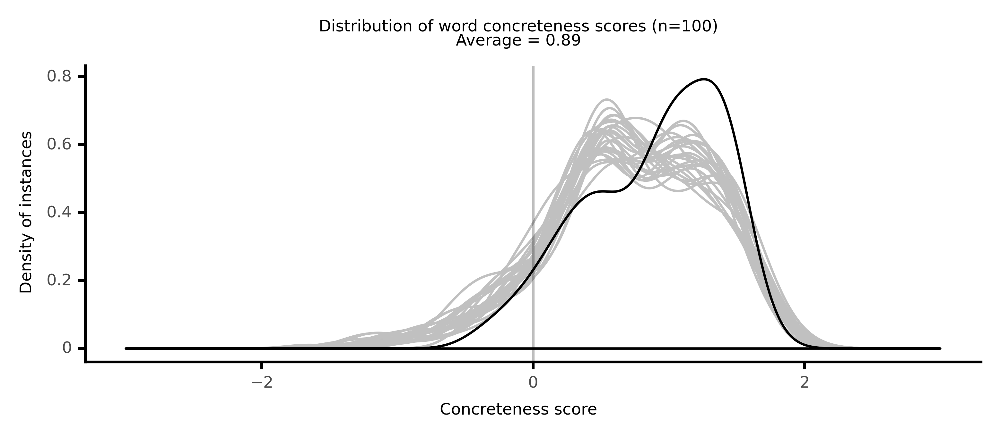

<ggplot: (8786710714905)>

100%|██████████| 25/25 [05:49<00:00, 13.97s/it]


In [7]:
show_extremes(dfall)